In [1]:
import torch
import torch.nn as nn
import time
import argparse

import os
import datetime

from torch.distributions.categorical import Categorical

# visualization 
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

device = torch.device("cpu"); gpu_id = -1 # select CPU

gpu_id = '0' # select a single GPU  
#gpu_id = '2,3' # select multiple GPUs  
os.environ["CUDA_VISIBLE_DEVICES"] = str(gpu_id)  
if torch.cuda.is_available():
    device = torch.device("cuda")
    print('GPU name: {:s}, gpu_id: {:s}'.format(torch.cuda.get_device_name(0),gpu_id))   
    
print(device)
print('pytorch version = ',torch.__version__)

GPU name: NVIDIA GeForce RTX 2080 Ti, gpu_id: 0
cuda
pytorch version =  1.10.0


In [2]:
import math
import numpy as np
import torch.nn.functional as F
import random
import torch.optim as optim
from torch.autograd import Variable
from torch.optim import lr_scheduler
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
class TransEncoderNet(nn.Module):
    """
    Encoder network based on self-attention transformer
    Inputs :  
      h of size      (bsz, nb_nodes, dim_emb)    batch of input cities
    Outputs :  
      h of size      (bsz, nb_nodes, dim_emb)    batch of encoded cities
      score of size  (bsz, nb_nodes, nb_nodes+1) batch of attention scores
    """
    
    def __init__(self, nb_layers, dim_emb, nb_heads, dim_ff, batchnorm):
        super(TransEncoderNet, self).__init__()
        assert dim_emb == nb_heads* (dim_emb//nb_heads) # check if dim_emb is divisible by nb_heads
        self.MHA_layers = nn.ModuleList( [nn.MultiheadAttention(dim_emb, nb_heads) for _ in range(nb_layers)] )
        self.linear1_layers = nn.ModuleList( [nn.Linear(dim_emb, dim_ff) for _ in range(nb_layers)] )
        self.linear2_layers = nn.ModuleList( [nn.Linear(dim_ff, dim_emb) for _ in range(nb_layers)] )   
        if batchnorm:
            self.norm1_layers = nn.ModuleList( [nn.BatchNorm1d(dim_emb) for _ in range(nb_layers)] )
            self.norm2_layers = nn.ModuleList( [nn.BatchNorm1d(dim_emb) for _ in range(nb_layers)] )
        else:
            self.norm1_layers = nn.ModuleList( [nn.LayerNorm(dim_emb) for _ in range(nb_layers)] )
            self.norm2_layers = nn.ModuleList( [nn.LayerNorm(dim_emb) for _ in range(nb_layers)] )
        self.nb_layers = nb_layers
        self.nb_heads = nb_heads
        self.batchnorm = batchnorm
        
    def forward(self, h):      
        # PyTorch nn.MultiheadAttention requires input size (seq_len, bsz, dim_emb) 
        h = h.transpose(0,1) # size(h)=(nb_nodes, bsz, dim_emb)  
        # L layers
        for i in range(self.nb_layers):
            h_rc = h # residual connection, size(h_rc)=(nb_nodes, bsz, dim_emb)
            h, score = self.MHA_layers[i](h, h, h) # size(h)=(nb_nodes, bsz, dim_emb), size(score)=(bsz, nb_nodes, nb_nodes)
            # add residual connection
            
            h = h_rc + h # size(h)=(nb_nodes, bsz, dim_emb)
            if self.batchnorm:
                # Pytorch nn.BatchNorm1d requires input size (bsz, dim, seq_len)
                h = h.permute(1,2,0).contiguous() # size(h)=(bsz, dim_emb, nb_nodes)
                h = self.norm1_layers[i](h)       # size(h)=(bsz, dim_emb, nb_nodes)
                h = h.permute(2,0,1).contiguous() # size(h)=(nb_nodes, bsz, dim_emb)
            else:
                h = self.norm1_layers[i](h)       # size(h)=(nb_nodes, bsz, dim_emb) 
            # feedforward
            h_rc = h # residual connection
            h = self.linear2_layers[i](torch.relu(self.linear1_layers[i](h)))
            h = h_rc + h # size(h)=(nb_nodes, bsz, dim_emb)
            if self.batchnorm:
                h = h.permute(1,2,0).contiguous() # size(h)=(bsz, dim_emb, nb_nodes)
                h = self.norm2_layers[i](h)       # size(h)=(bsz, dim_emb, nb_nodes)
                h = h.permute(2,0,1).contiguous() # size(h)=(nb_nodes, bsz, dim_emb)
            else:
                h = self.norm2_layers[i](h) # size(h)=(nb_nodes, bsz, dim_emb)
        # Transpose h
        h = h.transpose(0,1) # size(h)=(bsz, nb_nodes, dim_emb)
        return h, score
    

class Attention(nn.Module):
    def __init__(self, n_hidden):
        super(Attention, self).__init__()
        self.size = 0
        self.batch_size = 0
        self.dim = n_hidden
        
        v  = torch.FloatTensor(n_hidden)
        self.v  = nn.Parameter(v)
        self.v.data.uniform_(-1/math.sqrt(n_hidden), 1/math.sqrt(n_hidden))
        
        # parameters for pointer attention
        self.Wref = nn.Linear(n_hidden, n_hidden)
        self.Wq = nn.Linear(n_hidden, n_hidden)
    
    
    def forward(self, q, ref):       # query and reference
        self.batch_size = q.size(0)
        self.size = int(ref.size(0) / self.batch_size)
        q = self.Wq(q)     # (B, dim)
        ref = self.Wref(ref)
        ref = ref.view(self.batch_size, self.size, self.dim)  # (B, size, dim)
        
        q_ex = q.unsqueeze(1).repeat(1, self.size, 1) # (B, size, dim)
        # v_view: (B, dim, 1)
        v_view = self.v.unsqueeze(0).expand(self.batch_size, self.dim).unsqueeze(2)
        
        # (B, size, dim) * (B, dim, 1)
        u = torch.bmm(torch.tanh(q_ex + ref), v_view).squeeze(2)
        
        return u, ref
    
class LSTM(nn.Module):
    def __init__(self, n_hidden):
        super(LSTM, self).__init__()
        
        # parameters for input gate
        self.Wxi = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Whi = nn.Linear(n_hidden, n_hidden)    # W(ht)
        self.wci = nn.Linear(n_hidden, n_hidden)    # w(ct)
        
        # parameters for forget gate
        self.Wxf = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Whf = nn.Linear(n_hidden, n_hidden)    # W(ht)
        self.wcf = nn.Linear(n_hidden, n_hidden)    # w(ct)
        
        # parameters for cell gate
        self.Wxc = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Whc = nn.Linear(n_hidden, n_hidden)    # W(ht)
        
        # parameters for forget gate
        self.Wxo = nn.Linear(n_hidden, n_hidden)    # W(xt)
        self.Who = nn.Linear(n_hidden, n_hidden)    # W(ht)
        self.wco = nn.Linear(n_hidden, n_hidden)    # w(ct)
    
    
    def forward(self, x, h, c):       # query and reference
        
        # input gate
        i = torch.sigmoid(self.Wxi(x) + self.Whi(h) + self.wci(c))
        # forget gate
        f = torch.sigmoid(self.Wxf(x) + self.Whf(h) + self.wcf(c))
        # cell gate
        c = f * c + i * torch.tanh(self.Wxc(x) + self.Whc(h))
        # output gate
        o = torch.sigmoid(self.Wxo(x) + self.Who(h) + self.wco(c))
        
        h = o * torch.tanh(c)
        
        return h, c

class HPN(nn.Module):
    def __init__(self, n_feature, n_hidden):

        super(HPN, self).__init__()
        self.city_size = 0
        self.batch_size = 0
        self.dim = n_hidden
        
        # lstm for first turn
        #self.lstm0 = nn.LSTM(n_hidden, n_hidden)
        
        # pointer layer
        self.pointer = Attention(n_hidden)
        self.TransPointer = Attention(n_hidden)
        
        # lstm encoder
        self.encoder = LSTM(n_hidden)
        
        # trainable first hidden input
        h0 = torch.FloatTensor(n_hidden)
        c0 = torch.FloatTensor(n_hidden)
        # trainable latent variable coefficient
        print('here') 
        alpha = torch.ones(1).cuda()       
        self.h0 = nn.Parameter(h0)
        self.c0 = nn.Parameter(c0)
        
        self.alpha = nn.Parameter(alpha)
        self.h0.data.uniform_(-1/math.sqrt(n_hidden), 1/math.sqrt(n_hidden))
        self.c0.data.uniform_(-1/math.sqrt(n_hidden), 1/math.sqrt(n_hidden))
        
        r1 = torch.ones(1)
        r2 = torch.ones(1)
        r3 = torch.ones(1)
        self.r1 = nn.Parameter(r1)
        self.r2 = nn.Parameter(r2)
        self.r3 = nn.Parameter(r3)
        
        # embedding
        self.embedding_x = nn.Linear(n_feature, n_hidden)
        self.embedding_all = nn.Linear(n_feature, n_hidden)
        self.Transembedding_all = TransEncoderNet(6, 128, 8, 512, batchnorm=True)#6,128,8,512
        
        # vector to start decoding 
        self.start_placeholder = nn.Parameter(torch.randn(n_hidden))
        
        # weights for GNN
        self.W1 = nn.Linear(n_hidden, n_hidden)
        self.W2 = nn.Linear(n_hidden, n_hidden)
        self.W3 = nn.Linear(n_hidden, n_hidden)
        
        # aggregation function for GNN
        self.agg_1 = nn.Linear(n_hidden, n_hidden)
        self.agg_2 = nn.Linear(n_hidden, n_hidden)
        self.agg_3 = nn.Linear(n_hidden, n_hidden)
    
    
    def forward(self,context,Transcontext, x, X_all, mask, h=None, c=None, latent=None):
        '''
        Inputs (B: batch size, size: city size, dim: hidden dimension)
        
        x: current city coordinate (B, 2)
        X_all: all cities' cooridnates (B, size, 2)
        mask: mask visited cities
        h: hidden variable (B, dim)
        c: cell gate (B, dim)
        latent: latent pointer vector from previous layer (B, size, dim)
        
        Outputs
        
        softmax: probability distribution of next city (B, size)
        h: hidden variable (B, dim)
        c: cell gate (B, dim)
        latent_u: latent pointer vector for next layer
        '''
        
        self.batch_size = X_all.size(0)
        self.city_size = X_all.size(1)
        
        # Check if this the first iteration loop
        if h is None or c is None:
            x          = self.start_placeholder    
            context = self.embedding_all(X_all)
            Transcontext,_ = self.Transembedding_all(context)
            
            # =============================
            # graph neural network encoder
            # =============================

            # (B, size, dim)
            context = context.reshape(-1, self.dim)
            Transcontext = Transcontext.reshape(-1, self.dim)

            context = self.r1 * self.W1(context)\
                + (1-self.r1) * F.relu(self.agg_1(context/(self.city_size-1)))

            context = self.r2 * self.W2(context)\
                + (1-self.r2) * F.relu(self.agg_2(context/(self.city_size-1)))

            context = self.r3 * self.W3(context)\
                + (1-self.r3) * F.relu(self.agg_3(context/(self.city_size-1)))
            h0 = self.h0.unsqueeze(0).expand(self.batch_size, self.dim)
            c0 = self.c0.unsqueeze(0).expand(self.batch_size, self.dim)

            h0 = h0.unsqueeze(0).contiguous()
            c0 = c0.unsqueeze(0).contiguous()
            
            # let h0, c0 be the hidden variable of first turn
            h = h0.squeeze(0)
            c = c0.squeeze(0)
        else:
            x          = self.embedding_x(x)
        # LSTM encoder1900/2500
        h, c = self.encoder(x, h, c)
        # query vector
        q = h
        # pointer
        u1, _ = self.pointer(q, context)
        u2 ,_ = self.TransPointer(q,Transcontext)
        # Avg Agg between the two attention vectors
        u = u2 #torch.maximum(u1,u2)
        latent_u = u.clone()
        u = 10 * torch.tanh(u) + mask
        return context,Transcontext,F.softmax(u, dim=1), h, c, latent_u

# daniel rectangle feature handle

In [3]:
'''
This part I designed the rectangle-characterized TSP, that means for every step the agent walk through a corner,
then he travel through the whole rectangle using zig-zag, finally he ends up at one of the rest corners of 
the rextangle, so, it equals the agent walk through three points at one step, in practice, I add three points into 
mask to make them unselectable.
'''
def rectangle_process(f_temp,idx,Y,Y0,mask,k,B):
    Y1 = Y[zero_to_bsz, idx.data].clone()
    rectangle_inf = idx/4
    feature_table = f_temp.outcorner_getout(rectangle_inf,B)
    feature_table = torch.Tensor(feature_table).type(torch.long)
    Y_corner = Y[zero_to_bsz, feature_table[:,0].data].clone()
    if k ==0:
        reward = 0
    if k > 0:
        reward = torch.sum((Y1 - Y0)**2 , dim=1 )**0.5
        reward += torch.sum((Y_corner - Y1)**2 , dim=1 )**0.5
#         dis = (Y1 - Y0)**2
#         dis_1 = (Y_corner - Y1)**2
#         reward = torch.maximum(dis[:,0],dis[:,1])**0.5
#         reward += torch.maximum(dis_1[:,0],dis_1[:,1])**0.5  
    mask[zero_to_bsz, idx.data] += -np.inf
    mask[zero_to_bsz, feature_table[:,0].data] += -np.inf
    mask[zero_to_bsz, feature_table[:,1].data] += -np.inf    
    mask[zero_to_bsz, feature_table[:,2].data] += -np.inf 
    return reward, Y_corner, Y_corner
def rectangle_process_actor(f_temp,idx,Y,Y0,mask,k,B,i,path_gazebo):
    Y1 = Y[zero_to_bsz, idx.data].clone()
    rectangle_inf = idx/4
    feature_table = f_temp.outcorner_getout(rectangle_inf,B)
    feature_table = torch.Tensor(feature_table).type(torch.long)
    Y_corner = Y[zero_to_bsz, feature_table[:,0].data].clone()
    if i % 100 == 0:
        path_gazebo.append([idx.data[0].tolist(),feature_table[:,0].data[0].tolist()])
    if k ==0:
        reward = 0
    if k > 0:
        reward = torch.sum((Y1 - Y0)**2 , dim=1 )**0.5
        reward += torch.sum((Y_corner - Y1)**2 , dim=1 )**0.5
#         dis = (Y1 - Y0)**2
#         dis_1 = (Y_corner - Y1)**2
#         reward = torch.maximum(dis[:,0],dis[:,1])**0.5
#         reward += torch.maximum(dis_1[:,0],dis_1[:,1])**0.5  
    mask[zero_to_bsz, idx.data] += -np.inf
    mask[zero_to_bsz, feature_table[:,0].data] += -np.inf
    mask[zero_to_bsz, feature_table[:,1].data ] += -np.inf    
    mask[zero_to_bsz, feature_table[:,2].data ] += -np.inf 
    return reward, Y_corner, Y_corner

prepare to train
Hyper parameters:
learning rate 0.0001
batch size 256
steps 2500
epoch 100
here
here
epoch:0, batch:100/2500, reward:4920.79296875


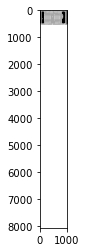

record the last path to gazebo for showing up


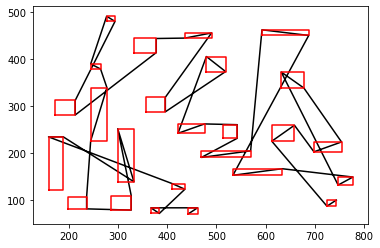

epoch:0, batch:200/2500, reward:4810.6640625


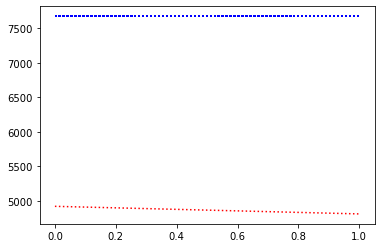

record the last path to gazebo for showing up


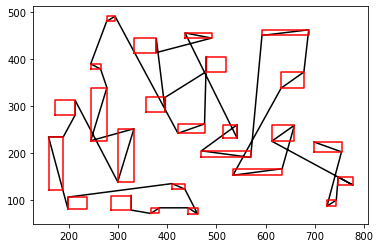

epoch:0, batch:300/2500, reward:4386.935546875


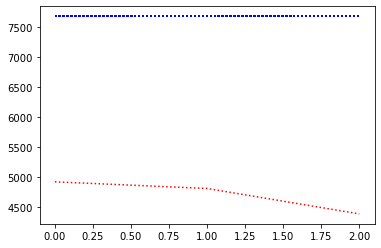

record the last path to gazebo for showing up


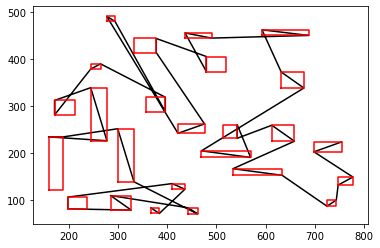

epoch:0, batch:400/2500, reward:4466.6591796875


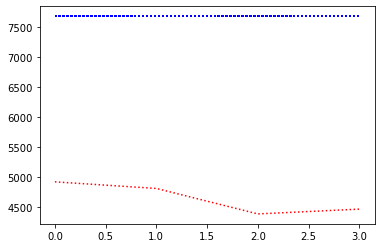

record the last path to gazebo for showing up


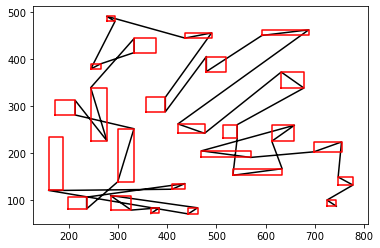

epoch:0, batch:500/2500, reward:4592.14697265625


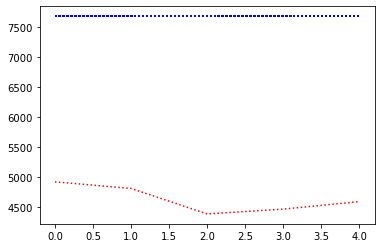

record the last path to gazebo for showing up


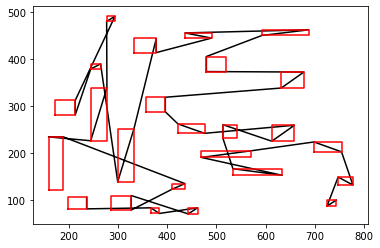

epoch:0, batch:600/2500, reward:4141.8310546875


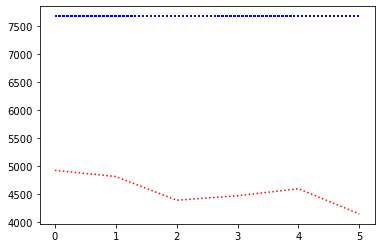

record the last path to gazebo for showing up


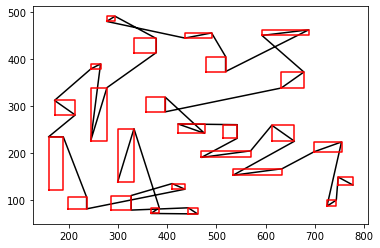

epoch:0, batch:700/2500, reward:4101.3486328125


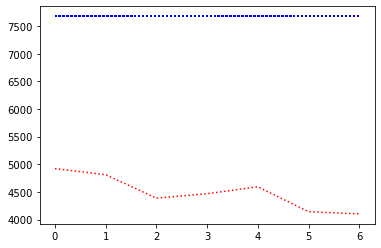

record the last path to gazebo for showing up


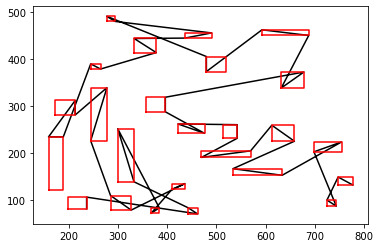

epoch:0, batch:800/2500, reward:4109.912109375


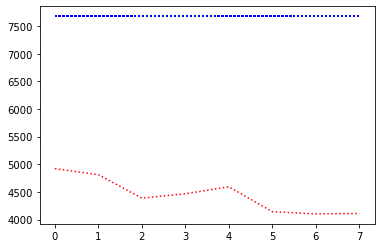

record the last path to gazebo for showing up


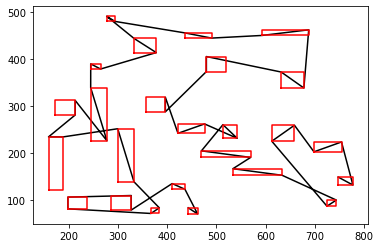

epoch:0, batch:900/2500, reward:4088.50537109375


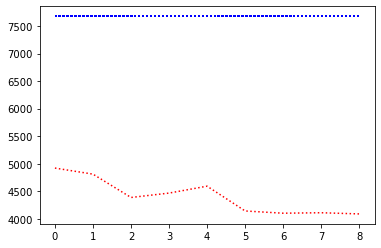

record the last path to gazebo for showing up


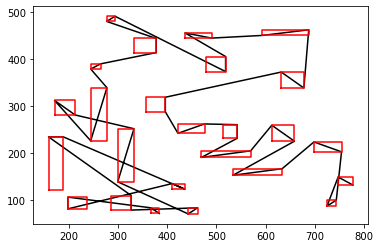

epoch:0, batch:1000/2500, reward:4017.50390625


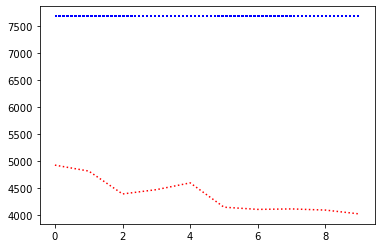

record the last path to gazebo for showing up


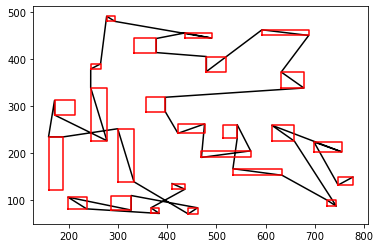

epoch:0, batch:1100/2500, reward:4008.0087890625


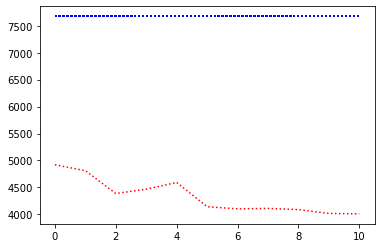

record the last path to gazebo for showing up


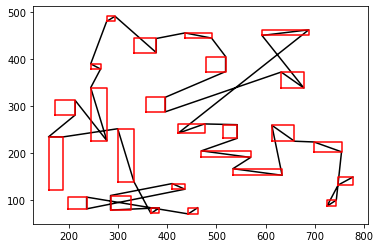

epoch:0, batch:1200/2500, reward:3844.24658203125


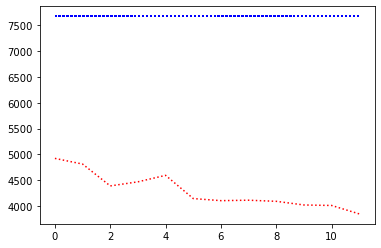

record the last path to gazebo for showing up


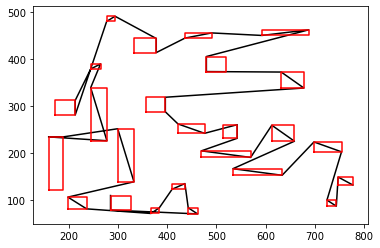

epoch:0, batch:1300/2500, reward:3843.062255859375


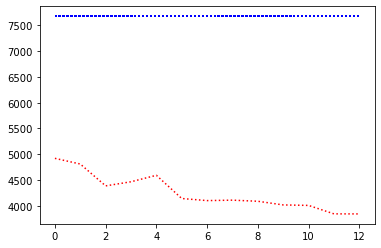

record the last path to gazebo for showing up


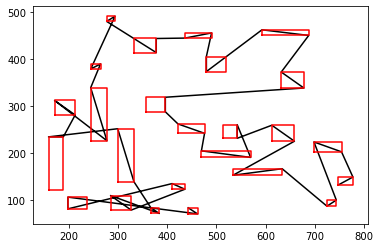

epoch:0, batch:1400/2500, reward:3850.9892578125


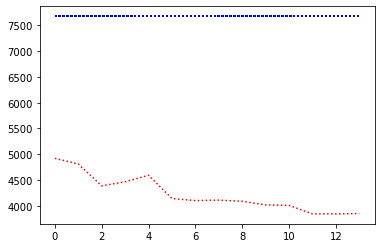

record the last path to gazebo for showing up


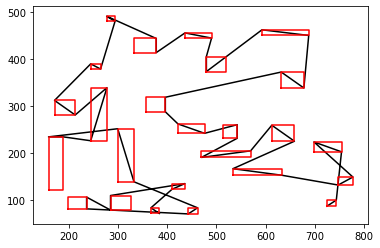

epoch:0, batch:1500/2500, reward:4002.89453125


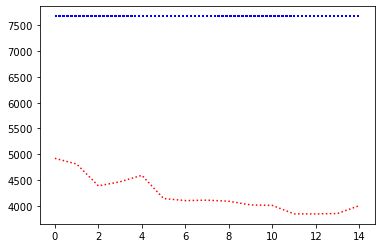

record the last path to gazebo for showing up


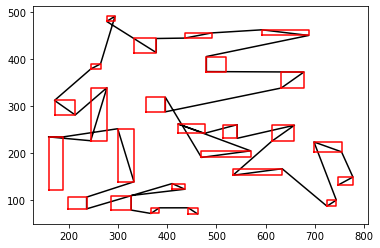

epoch:0, batch:1600/2500, reward:3753.14990234375


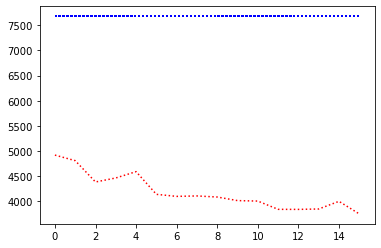

record the last path to gazebo for showing up


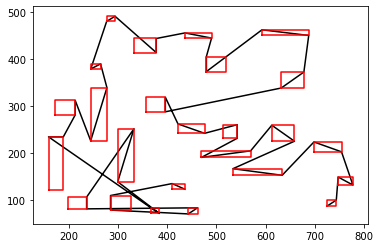

epoch:0, batch:1700/2500, reward:3813.466796875


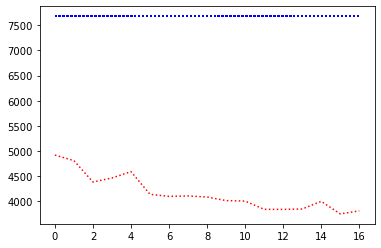

record the last path to gazebo for showing up


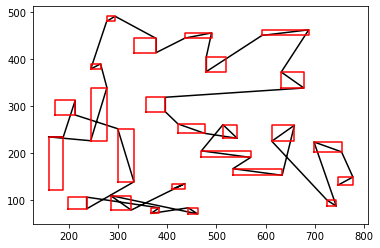

epoch:0, batch:1800/2500, reward:3857.216796875


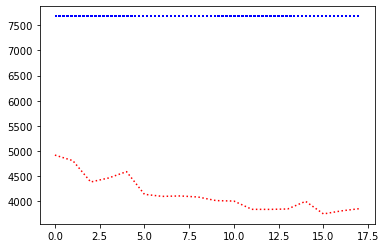

record the last path to gazebo for showing up


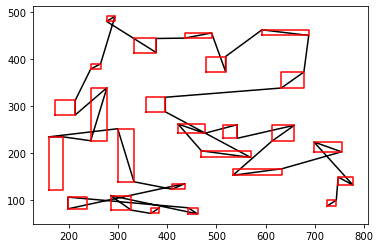

epoch:0, batch:1900/2500, reward:3946.345458984375


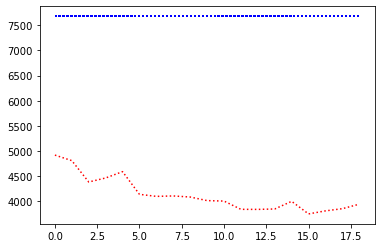

record the last path to gazebo for showing up


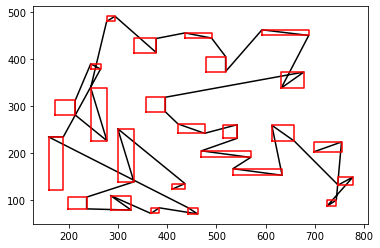

epoch:0, batch:2000/2500, reward:3797.120849609375


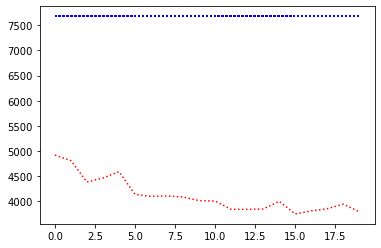

record the last path to gazebo for showing up


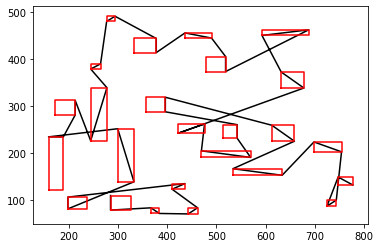

epoch:0, batch:2100/2500, reward:3904.122802734375


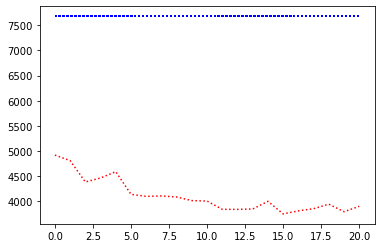

record the last path to gazebo for showing up


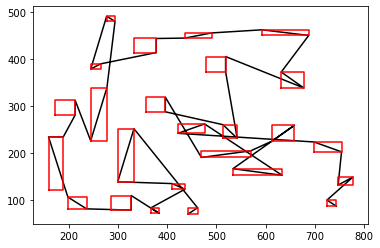

epoch:0, batch:2200/2500, reward:3783.230712890625


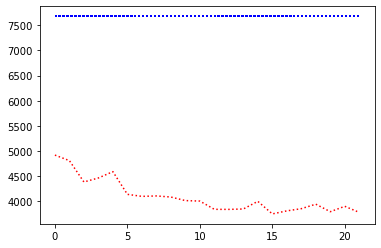

record the last path to gazebo for showing up


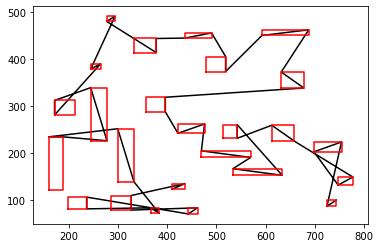

epoch:0, batch:2300/2500, reward:3886.80859375


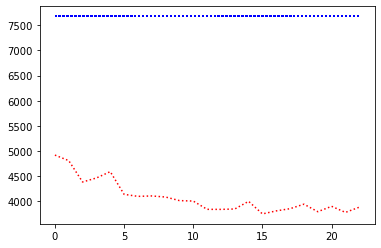

record the last path to gazebo for showing up


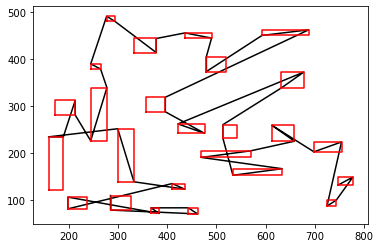

epoch:0, batch:2400/2500, reward:3850.30810546875


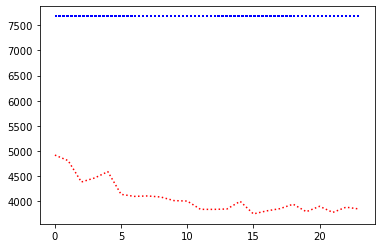

record the last path to gazebo for showing up


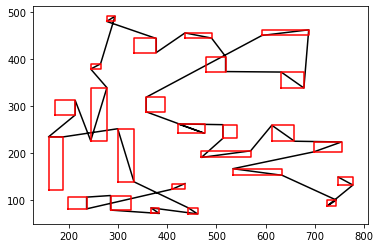

epoch:0, batch:2500/2500, reward:3741.45068359375


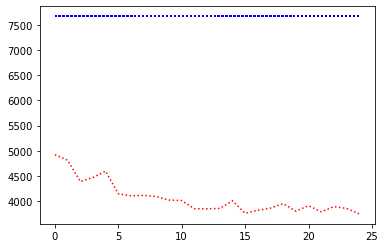

record the last path to gazebo for showing up


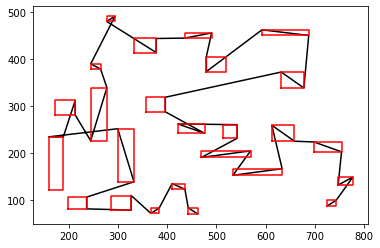

Avg Actor 3405.368408203125 --- Avg Critic 7676.8857421875
My actor is going on the right road Hallelujah :) Updated
Epoch: 0, epoch time: 53.627min, tot time: 0.037day, L_actor: 3405.368, L_critic: 7676.886, update: True
Save Checkpoints
epoch:1, batch:100/2500, reward:3673.37060546875


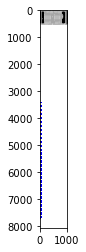

record the last path to gazebo for showing up


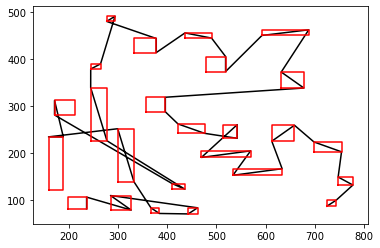

epoch:1, batch:200/2500, reward:3628.017578125


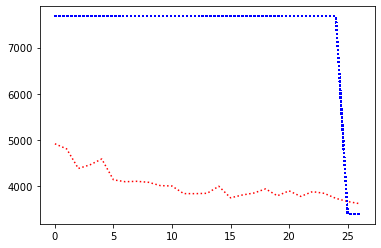

record the last path to gazebo for showing up


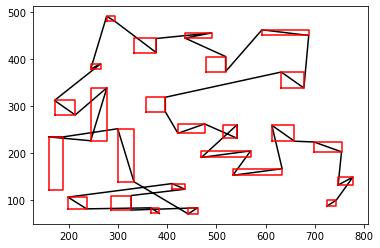

epoch:1, batch:300/2500, reward:3611.83056640625


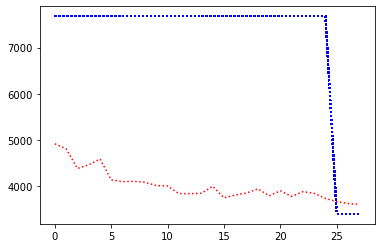

record the last path to gazebo for showing up


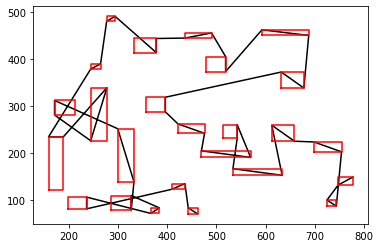

epoch:1, batch:400/2500, reward:3566.748779296875


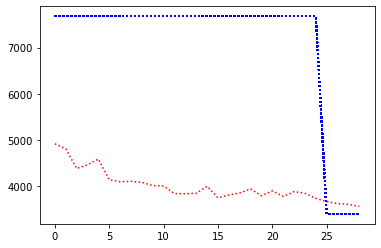

record the last path to gazebo for showing up


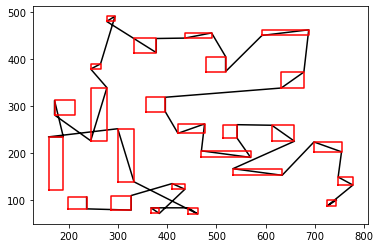

epoch:1, batch:500/2500, reward:3533.0322265625


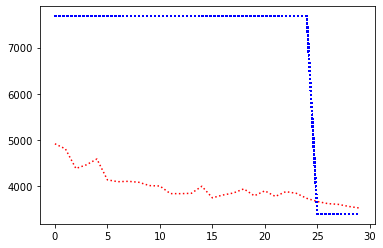

record the last path to gazebo for showing up


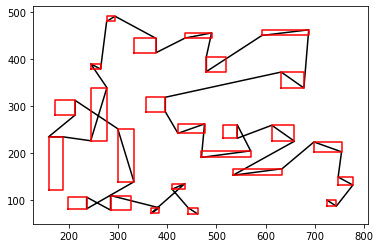

epoch:1, batch:600/2500, reward:3489.593505859375


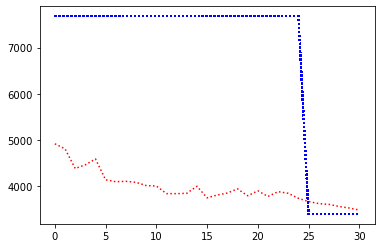

record the last path to gazebo for showing up


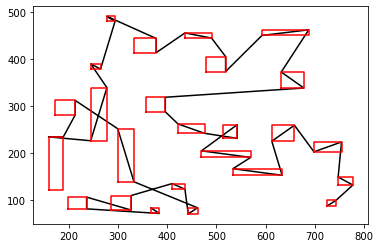

epoch:1, batch:700/2500, reward:3482.9072265625


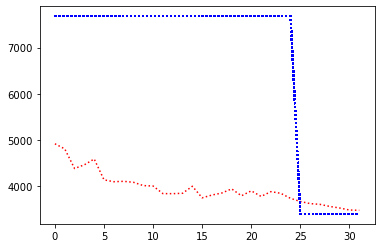

record the last path to gazebo for showing up


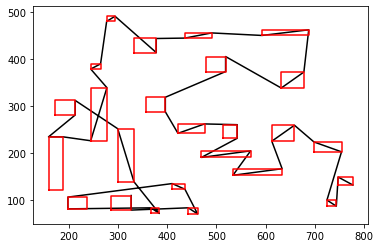

epoch:1, batch:800/2500, reward:3467.21875


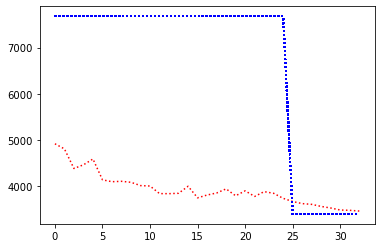

record the last path to gazebo for showing up


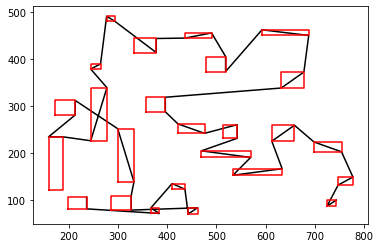

epoch:1, batch:900/2500, reward:3409.47998046875


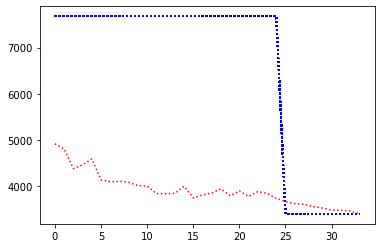

record the last path to gazebo for showing up


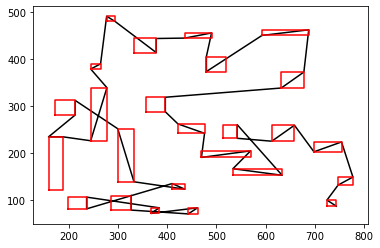

epoch:1, batch:1000/2500, reward:3363.532470703125


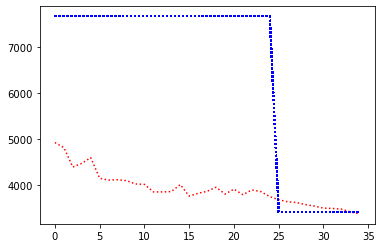

record the last path to gazebo for showing up


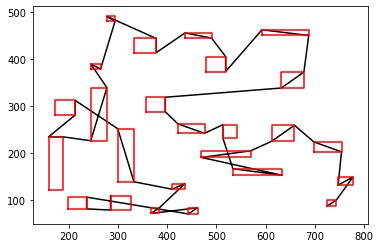

epoch:1, batch:1100/2500, reward:3322.1376953125


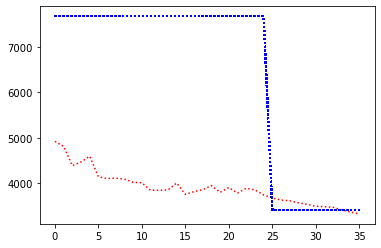

record the last path to gazebo for showing up


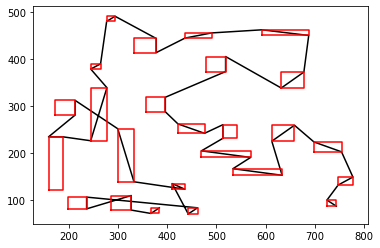

epoch:1, batch:1200/2500, reward:3331.77978515625


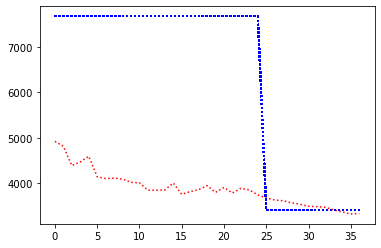

record the last path to gazebo for showing up


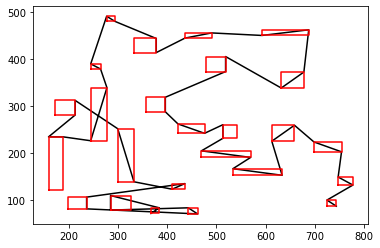

epoch:1, batch:1300/2500, reward:3278.79248046875


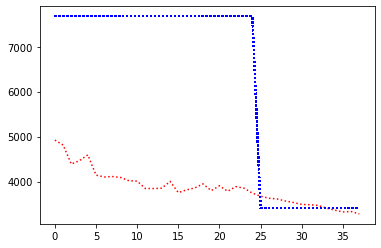

record the last path to gazebo for showing up


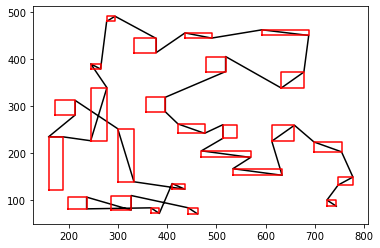

epoch:1, batch:1400/2500, reward:3294.1884765625


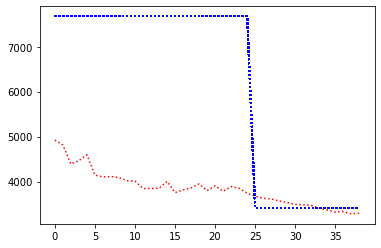

record the last path to gazebo for showing up


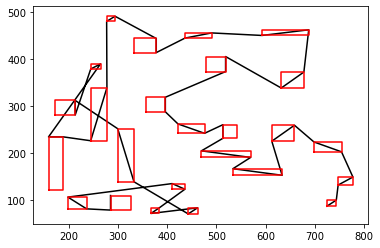

epoch:1, batch:1500/2500, reward:3282.815185546875


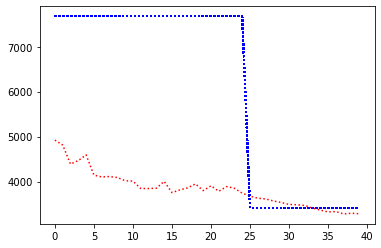

record the last path to gazebo for showing up


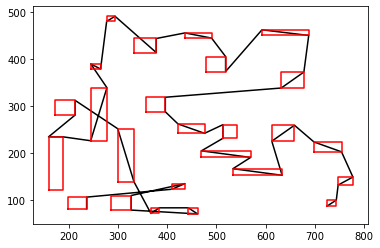

epoch:1, batch:1600/2500, reward:3250.453125


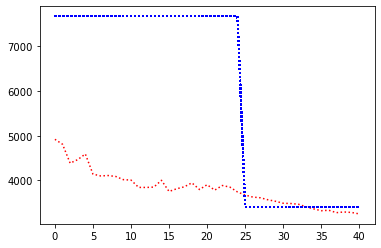

record the last path to gazebo for showing up


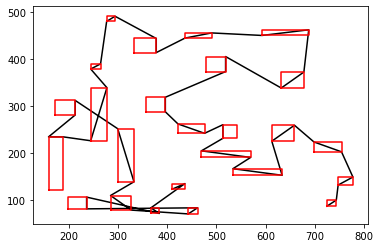

epoch:1, batch:1700/2500, reward:3247.51611328125


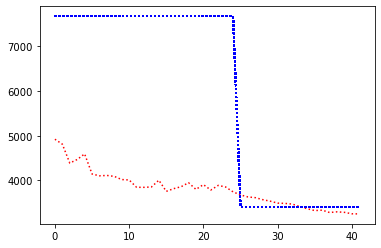

record the last path to gazebo for showing up


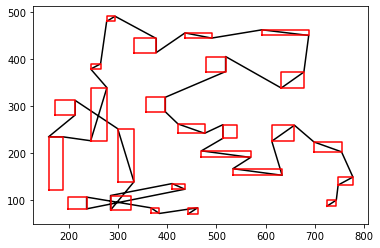

epoch:1, batch:1800/2500, reward:3258.42236328125


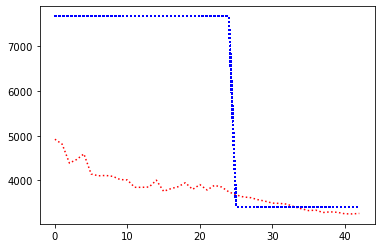

record the last path to gazebo for showing up


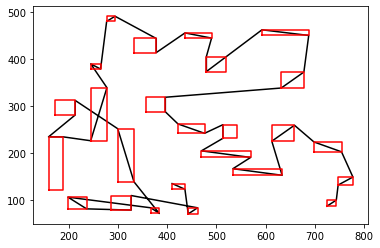

epoch:1, batch:1900/2500, reward:3250.2197265625


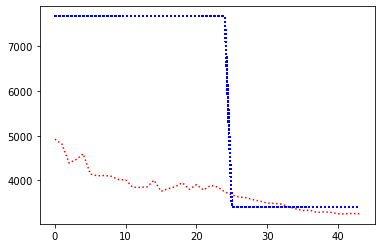

record the last path to gazebo for showing up


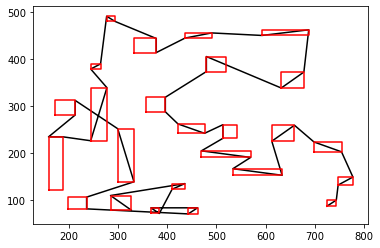

epoch:1, batch:2000/2500, reward:3260.641357421875


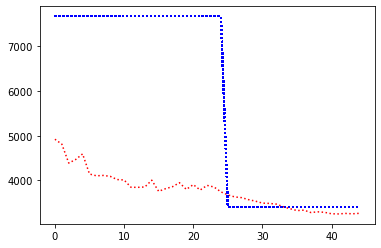

record the last path to gazebo for showing up


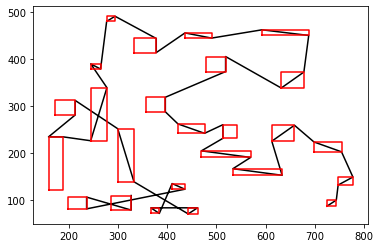

epoch:1, batch:2100/2500, reward:3242.592041015625


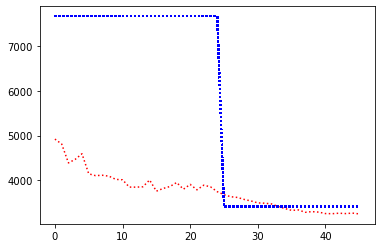

record the last path to gazebo for showing up


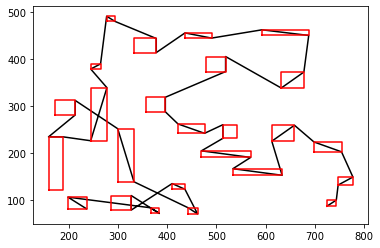

epoch:1, batch:2200/2500, reward:3234.51904296875


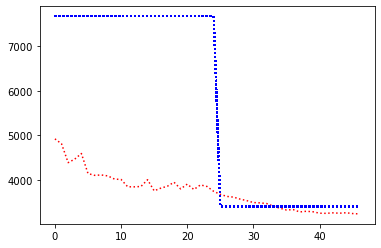

record the last path to gazebo for showing up


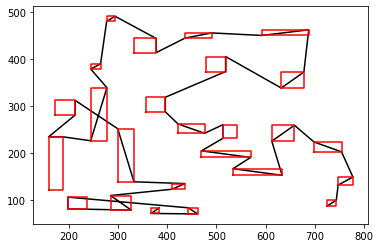

epoch:1, batch:2300/2500, reward:3230.41064453125


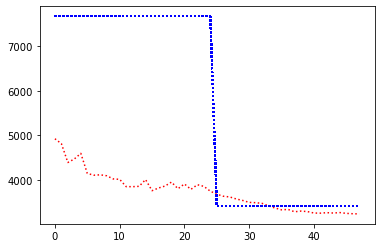

record the last path to gazebo for showing up


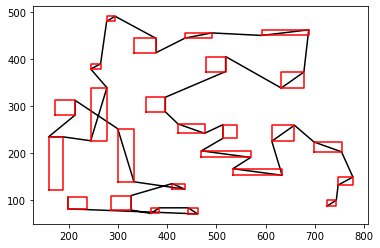

epoch:1, batch:2400/2500, reward:3223.055908203125


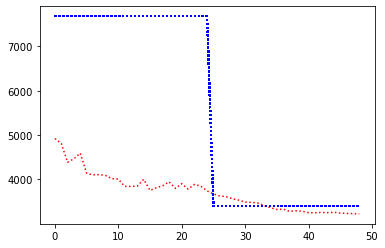

record the last path to gazebo for showing up


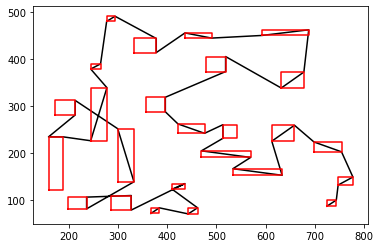

epoch:1, batch:2500/2500, reward:3224.5380859375


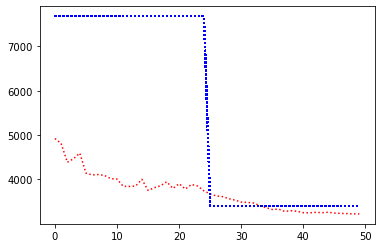

record the last path to gazebo for showing up


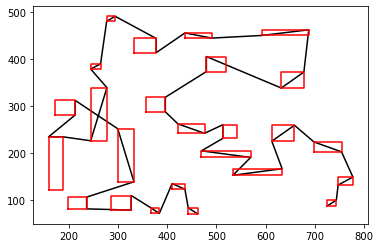

Avg Actor 3124.744140625 --- Avg Critic 3405.368408203125
My actor is going on the right road Hallelujah :) Updated
Epoch: 1, epoch time: 53.695min, tot time: 0.075day, L_actor: 3124.744, L_critic: 3405.368, update: True
Save Checkpoints
epoch:2, batch:100/2500, reward:3228.08349609375


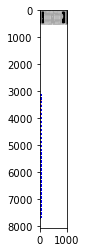

record the last path to gazebo for showing up


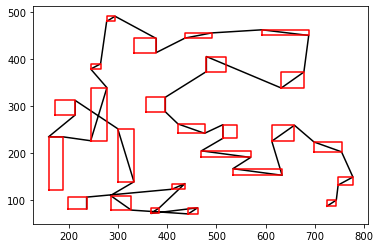

epoch:2, batch:200/2500, reward:3206.4658203125


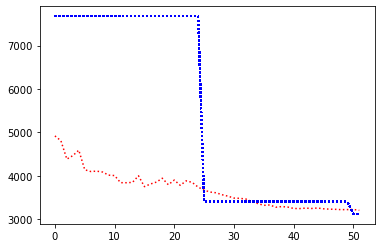

record the last path to gazebo for showing up


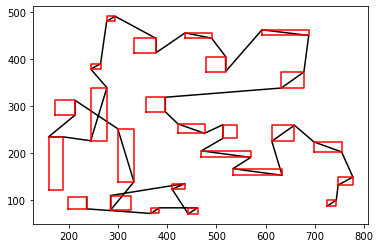

epoch:2, batch:300/2500, reward:3204.728271484375


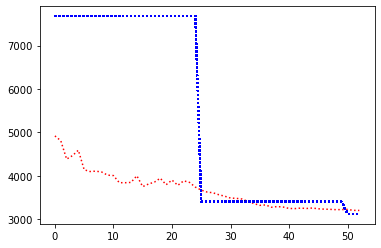

record the last path to gazebo for showing up


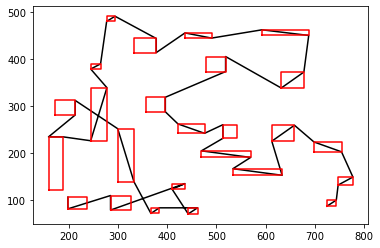

epoch:2, batch:400/2500, reward:3214.00048828125


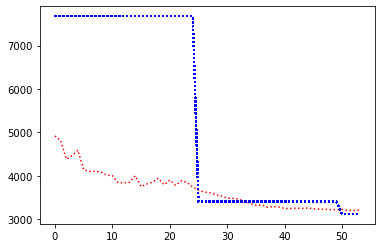

record the last path to gazebo for showing up


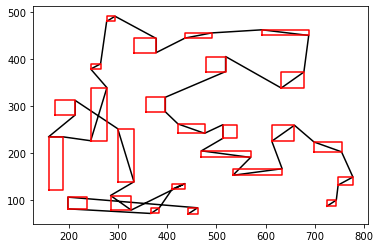

epoch:2, batch:500/2500, reward:3226.505859375


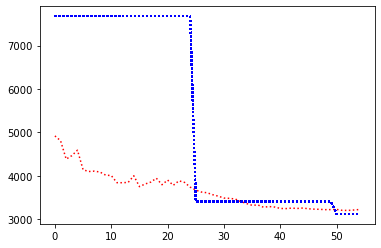

record the last path to gazebo for showing up


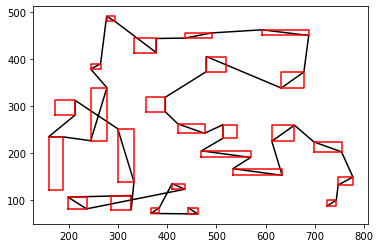

epoch:2, batch:600/2500, reward:3189.03857421875


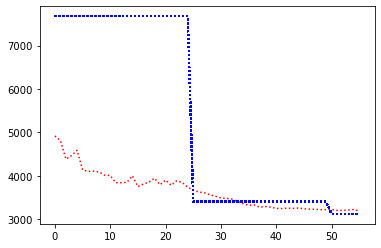

record the last path to gazebo for showing up


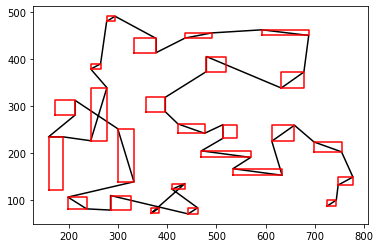

epoch:2, batch:700/2500, reward:3198.364990234375


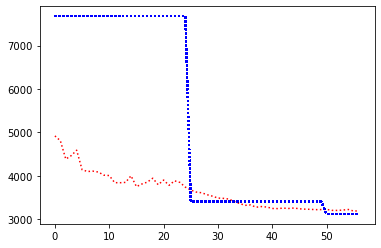

record the last path to gazebo for showing up


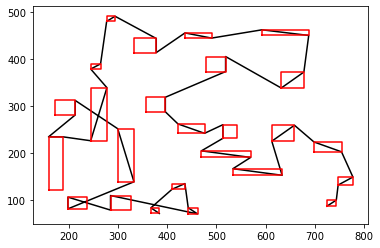

epoch:2, batch:800/2500, reward:3213.96142578125


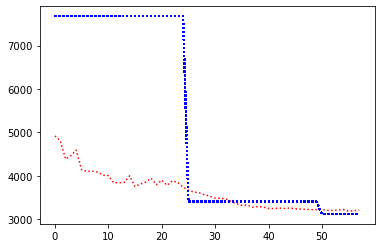

record the last path to gazebo for showing up


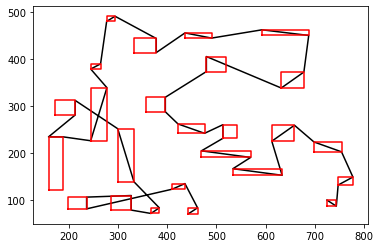

epoch:2, batch:900/2500, reward:3201.20263671875


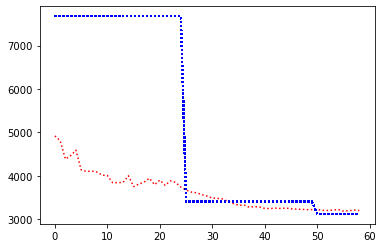

record the last path to gazebo for showing up


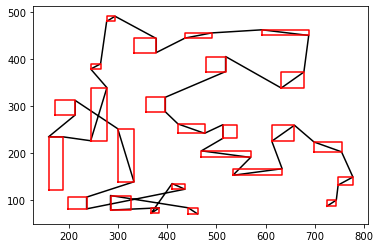

epoch:2, batch:1000/2500, reward:3217.92822265625


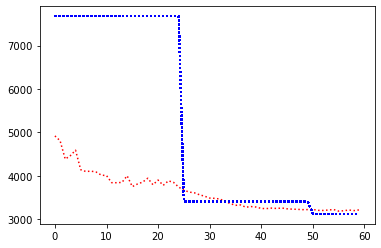

record the last path to gazebo for showing up


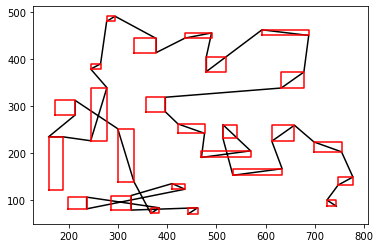

epoch:2, batch:1100/2500, reward:3204.283447265625


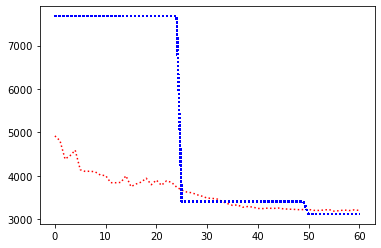

record the last path to gazebo for showing up


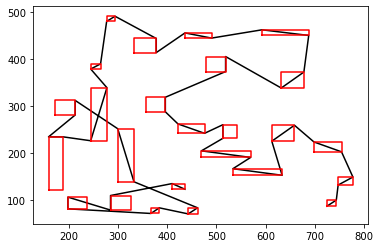

epoch:2, batch:1200/2500, reward:3203.331787109375


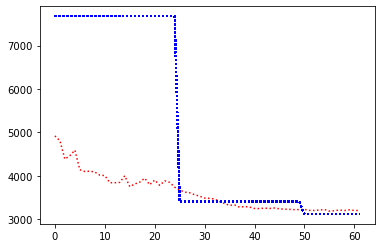

record the last path to gazebo for showing up


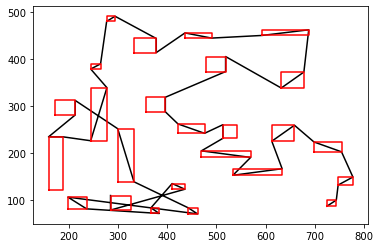

epoch:2, batch:1300/2500, reward:3207.884765625


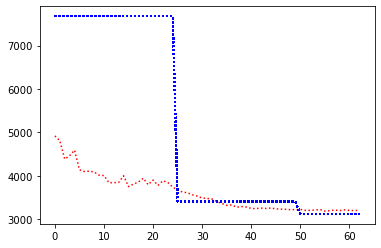

record the last path to gazebo for showing up


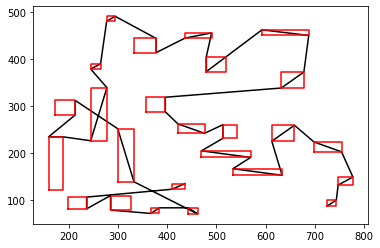

epoch:2, batch:1400/2500, reward:3187.72021484375


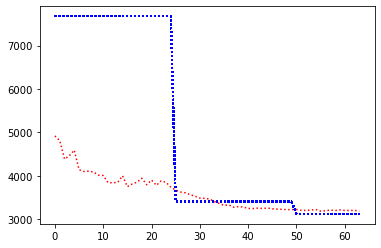

record the last path to gazebo for showing up


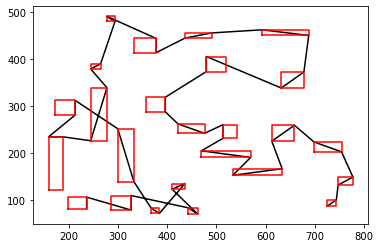

epoch:2, batch:1500/2500, reward:3235.512939453125


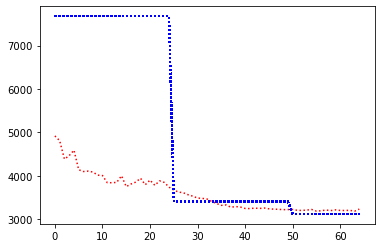

record the last path to gazebo for showing up


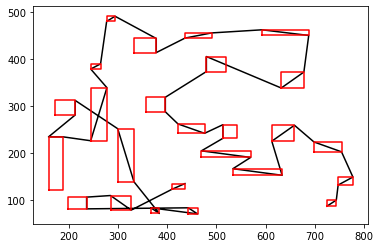

epoch:2, batch:1600/2500, reward:3198.022216796875


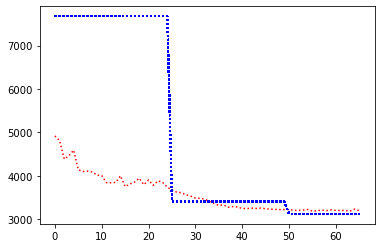

record the last path to gazebo for showing up


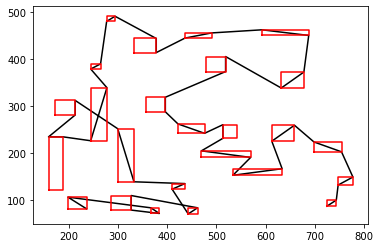

epoch:2, batch:1700/2500, reward:3196.796142578125


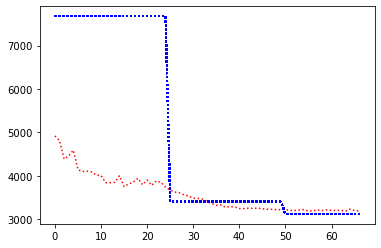

record the last path to gazebo for showing up


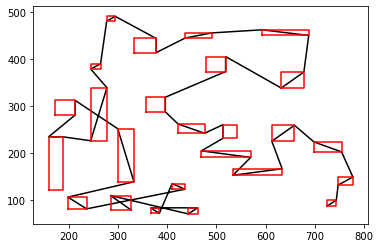

epoch:2, batch:1800/2500, reward:3232.5244140625


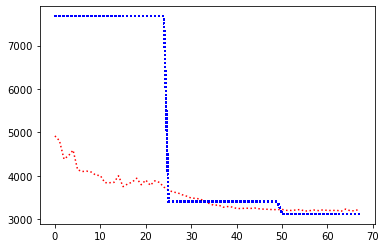

record the last path to gazebo for showing up


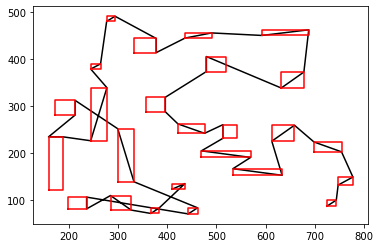

epoch:2, batch:1900/2500, reward:3208.60791015625


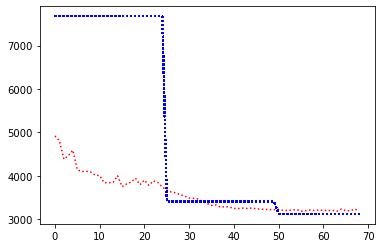

record the last path to gazebo for showing up


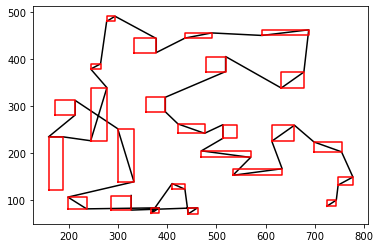

epoch:2, batch:2000/2500, reward:3200.89697265625


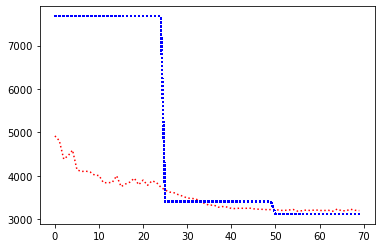

record the last path to gazebo for showing up


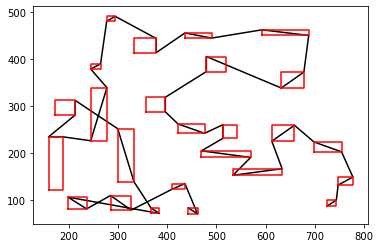

epoch:2, batch:2100/2500, reward:3204.4833984375


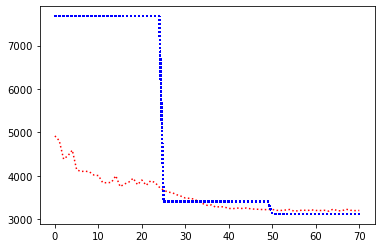

record the last path to gazebo for showing up


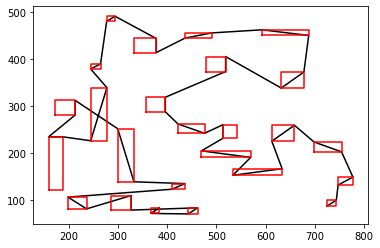

epoch:2, batch:2200/2500, reward:3211.0234375


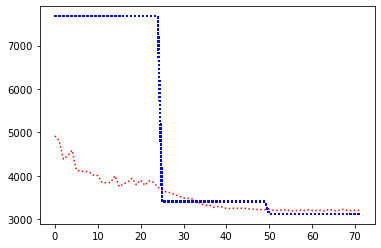

record the last path to gazebo for showing up


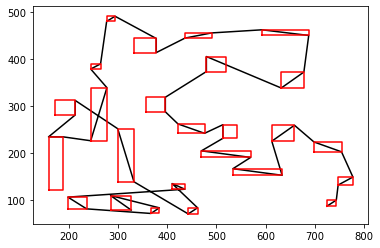

epoch:2, batch:2300/2500, reward:3202.19775390625


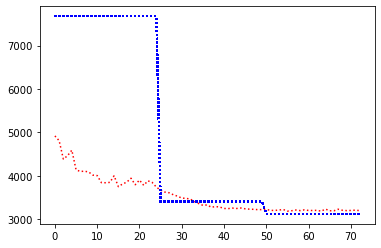

record the last path to gazebo for showing up


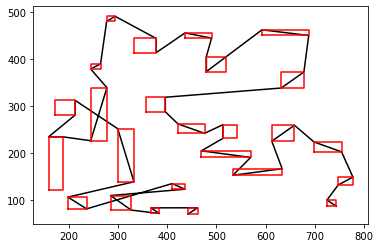

epoch:2, batch:2400/2500, reward:3194.4365234375


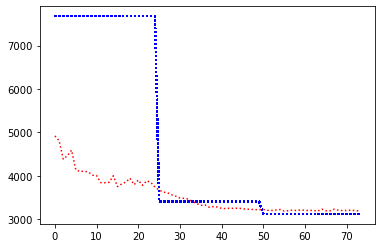

record the last path to gazebo for showing up


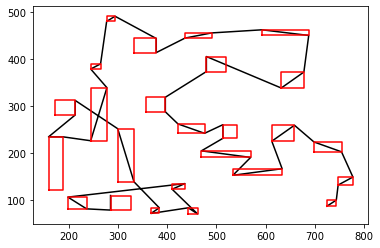

epoch:2, batch:2500/2500, reward:3209.749755859375


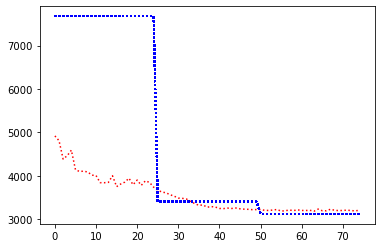

record the last path to gazebo for showing up


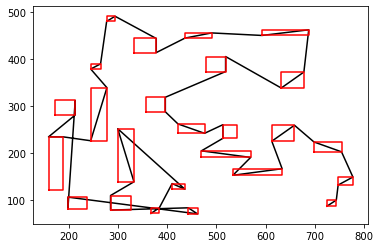

Avg Actor 3094.61376953125 --- Avg Critic 3124.744140625
My actor is going on the right road Hallelujah :) Updated
Epoch: 2, epoch time: 52.457min, tot time: 0.112day, L_actor: 3094.614, L_critic: 3124.744, update: True
Save Checkpoints
epoch:3, batch:100/2500, reward:3206.733154296875


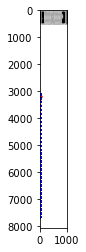

record the last path to gazebo for showing up


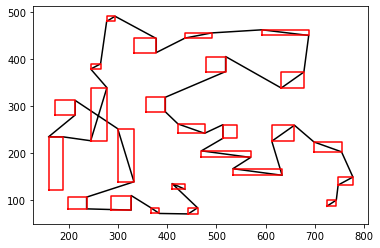

epoch:3, batch:200/2500, reward:3189.89697265625


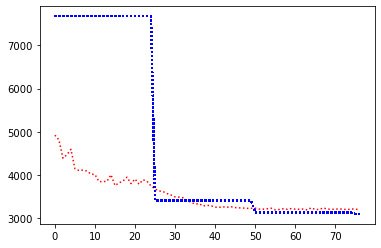

record the last path to gazebo for showing up


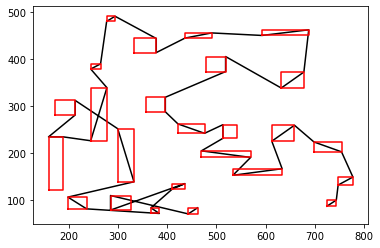

epoch:3, batch:300/2500, reward:3180.3408203125


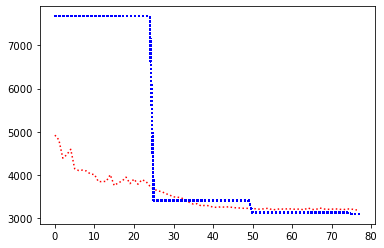

record the last path to gazebo for showing up


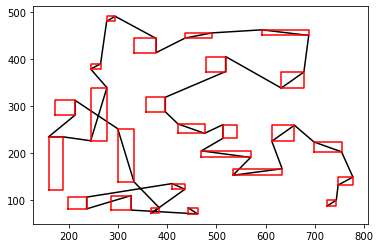

epoch:3, batch:400/2500, reward:3201.3955078125


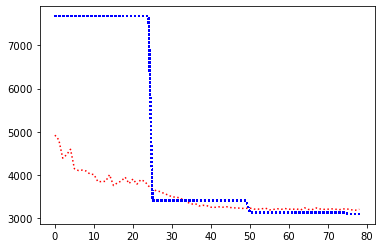

record the last path to gazebo for showing up


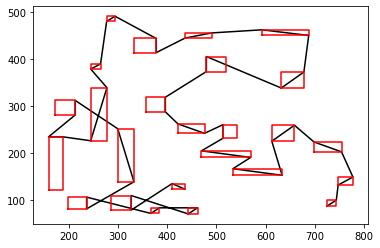

epoch:3, batch:500/2500, reward:3199.920166015625


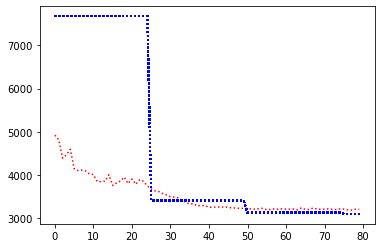

record the last path to gazebo for showing up


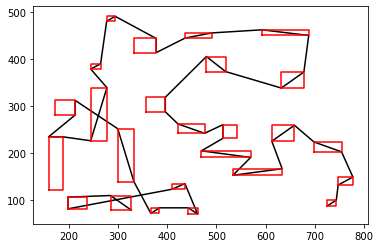

epoch:3, batch:600/2500, reward:3200.35302734375


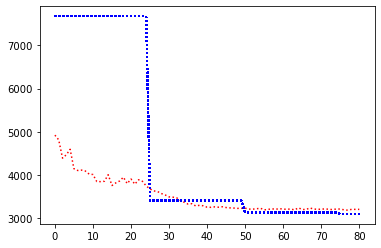

record the last path to gazebo for showing up


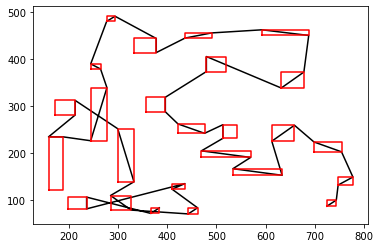

epoch:3, batch:700/2500, reward:3203.235107421875


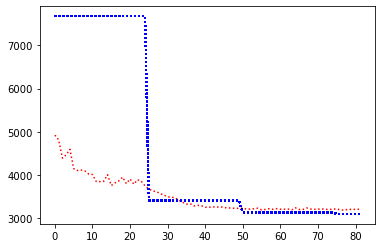

record the last path to gazebo for showing up


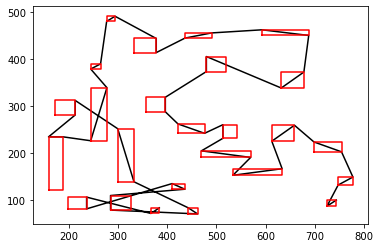

epoch:3, batch:800/2500, reward:3189.279541015625


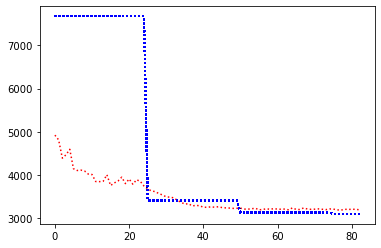

record the last path to gazebo for showing up


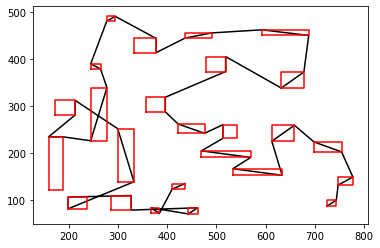

epoch:3, batch:900/2500, reward:3194.790283203125


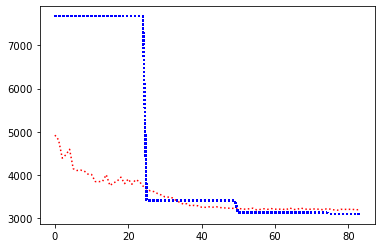

record the last path to gazebo for showing up


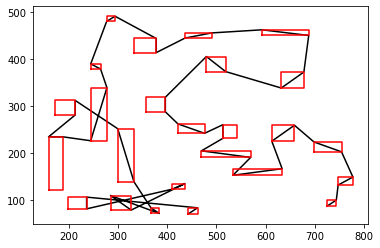

epoch:3, batch:1000/2500, reward:3190.41796875


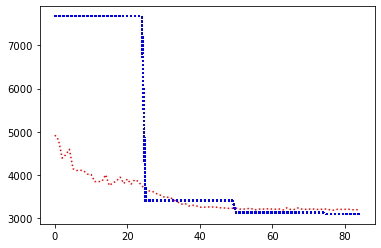

record the last path to gazebo for showing up


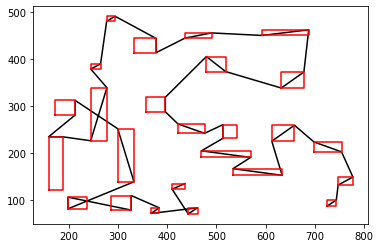

epoch:3, batch:1100/2500, reward:3172.967529296875


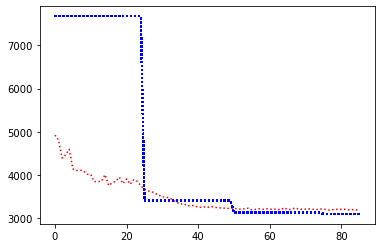

record the last path to gazebo for showing up


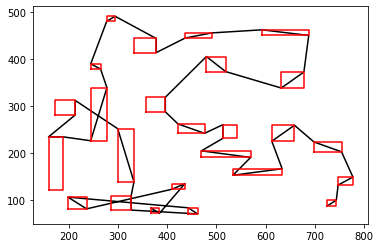

epoch:3, batch:1200/2500, reward:3174.476318359375


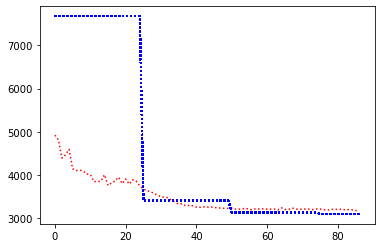

record the last path to gazebo for showing up


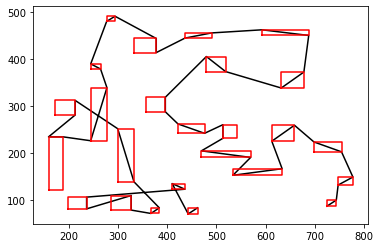

epoch:3, batch:1300/2500, reward:3204.122314453125


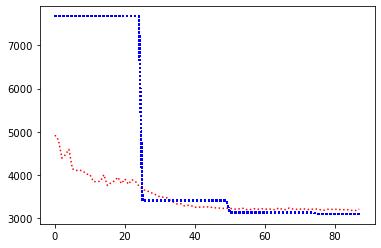

record the last path to gazebo for showing up


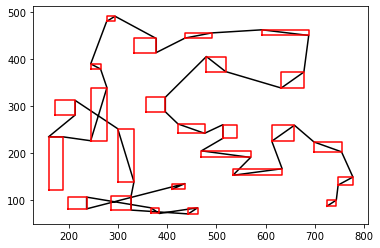

epoch:3, batch:1400/2500, reward:3188.334228515625


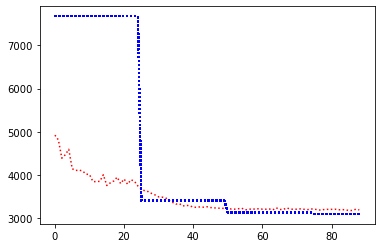

record the last path to gazebo for showing up


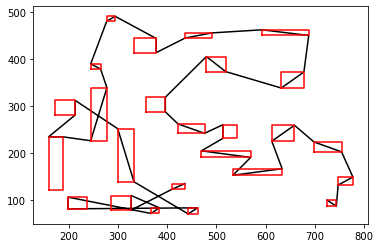

epoch:3, batch:1500/2500, reward:3181.99853515625


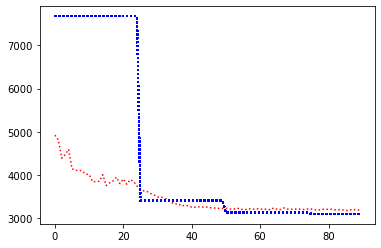

record the last path to gazebo for showing up


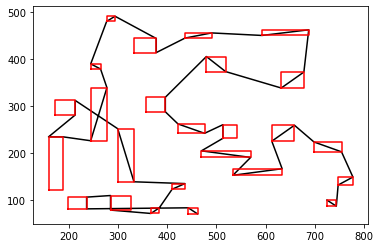

epoch:3, batch:1600/2500, reward:3199.984130859375


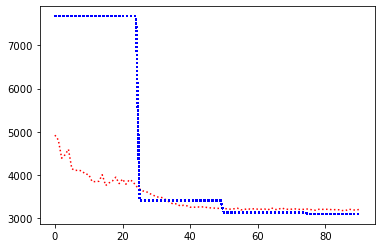

record the last path to gazebo for showing up


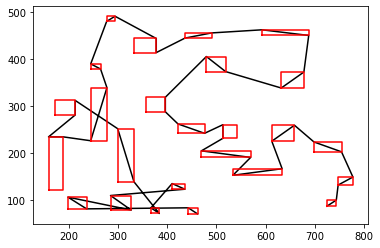

epoch:3, batch:1700/2500, reward:3183.409423828125


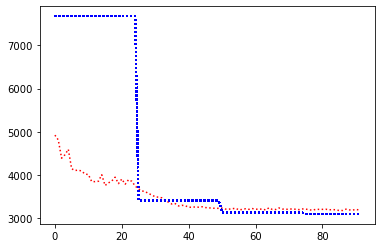

record the last path to gazebo for showing up


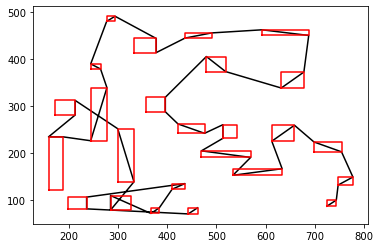

epoch:3, batch:1800/2500, reward:3180.79638671875


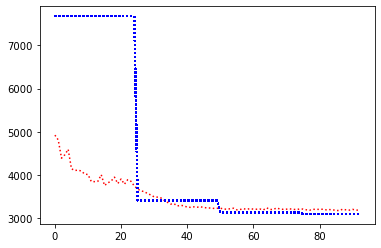

record the last path to gazebo for showing up


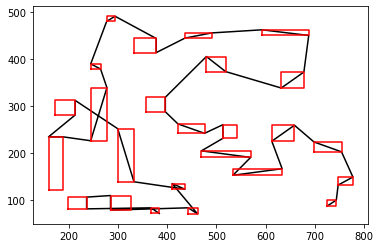

epoch:3, batch:1900/2500, reward:3168.958984375


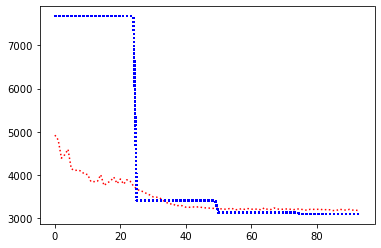

record the last path to gazebo for showing up


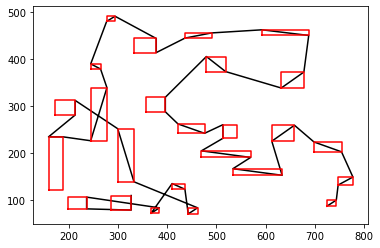

epoch:3, batch:2000/2500, reward:3176.5185546875


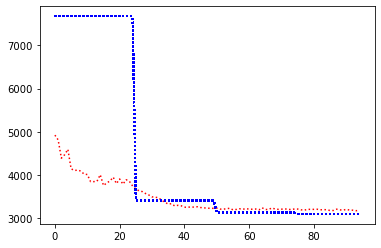

record the last path to gazebo for showing up


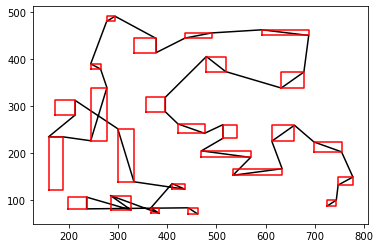

epoch:3, batch:2100/2500, reward:3172.974609375


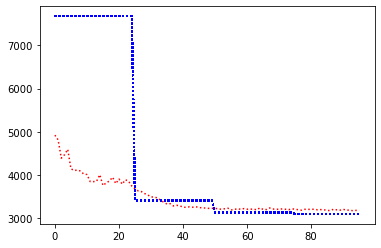

record the last path to gazebo for showing up


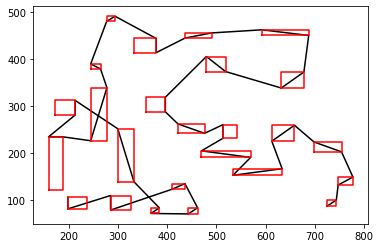

epoch:3, batch:2200/2500, reward:3172.4296875


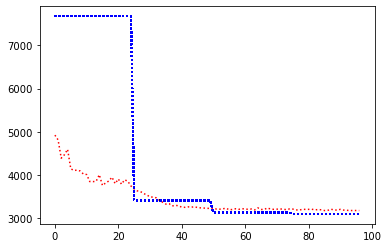

record the last path to gazebo for showing up


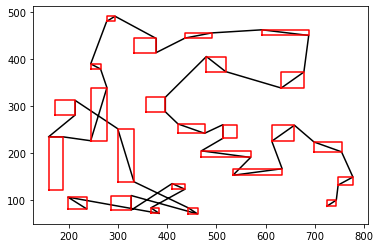

epoch:3, batch:2300/2500, reward:3186.704833984375


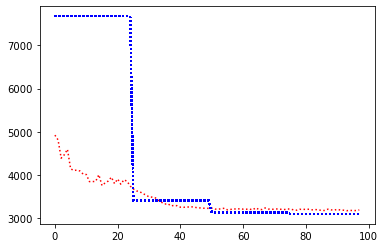

record the last path to gazebo for showing up


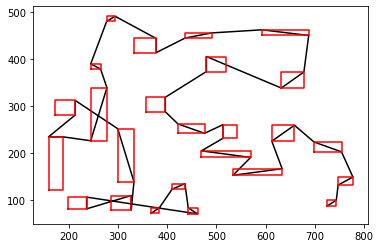

epoch:3, batch:2400/2500, reward:3160.01806640625


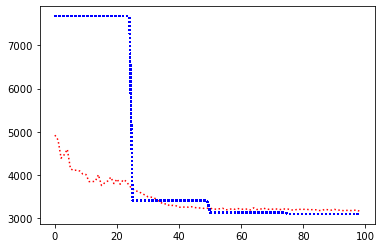

record the last path to gazebo for showing up


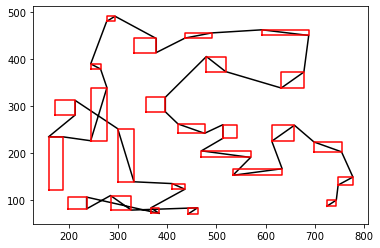

epoch:3, batch:2500/2500, reward:3175.98291015625


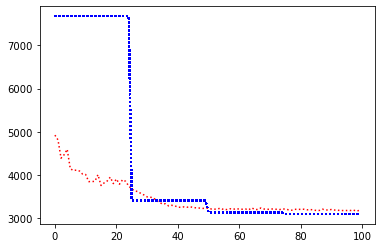

record the last path to gazebo for showing up


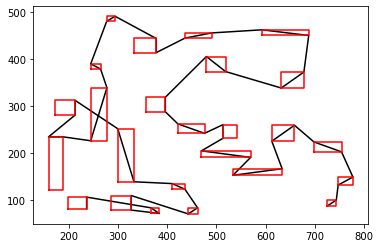

Avg Actor 3063.954345703125 --- Avg Critic 3094.61376953125
My actor is going on the right road Hallelujah :) Updated
Epoch: 3, epoch time: 52.258min, tot time: 0.148day, L_actor: 3063.954, L_critic: 3094.614, update: True
Save Checkpoints
epoch:4, batch:100/2500, reward:3165.739501953125


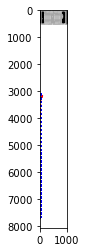

record the last path to gazebo for showing up


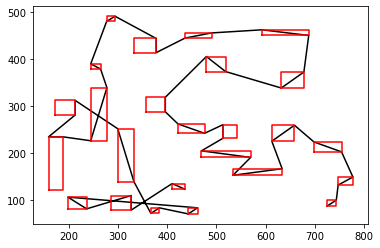

epoch:4, batch:200/2500, reward:3173.497802734375


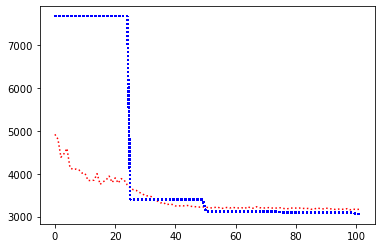

record the last path to gazebo for showing up


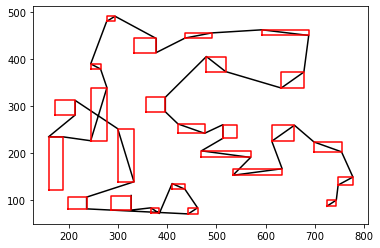

epoch:4, batch:300/2500, reward:3181.494873046875


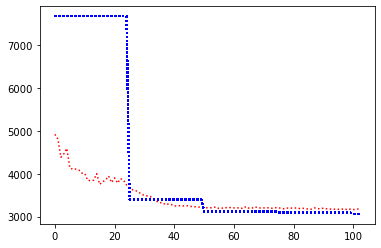

record the last path to gazebo for showing up


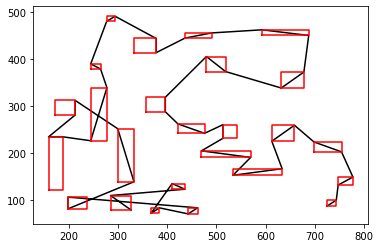

epoch:4, batch:400/2500, reward:3187.92626953125


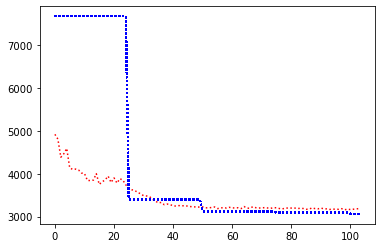

record the last path to gazebo for showing up


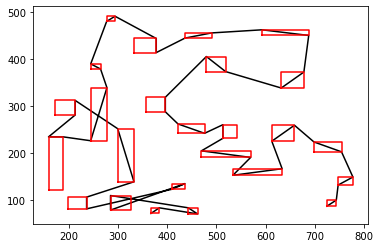

epoch:4, batch:500/2500, reward:3165.072265625


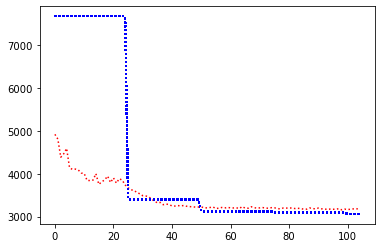

record the last path to gazebo for showing up


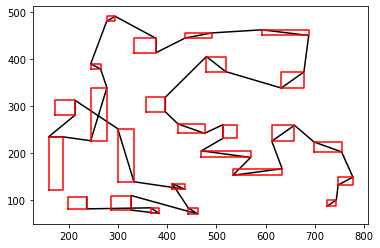

epoch:4, batch:600/2500, reward:3186.32421875


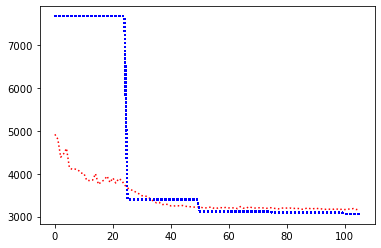

record the last path to gazebo for showing up


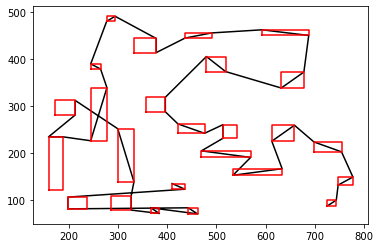

epoch:4, batch:700/2500, reward:3163.9326171875


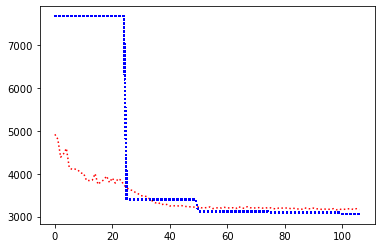

record the last path to gazebo for showing up


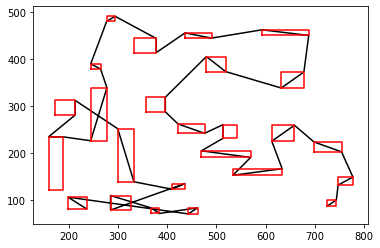

epoch:4, batch:800/2500, reward:3163.803466796875


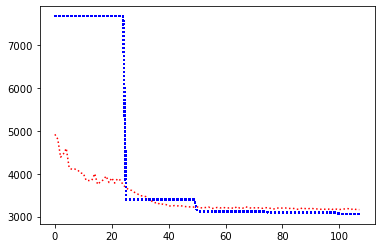

record the last path to gazebo for showing up


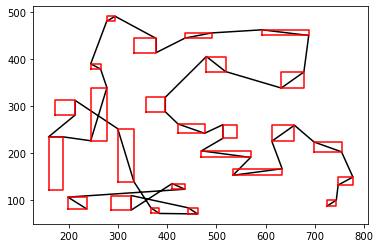

epoch:4, batch:900/2500, reward:3172.048095703125


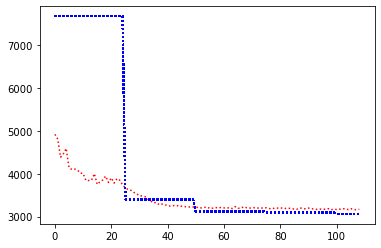

record the last path to gazebo for showing up


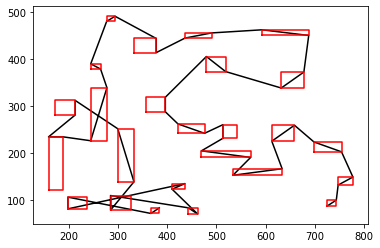

epoch:4, batch:1000/2500, reward:3170.753173828125


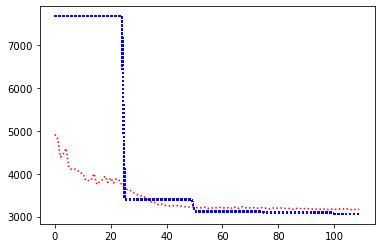

record the last path to gazebo for showing up


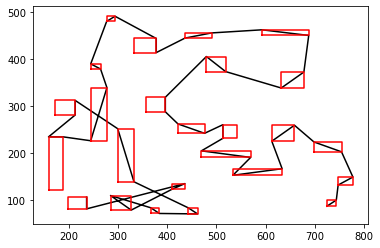

epoch:4, batch:1100/2500, reward:3158.138671875


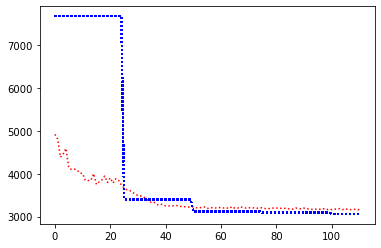

record the last path to gazebo for showing up


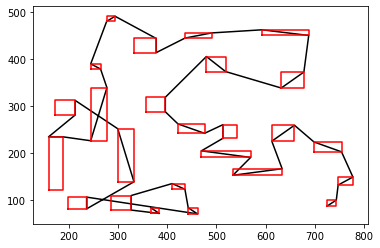

epoch:4, batch:1200/2500, reward:3049.712158203125


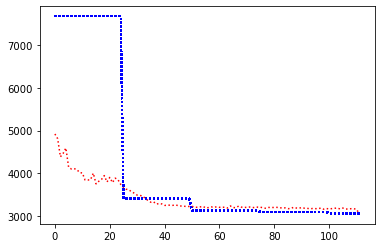

record the last path to gazebo for showing up


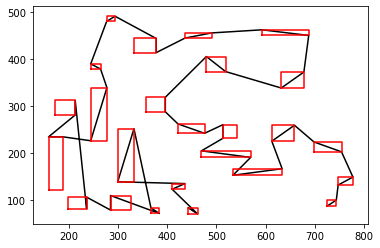

epoch:4, batch:1300/2500, reward:2943.34814453125


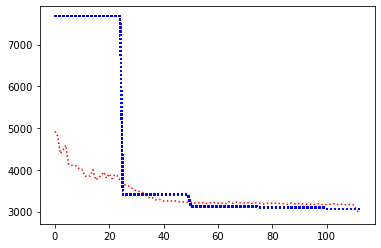

record the last path to gazebo for showing up


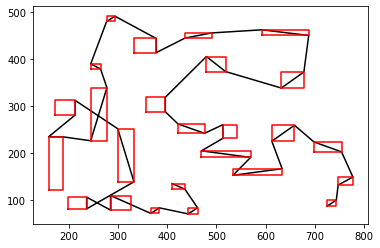

epoch:4, batch:1400/2500, reward:2942.908203125


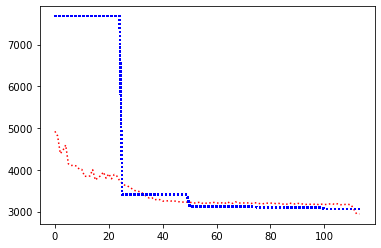

record the last path to gazebo for showing up


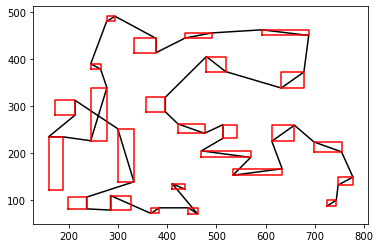

epoch:4, batch:1500/2500, reward:2942.267822265625


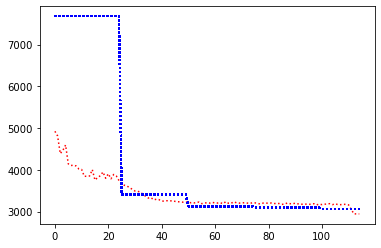

record the last path to gazebo for showing up


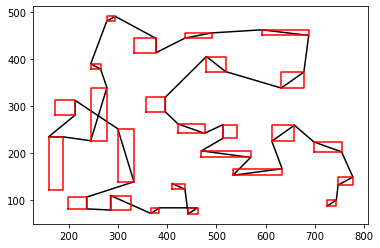

epoch:4, batch:1600/2500, reward:2941.9921875


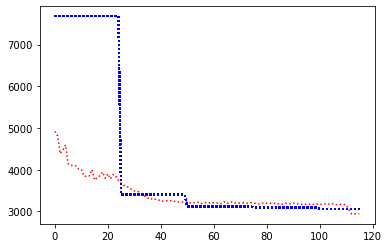

record the last path to gazebo for showing up


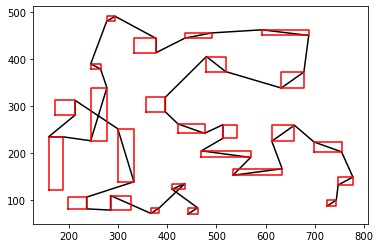

epoch:4, batch:1700/2500, reward:2939.500244140625


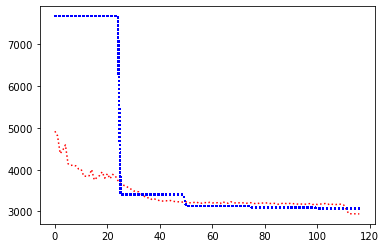

record the last path to gazebo for showing up


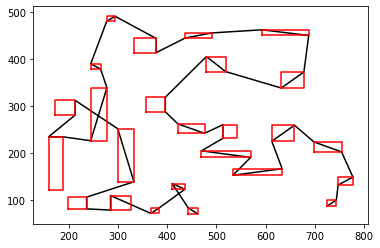

epoch:4, batch:1800/2500, reward:2939.69921875


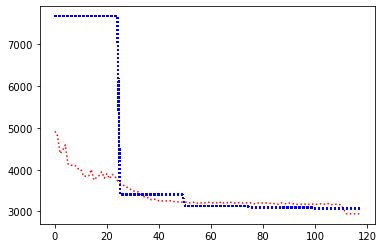

record the last path to gazebo for showing up


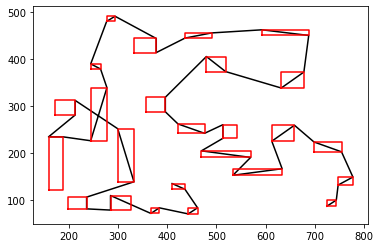

epoch:4, batch:1900/2500, reward:2937.0185546875


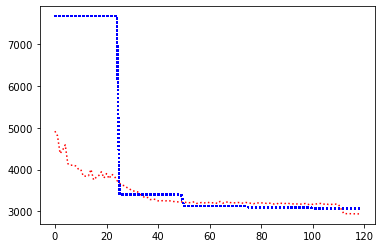

record the last path to gazebo for showing up


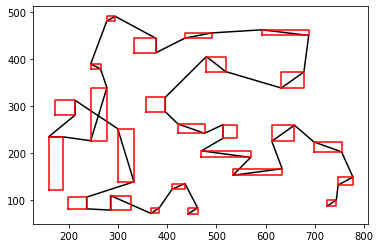

epoch:4, batch:2000/2500, reward:2945.371826171875


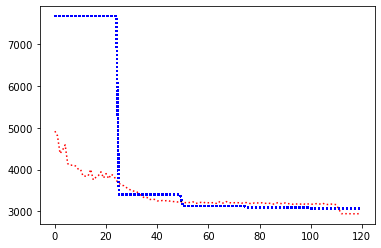

record the last path to gazebo for showing up


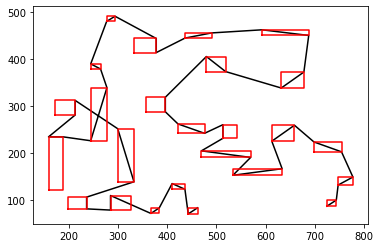

epoch:4, batch:2100/2500, reward:2947.224853515625


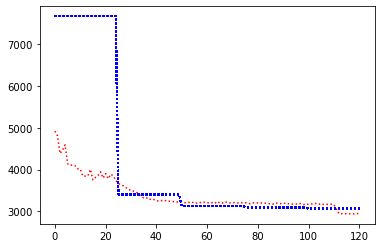

record the last path to gazebo for showing up


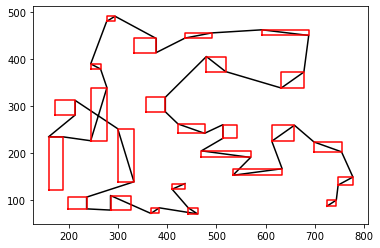

epoch:4, batch:2200/2500, reward:2938.37646484375


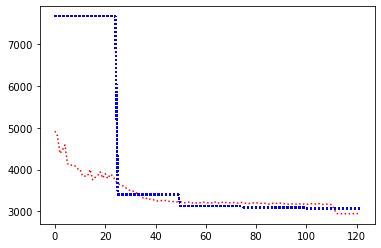

record the last path to gazebo for showing up


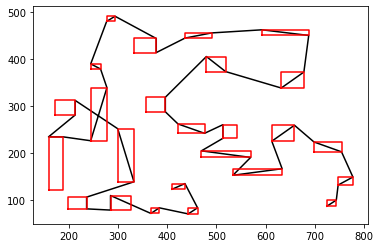

epoch:4, batch:2300/2500, reward:2935.908935546875


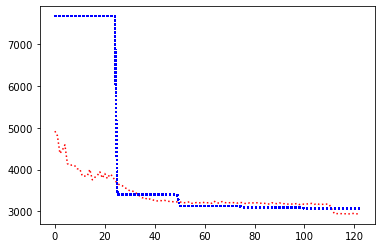

record the last path to gazebo for showing up


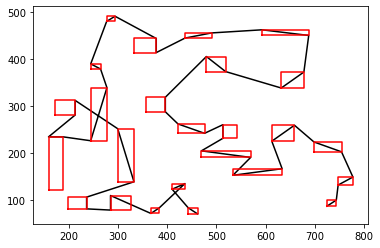

epoch:4, batch:2400/2500, reward:2935.225341796875


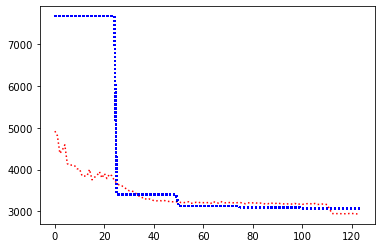

record the last path to gazebo for showing up


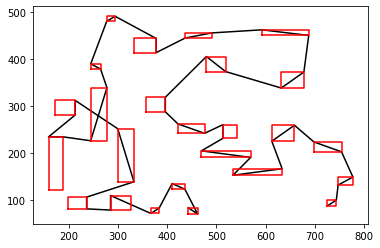

epoch:4, batch:2500/2500, reward:2963.787109375


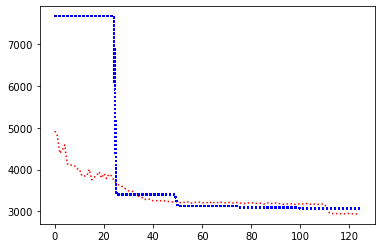

record the last path to gazebo for showing up


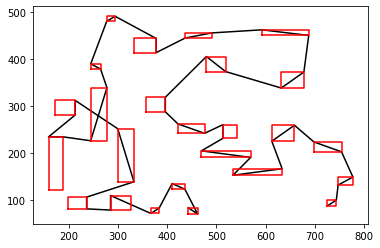

Avg Actor 2950.49951171875 --- Avg Critic 3063.954345703125
My actor is going on the right road Hallelujah :) Updated
Epoch: 4, epoch time: 52.798min, tot time: 0.185day, L_actor: 2950.500, L_critic: 3063.954, update: True
Save Checkpoints
epoch:5, batch:100/2500, reward:2943.67236328125


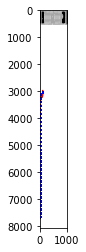

record the last path to gazebo for showing up


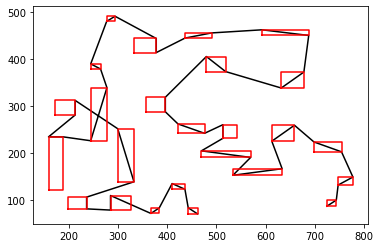

epoch:5, batch:200/2500, reward:2952.357421875


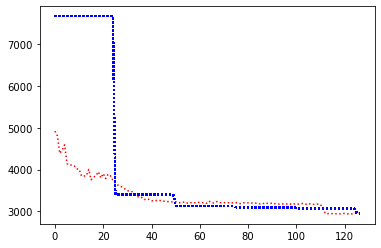

record the last path to gazebo for showing up


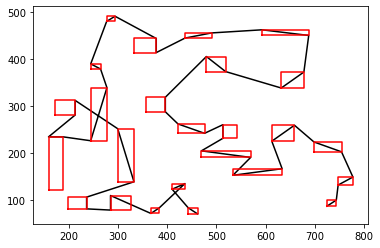

epoch:5, batch:300/2500, reward:2947.837890625


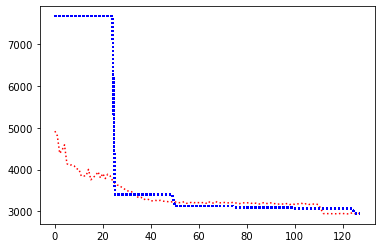

record the last path to gazebo for showing up


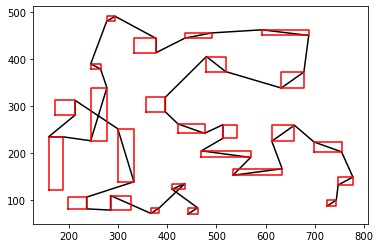

epoch:5, batch:400/2500, reward:2940.34033203125


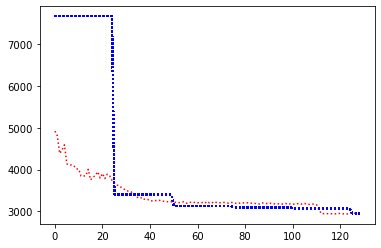

record the last path to gazebo for showing up


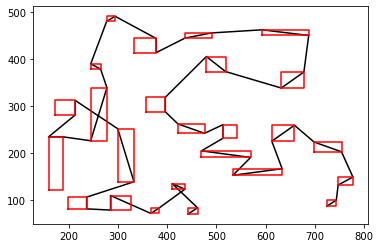

epoch:5, batch:500/2500, reward:2940.57666015625


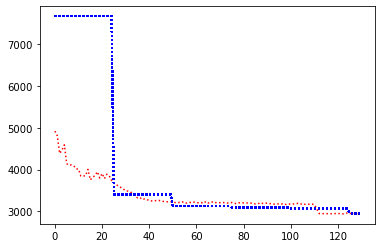

record the last path to gazebo for showing up


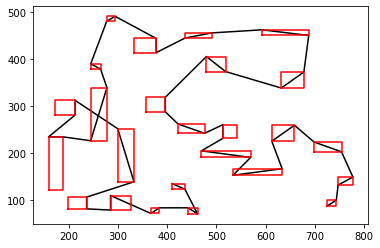

epoch:5, batch:600/2500, reward:2936.962646484375


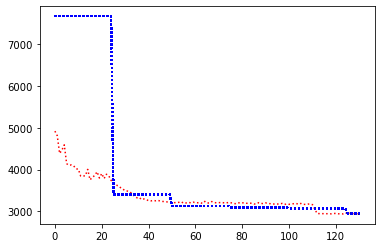

record the last path to gazebo for showing up


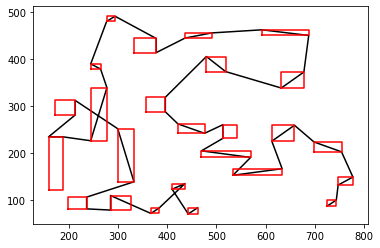

epoch:5, batch:700/2500, reward:2939.24853515625


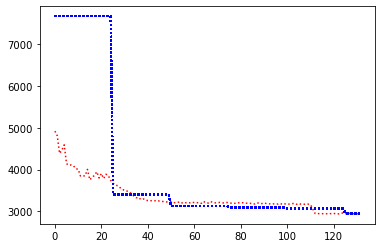

record the last path to gazebo for showing up


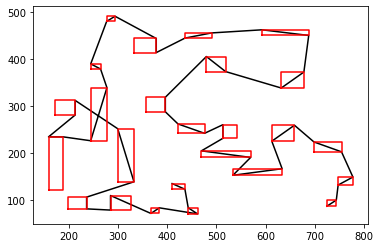

epoch:5, batch:800/2500, reward:2935.33544921875


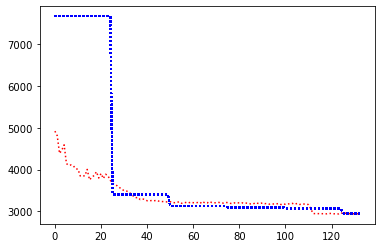

record the last path to gazebo for showing up


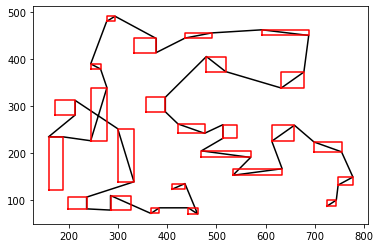

epoch:5, batch:900/2500, reward:2937.96240234375


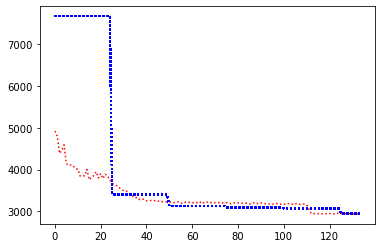

record the last path to gazebo for showing up


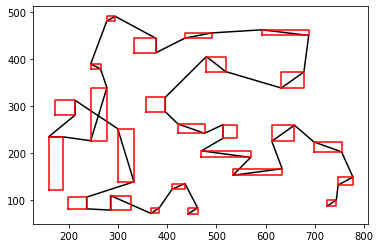

epoch:5, batch:1000/2500, reward:2937.86279296875


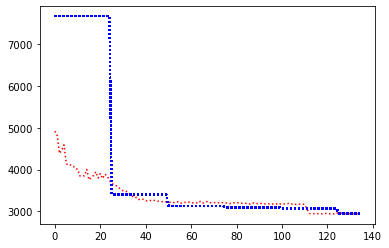

record the last path to gazebo for showing up


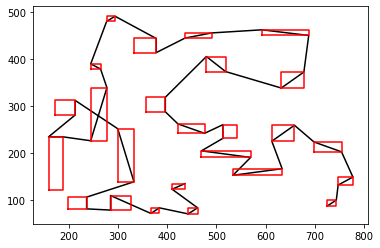

epoch:5, batch:1100/2500, reward:2940.412841796875


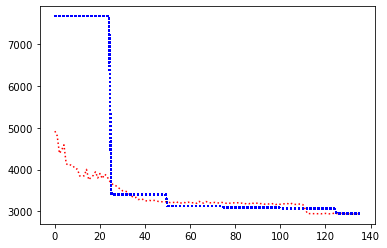

record the last path to gazebo for showing up


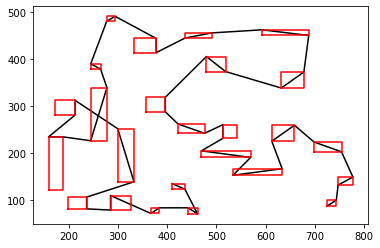

epoch:5, batch:1200/2500, reward:2936.87158203125


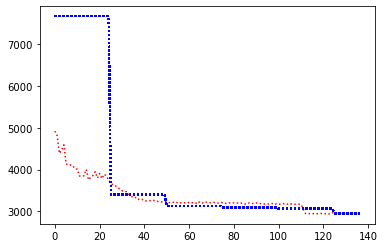

record the last path to gazebo for showing up


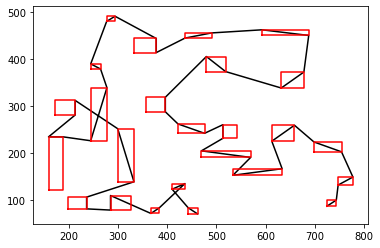

epoch:5, batch:1300/2500, reward:3281.58837890625


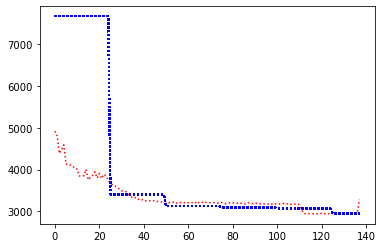

record the last path to gazebo for showing up


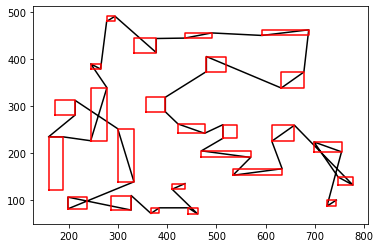

epoch:5, batch:1400/2500, reward:2950.85986328125


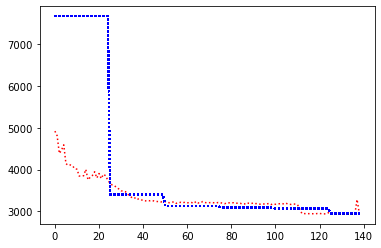

record the last path to gazebo for showing up


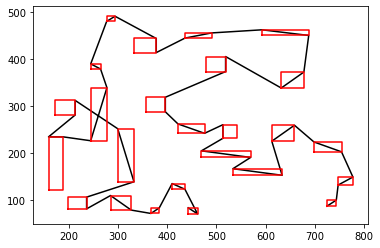

epoch:5, batch:1500/2500, reward:2939.65380859375


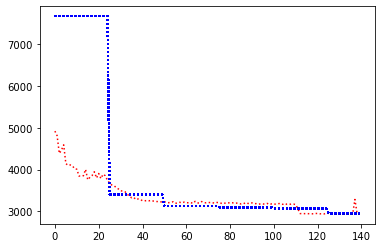

record the last path to gazebo for showing up


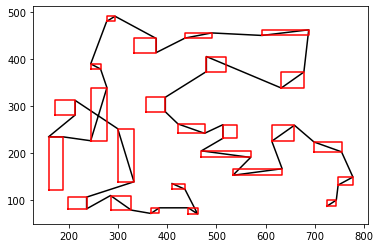

epoch:5, batch:1600/2500, reward:2935.5498046875


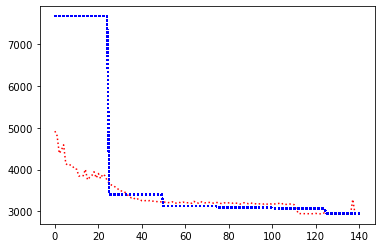

record the last path to gazebo for showing up


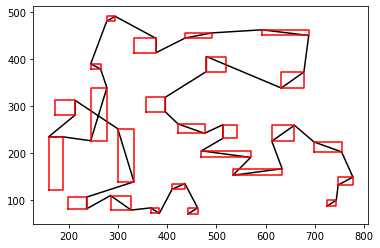

epoch:5, batch:1700/2500, reward:2928.683349609375


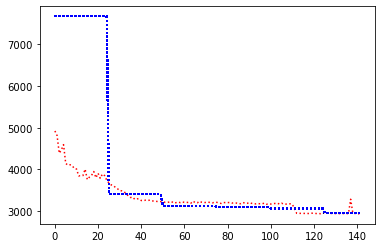

record the last path to gazebo for showing up


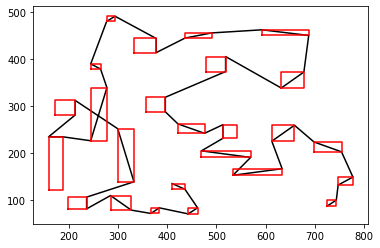

epoch:5, batch:1800/2500, reward:2912.4658203125


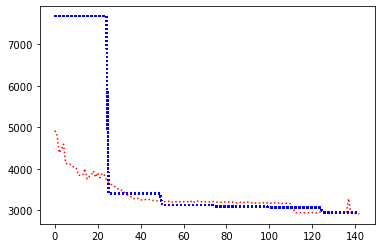

record the last path to gazebo for showing up


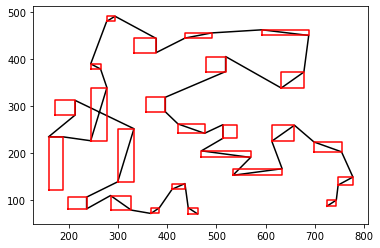

epoch:5, batch:1900/2500, reward:2909.60107421875


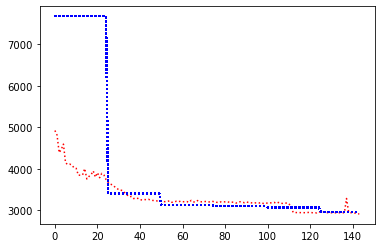

record the last path to gazebo for showing up


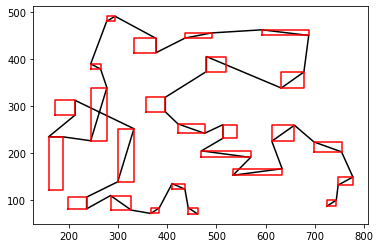

epoch:5, batch:2000/2500, reward:3033.209716796875


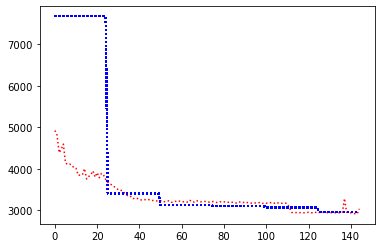

record the last path to gazebo for showing up


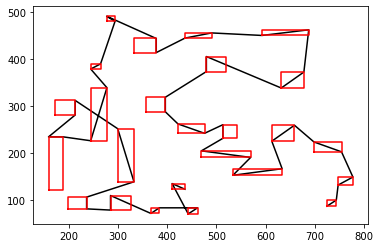

epoch:5, batch:2100/2500, reward:2972.677001953125


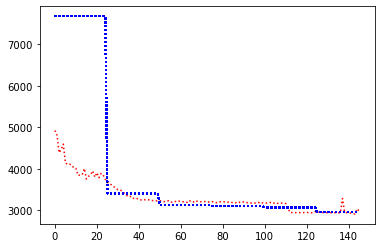

record the last path to gazebo for showing up


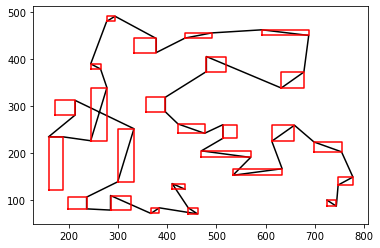

epoch:5, batch:2200/2500, reward:2965.46826171875


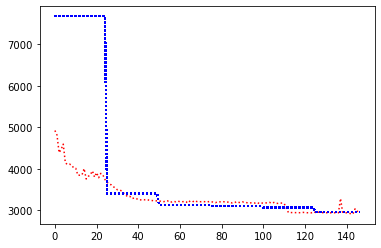

record the last path to gazebo for showing up


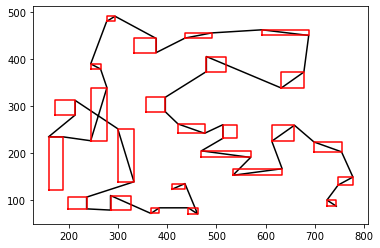

epoch:5, batch:2300/2500, reward:2946.813720703125


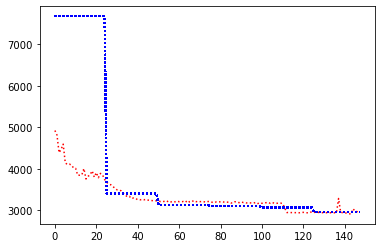

record the last path to gazebo for showing up


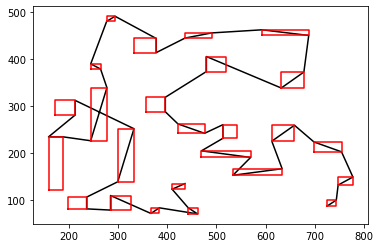

epoch:5, batch:2400/2500, reward:2939.17822265625


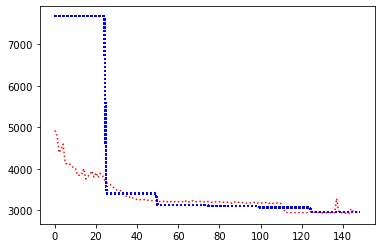

record the last path to gazebo for showing up


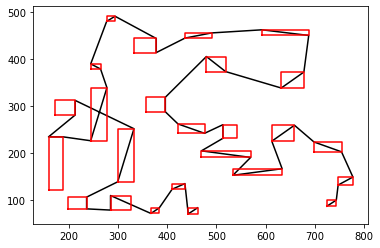

epoch:5, batch:2500/2500, reward:2945.8583984375


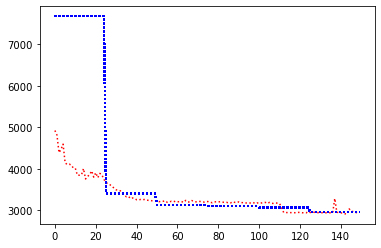

record the last path to gazebo for showing up


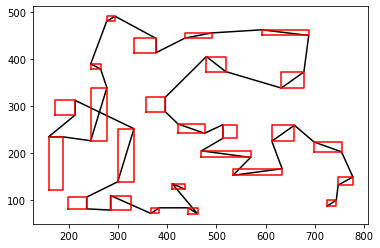

Avg Actor 2923.75634765625 --- Avg Critic 2950.49951171875
My actor is going on the right road Hallelujah :) Updated
Epoch: 5, epoch time: 52.014min, tot time: 0.221day, L_actor: 2923.756, L_critic: 2950.500, update: True
Save Checkpoints
epoch:6, batch:100/2500, reward:2934.961669921875


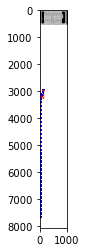

record the last path to gazebo for showing up


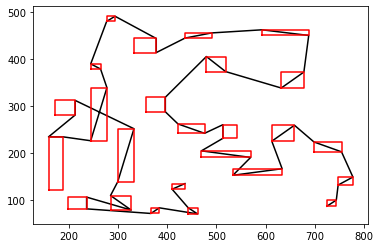

epoch:6, batch:200/2500, reward:2937.217529296875


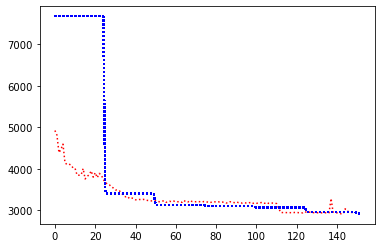

record the last path to gazebo for showing up


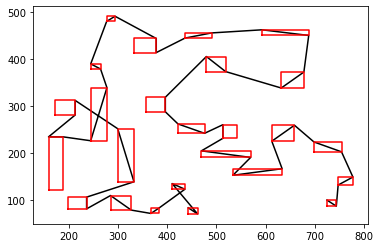

epoch:6, batch:300/2500, reward:2918.88232421875


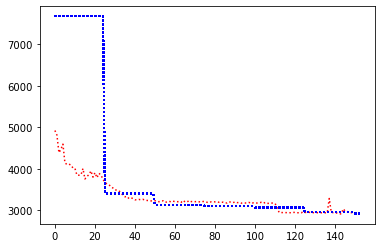

record the last path to gazebo for showing up


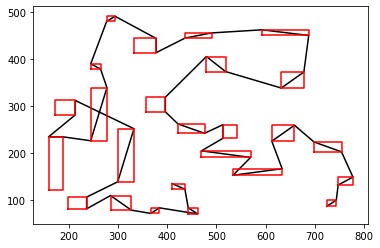

epoch:6, batch:400/2500, reward:2920.962890625


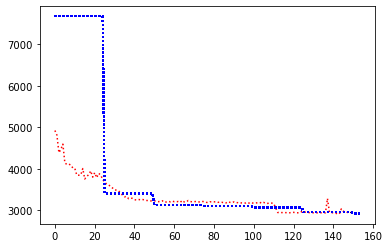

record the last path to gazebo for showing up


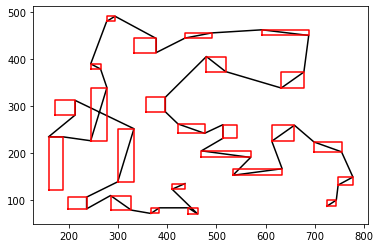

epoch:6, batch:500/2500, reward:2920.89404296875


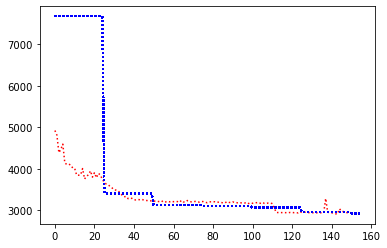

record the last path to gazebo for showing up


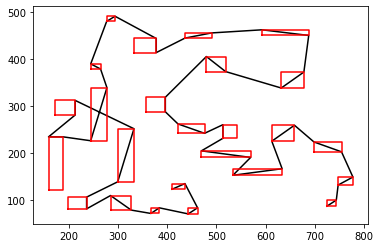

epoch:6, batch:600/2500, reward:2924.66015625


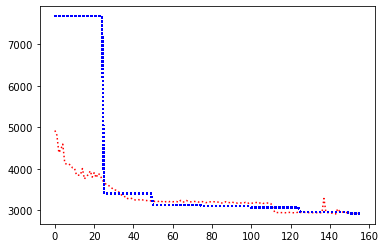

record the last path to gazebo for showing up


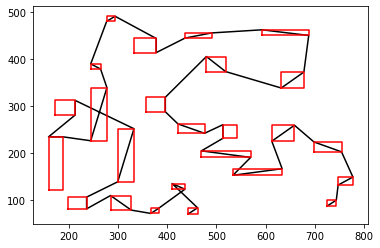

epoch:6, batch:700/2500, reward:2919.14794921875


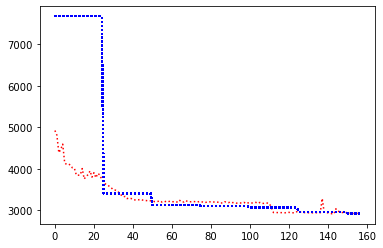

record the last path to gazebo for showing up


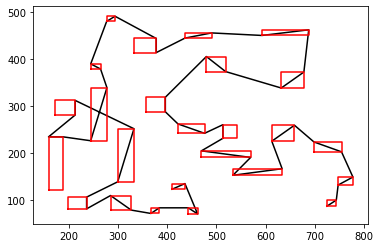

epoch:6, batch:800/2500, reward:2938.2294921875


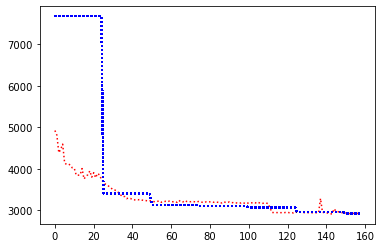

record the last path to gazebo for showing up


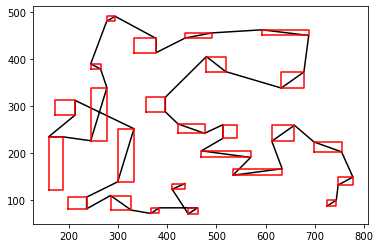

epoch:6, batch:900/2500, reward:2927.5087890625


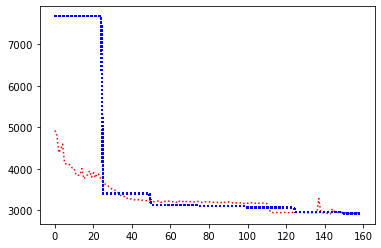

record the last path to gazebo for showing up


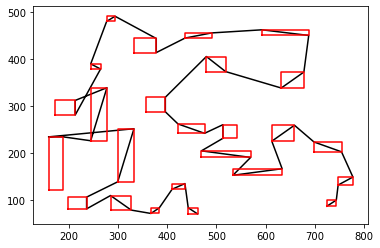

epoch:6, batch:1000/2500, reward:2918.79931640625


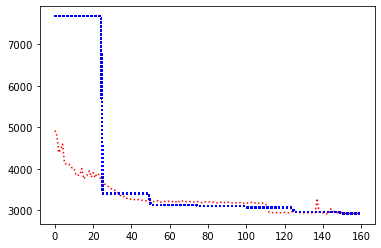

record the last path to gazebo for showing up


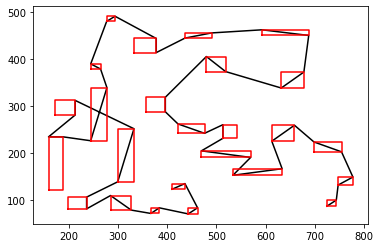

epoch:6, batch:1100/2500, reward:2928.8408203125


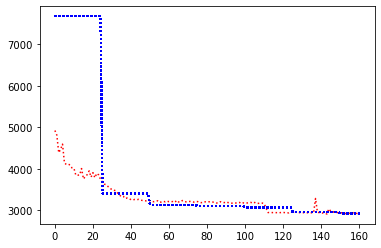

record the last path to gazebo for showing up


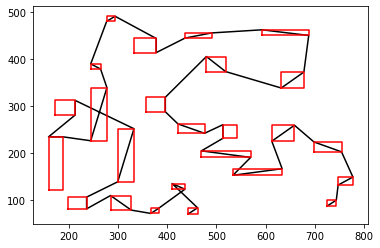

epoch:6, batch:1200/2500, reward:2920.935546875


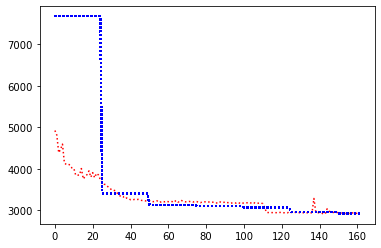

record the last path to gazebo for showing up


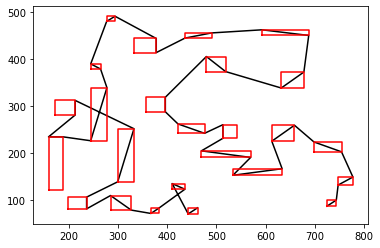

epoch:6, batch:1300/2500, reward:2920.320068359375


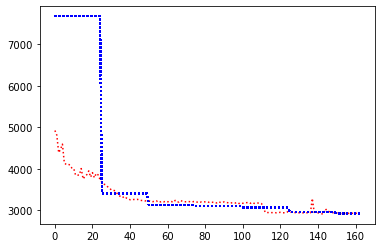

record the last path to gazebo for showing up


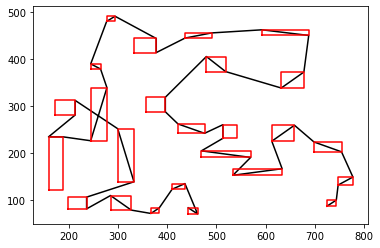

epoch:6, batch:1400/2500, reward:3363.721923828125


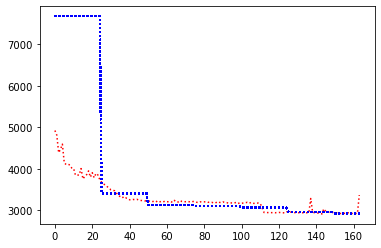

record the last path to gazebo for showing up


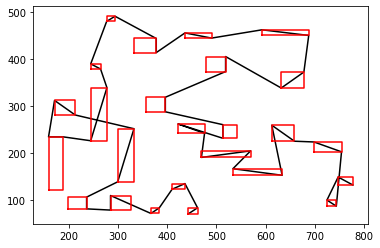

epoch:6, batch:1500/2500, reward:3013.271240234375


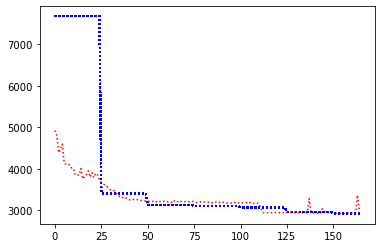

record the last path to gazebo for showing up


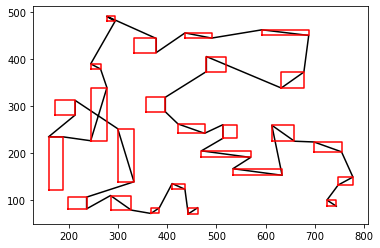

epoch:6, batch:1600/2500, reward:3014.7861328125


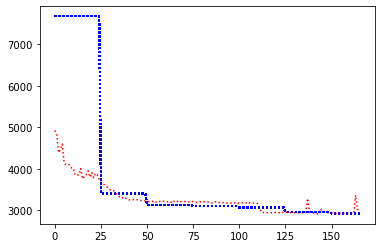

record the last path to gazebo for showing up


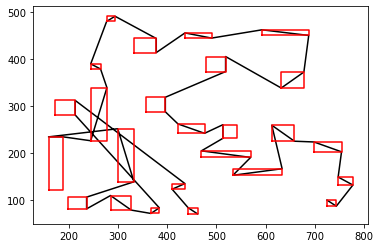

epoch:6, batch:1700/2500, reward:2978.009765625


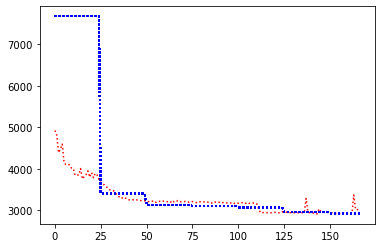

record the last path to gazebo for showing up


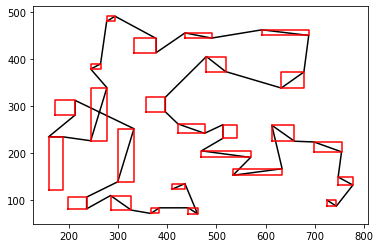

epoch:6, batch:1800/2500, reward:2975.0078125


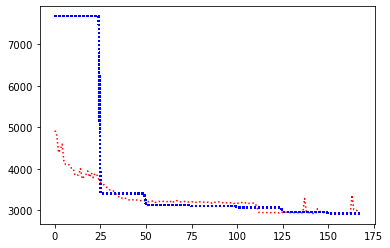

record the last path to gazebo for showing up


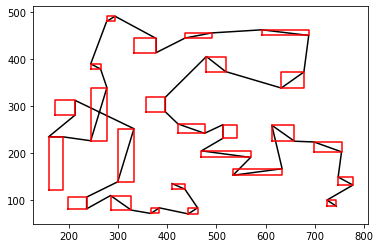

epoch:6, batch:1900/2500, reward:2954.1787109375


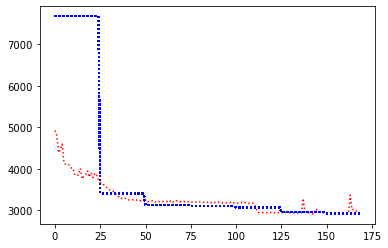

record the last path to gazebo for showing up


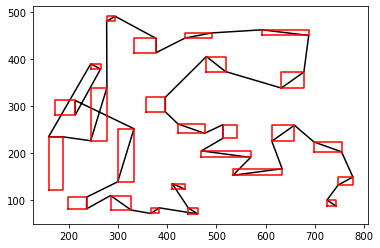

epoch:6, batch:2000/2500, reward:2937.903076171875


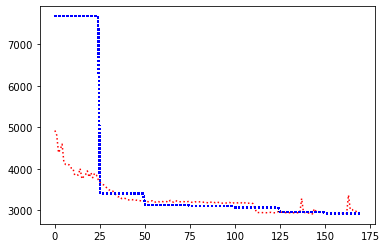

record the last path to gazebo for showing up


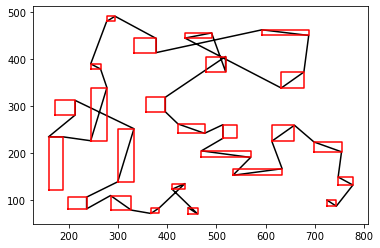

epoch:6, batch:2100/2500, reward:2946.48095703125


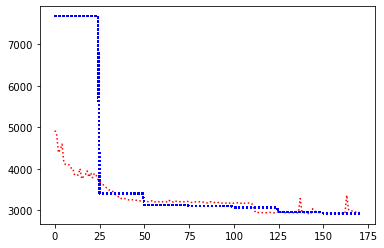

record the last path to gazebo for showing up


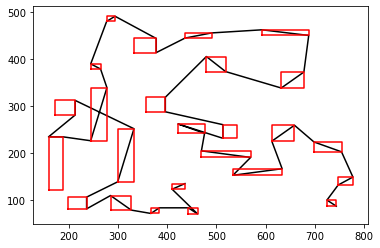

epoch:6, batch:2200/2500, reward:2953.14794921875


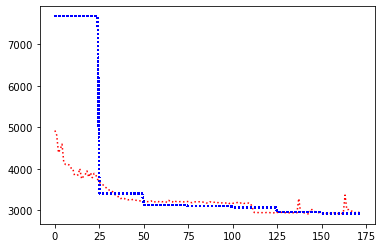

record the last path to gazebo for showing up


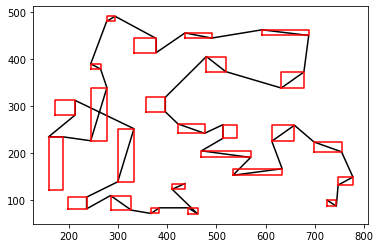

epoch:6, batch:2300/2500, reward:2948.18701171875


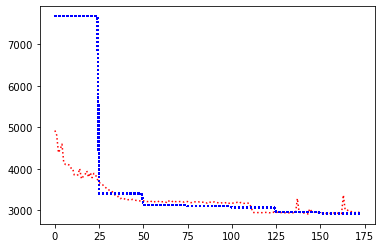

record the last path to gazebo for showing up


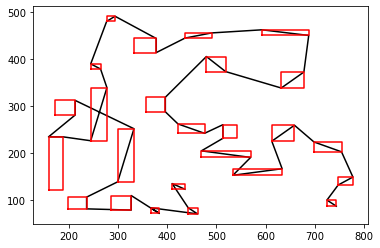

epoch:6, batch:2400/2500, reward:2938.124755859375


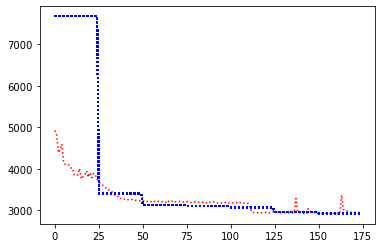

record the last path to gazebo for showing up


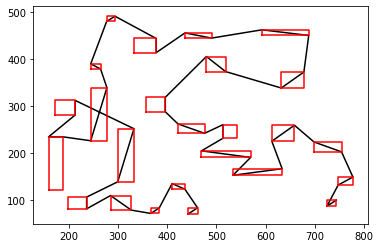

epoch:6, batch:2500/2500, reward:2939.6103515625


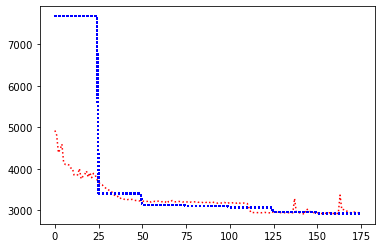

record the last path to gazebo for showing up


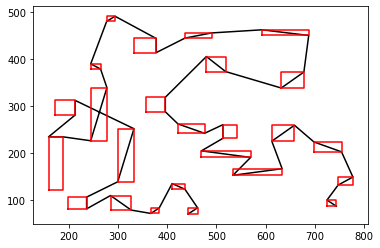

Avg Actor 2904.27197265625 --- Avg Critic 2923.75634765625
My actor is going on the right road Hallelujah :) Updated
Epoch: 6, epoch time: 53.620min, tot time: 0.259day, L_actor: 2904.272, L_critic: 2923.756, update: True
Save Checkpoints
epoch:7, batch:100/2500, reward:2929.3232421875


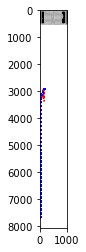

record the last path to gazebo for showing up


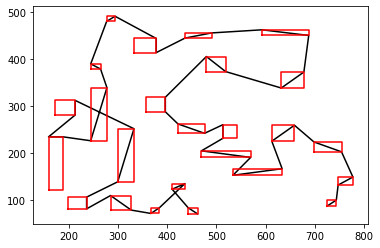

epoch:7, batch:200/2500, reward:2921.01220703125


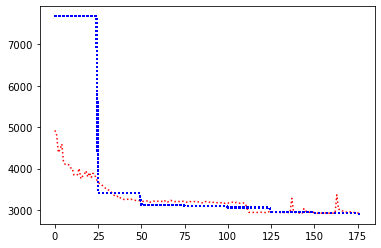

record the last path to gazebo for showing up


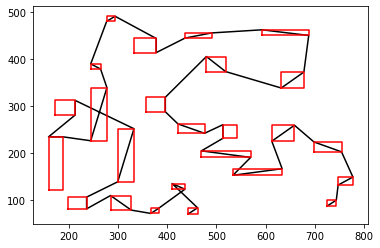

epoch:7, batch:300/2500, reward:2922.375732421875


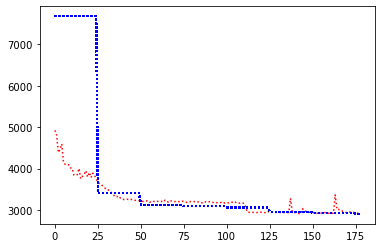

record the last path to gazebo for showing up


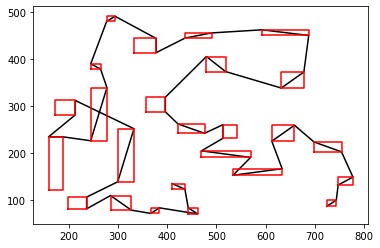

epoch:7, batch:400/2500, reward:2923.40087890625


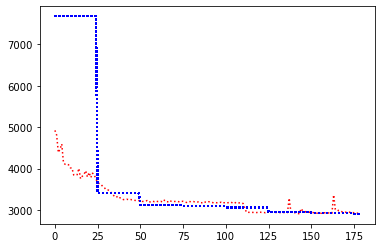

record the last path to gazebo for showing up


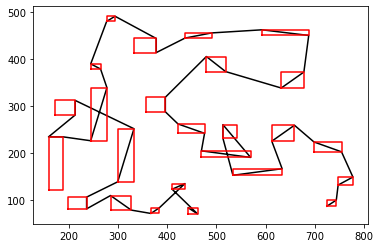

epoch:7, batch:500/2500, reward:2928.897705078125


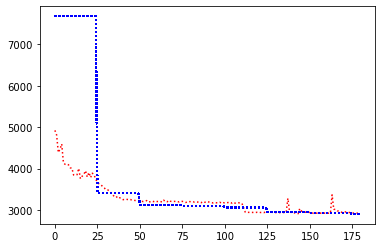

record the last path to gazebo for showing up


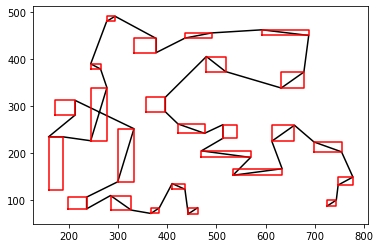

epoch:7, batch:600/2500, reward:2932.77783203125


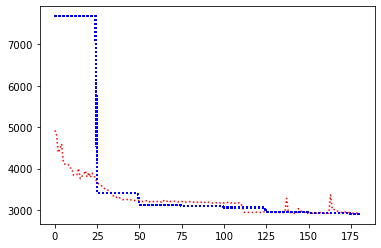

record the last path to gazebo for showing up


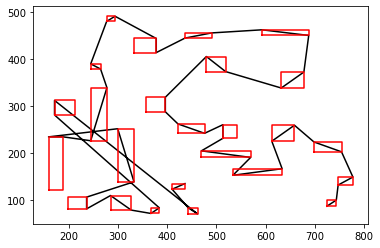

epoch:7, batch:700/2500, reward:2922.5068359375


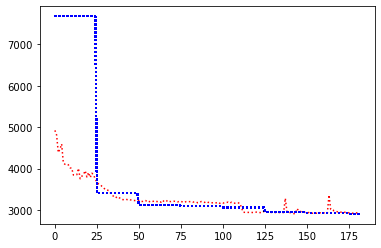

record the last path to gazebo for showing up


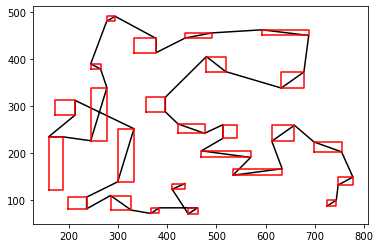

epoch:7, batch:800/2500, reward:2919.87255859375


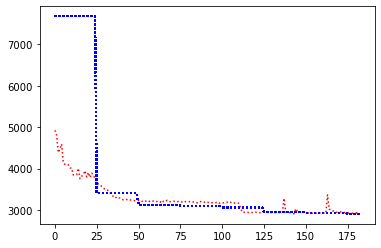

record the last path to gazebo for showing up


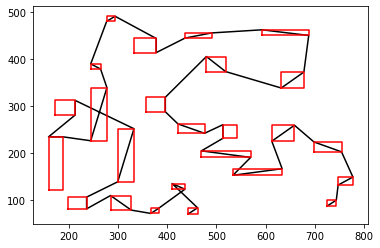

epoch:7, batch:900/2500, reward:2919.04443359375


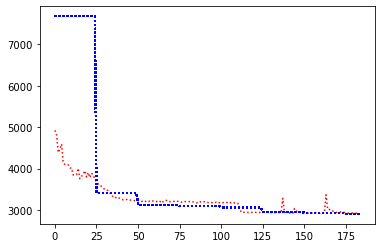

record the last path to gazebo for showing up


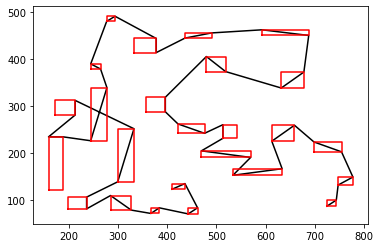

epoch:7, batch:1000/2500, reward:2919.71337890625


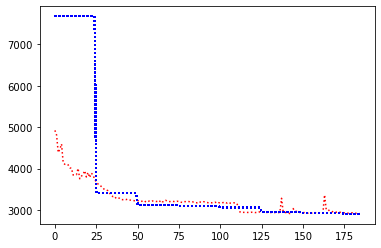

record the last path to gazebo for showing up


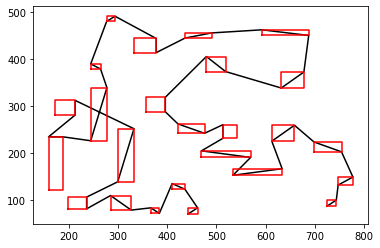

epoch:7, batch:1100/2500, reward:2921.294921875


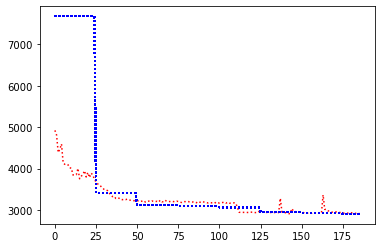

record the last path to gazebo for showing up


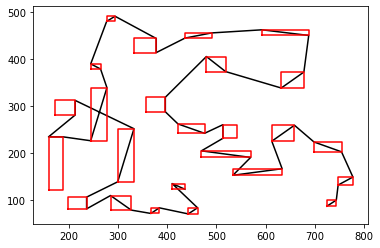

epoch:7, batch:1200/2500, reward:2924.85546875


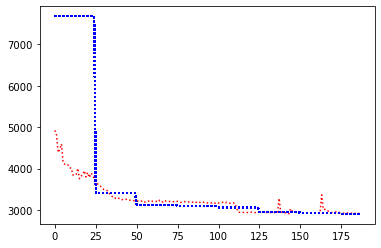

record the last path to gazebo for showing up


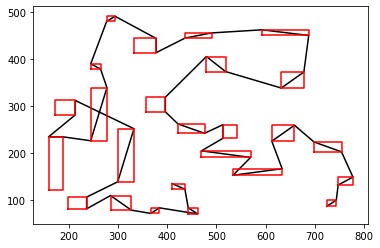

epoch:7, batch:1300/2500, reward:2916.9072265625


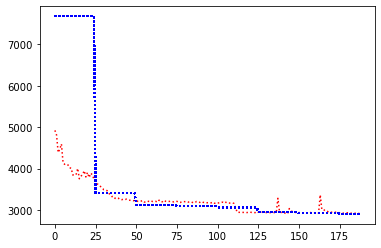

record the last path to gazebo for showing up


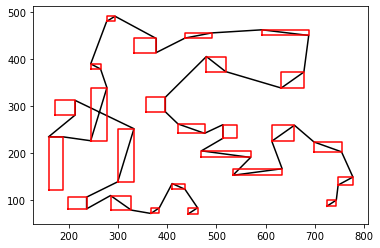

epoch:7, batch:1400/2500, reward:2898.216796875


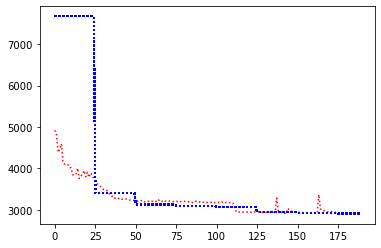

record the last path to gazebo for showing up


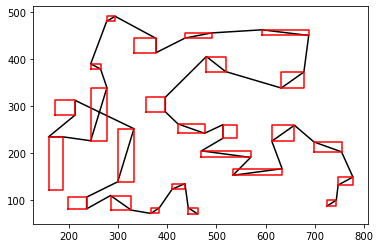

epoch:7, batch:1500/2500, reward:2913.347900390625


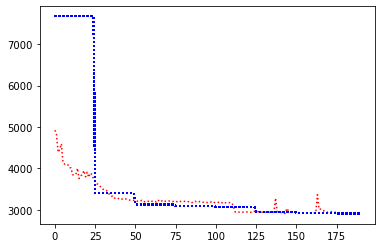

record the last path to gazebo for showing up


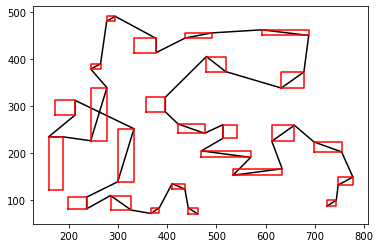

epoch:7, batch:1600/2500, reward:2904.382568359375


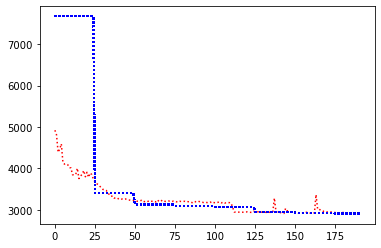

record the last path to gazebo for showing up


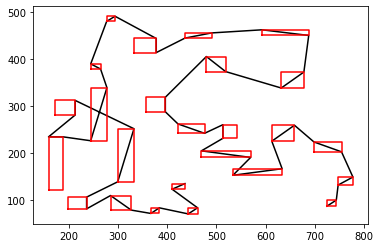

epoch:7, batch:1700/2500, reward:2893.70654296875


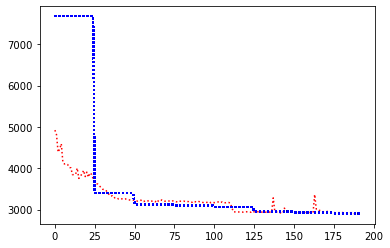

record the last path to gazebo for showing up


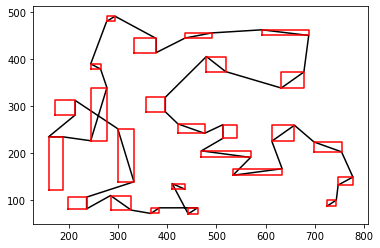

epoch:7, batch:1800/2500, reward:2903.185791015625


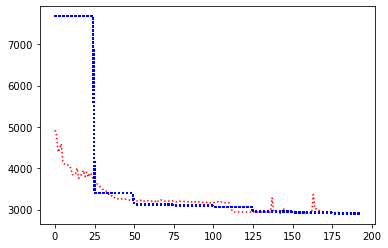

record the last path to gazebo for showing up


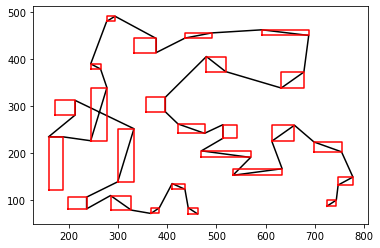

epoch:7, batch:1900/2500, reward:2900.810302734375


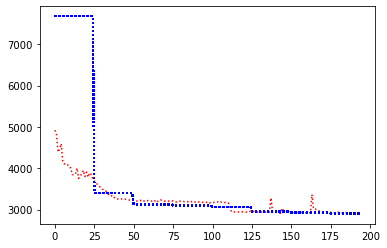

record the last path to gazebo for showing up


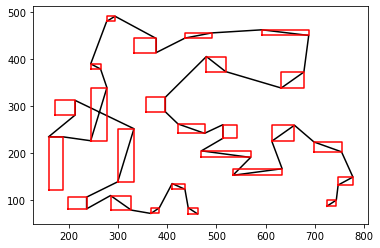

epoch:7, batch:2000/2500, reward:2895.8564453125


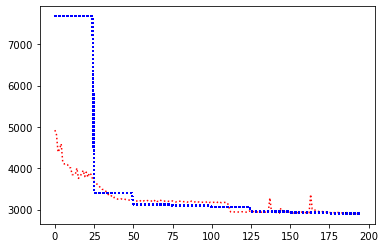

record the last path to gazebo for showing up


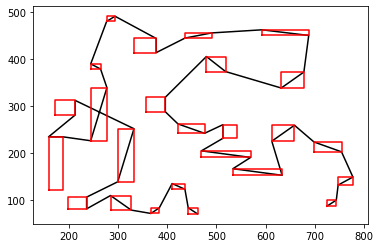

epoch:7, batch:2100/2500, reward:2889.048828125


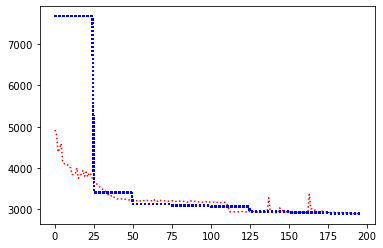

record the last path to gazebo for showing up


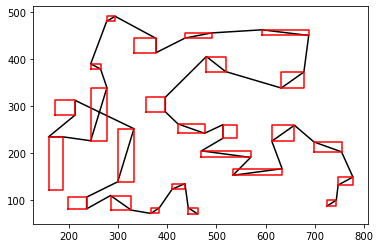

epoch:7, batch:2200/2500, reward:2892.465576171875


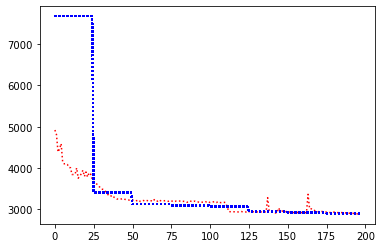

record the last path to gazebo for showing up


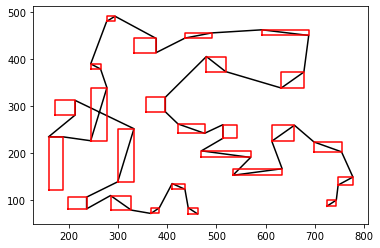

epoch:7, batch:2300/2500, reward:2894.194091796875


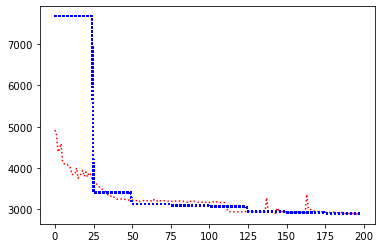

record the last path to gazebo for showing up


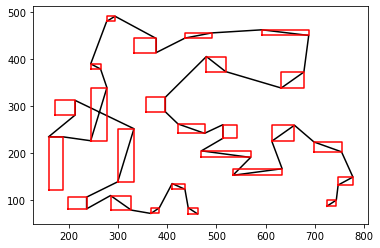

epoch:7, batch:2400/2500, reward:2890.1044921875


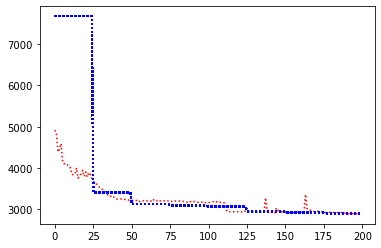

record the last path to gazebo for showing up


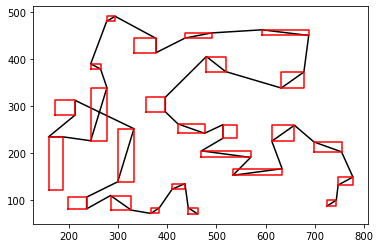

epoch:7, batch:2500/2500, reward:2891.76171875


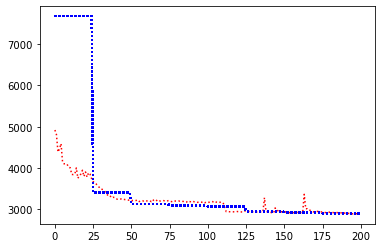

record the last path to gazebo for showing up


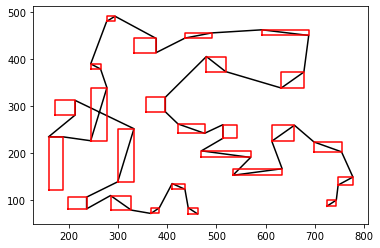

Avg Actor 2884.38037109375 --- Avg Critic 2904.27197265625
My actor is going on the right road Hallelujah :) Updated
Epoch: 7, epoch time: 53.605min, tot time: 0.296day, L_actor: 2884.380, L_critic: 2904.272, update: True
Save Checkpoints
epoch:8, batch:100/2500, reward:2902.623779296875


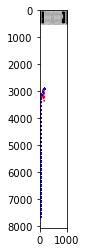

record the last path to gazebo for showing up


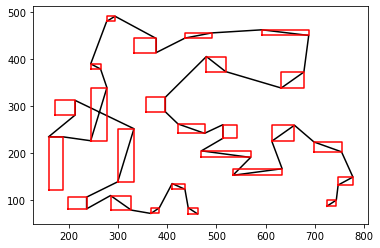

epoch:8, batch:200/2500, reward:2890.76025390625


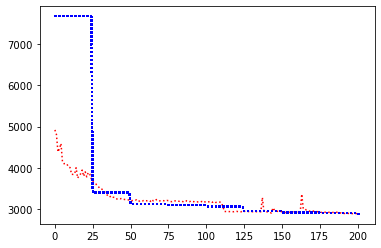

record the last path to gazebo for showing up


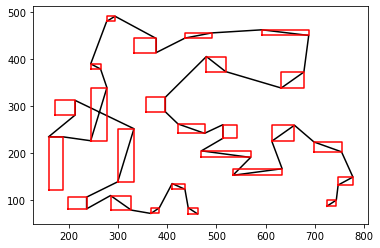

epoch:8, batch:300/2500, reward:2888.72802734375


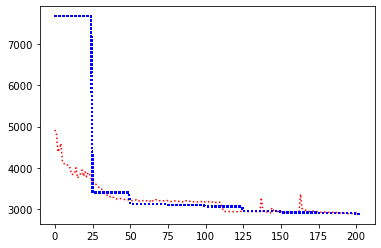

record the last path to gazebo for showing up


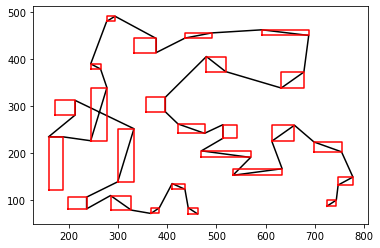

epoch:8, batch:400/2500, reward:2898.3671875


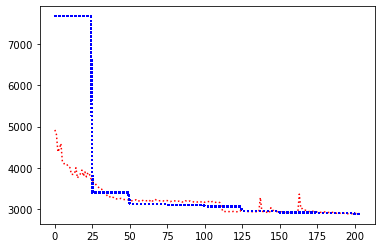

record the last path to gazebo for showing up


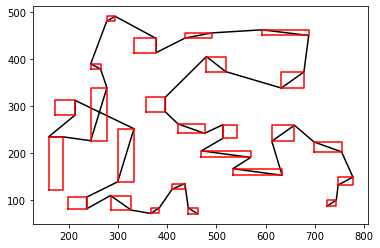

epoch:8, batch:500/2500, reward:2888.923828125


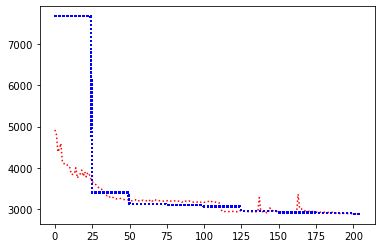

record the last path to gazebo for showing up


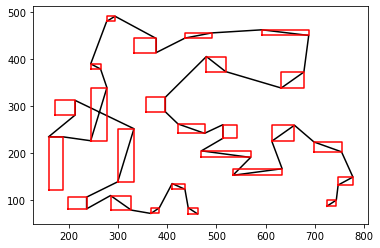

epoch:8, batch:600/2500, reward:2888.143798828125


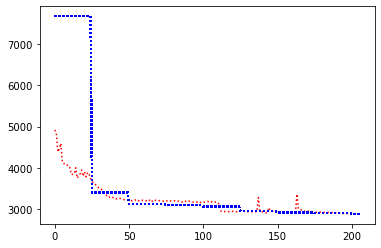

record the last path to gazebo for showing up


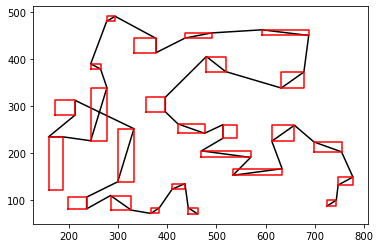

epoch:8, batch:700/2500, reward:2887.6953125


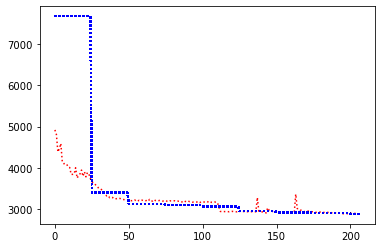

record the last path to gazebo for showing up


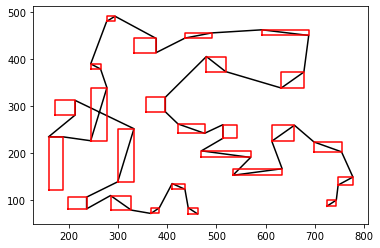

epoch:8, batch:800/2500, reward:2890.1435546875


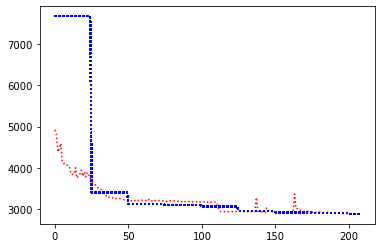

record the last path to gazebo for showing up


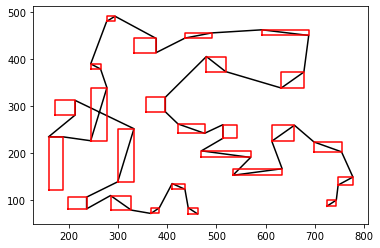

epoch:8, batch:900/2500, reward:2891.292236328125


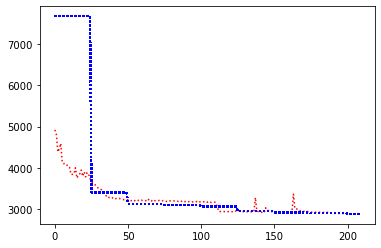

record the last path to gazebo for showing up


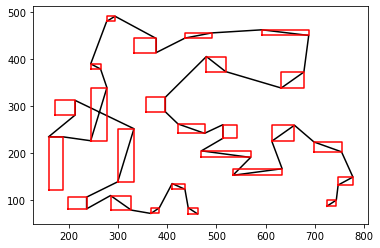

epoch:8, batch:1000/2500, reward:2888.935546875


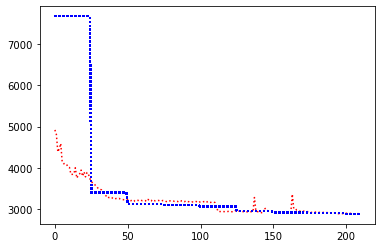

record the last path to gazebo for showing up


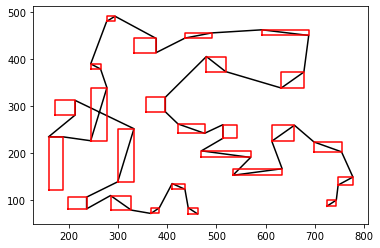

epoch:8, batch:1100/2500, reward:2893.37158203125


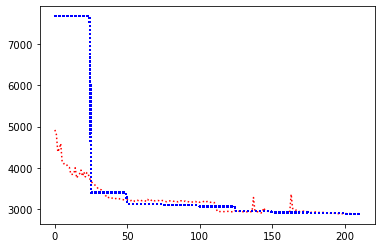

record the last path to gazebo for showing up


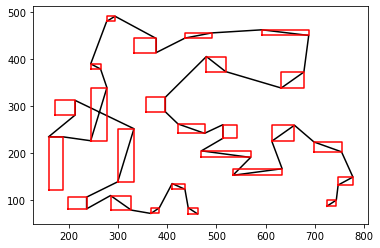

epoch:8, batch:1200/2500, reward:2894.5791015625


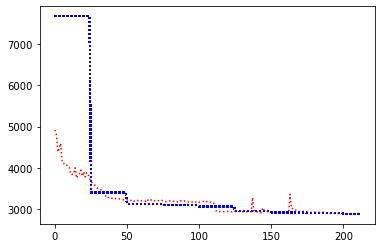

record the last path to gazebo for showing up


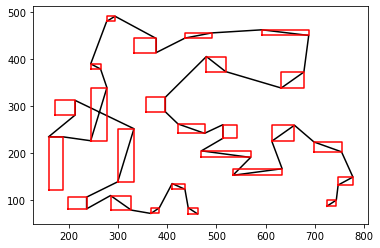

epoch:8, batch:1300/2500, reward:2888.791259765625


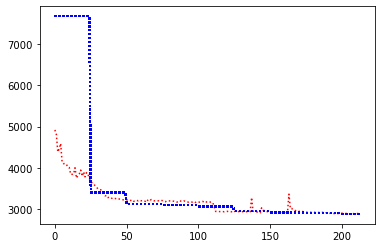

record the last path to gazebo for showing up


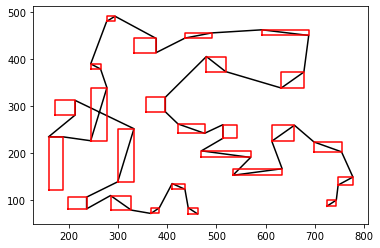

epoch:8, batch:1400/2500, reward:2887.859375


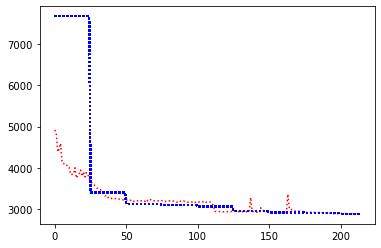

record the last path to gazebo for showing up


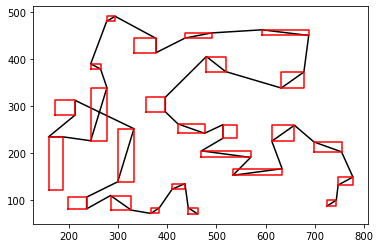

epoch:8, batch:1500/2500, reward:2887.638671875


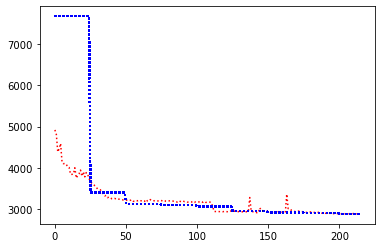

record the last path to gazebo for showing up


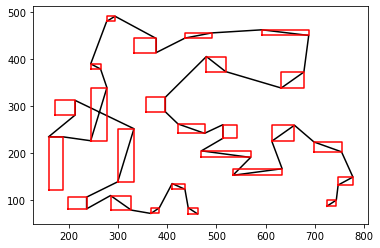

epoch:8, batch:1600/2500, reward:2888.594970703125


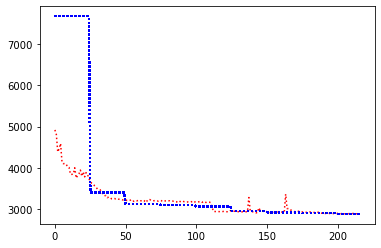

record the last path to gazebo for showing up


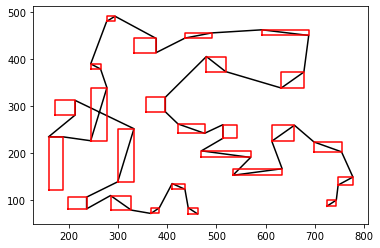

epoch:8, batch:1700/2500, reward:2897.6533203125


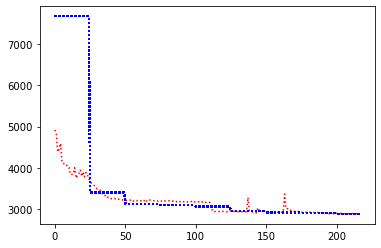

record the last path to gazebo for showing up


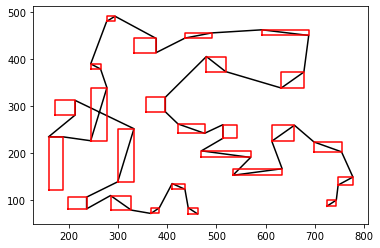

epoch:8, batch:1800/2500, reward:2889.6708984375


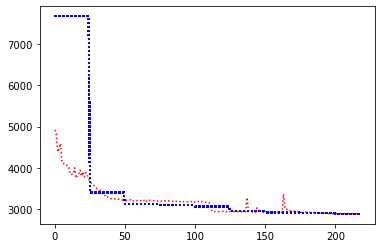

record the last path to gazebo for showing up


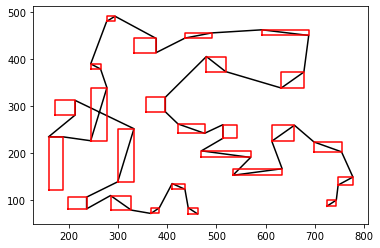

epoch:8, batch:1900/2500, reward:2892.3291015625


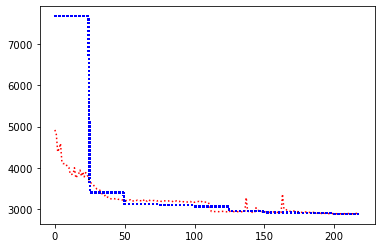

record the last path to gazebo for showing up


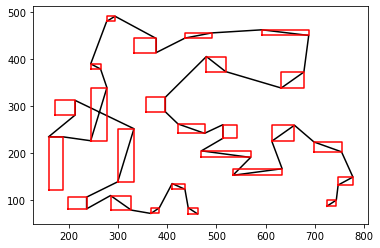

epoch:8, batch:2000/2500, reward:2891.9326171875


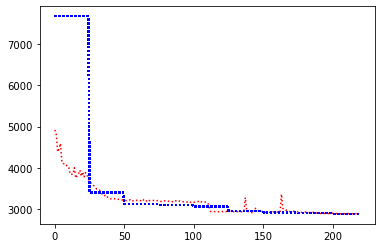

record the last path to gazebo for showing up


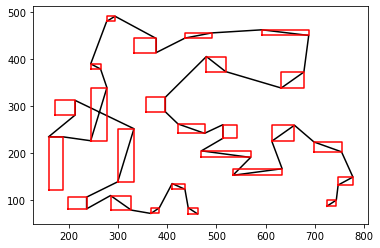

epoch:8, batch:2100/2500, reward:2892.174560546875


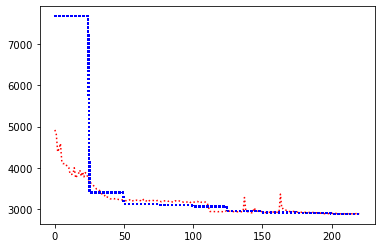

record the last path to gazebo for showing up


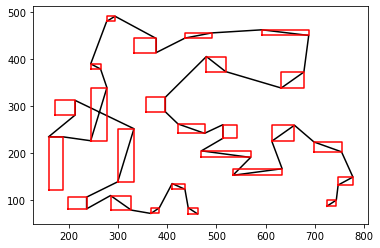

epoch:8, batch:2200/2500, reward:2887.455078125


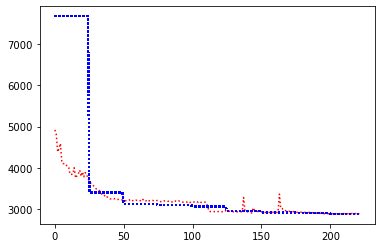

record the last path to gazebo for showing up


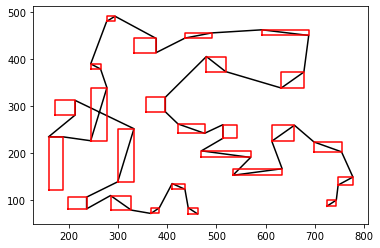

epoch:8, batch:2300/2500, reward:2889.812255859375


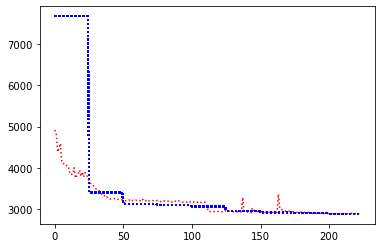

record the last path to gazebo for showing up


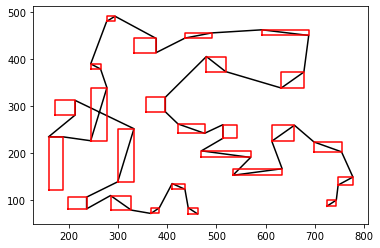

epoch:8, batch:2400/2500, reward:2888.32958984375


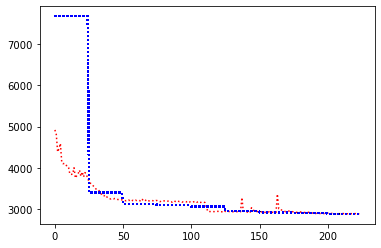

record the last path to gazebo for showing up


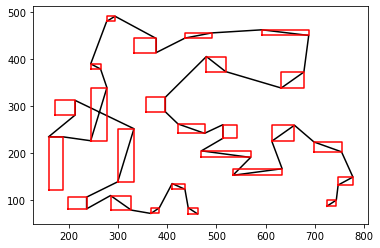

epoch:8, batch:2500/2500, reward:2891.68359375


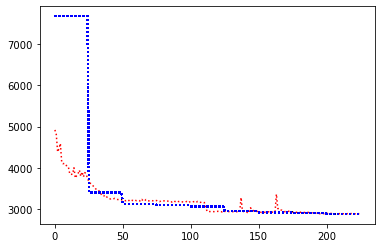

record the last path to gazebo for showing up


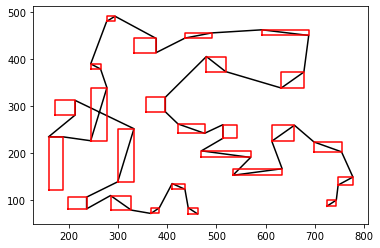

Avg Actor 2884.38037109375 --- Avg Critic 2884.38037109375
Epoch: 8, epoch time: 53.407min, tot time: 0.334day, L_actor: 2884.380, L_critic: 2884.380, update: False
Save Checkpoints
epoch:9, batch:100/2500, reward:2889.837890625


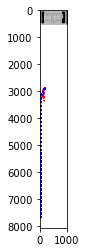

record the last path to gazebo for showing up


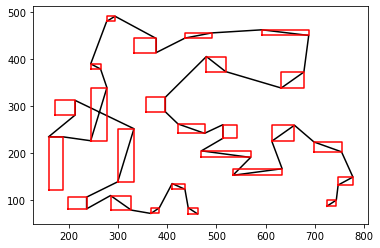

epoch:9, batch:200/2500, reward:2895.6708984375


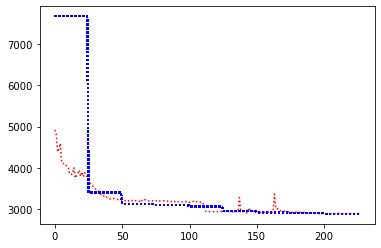

record the last path to gazebo for showing up


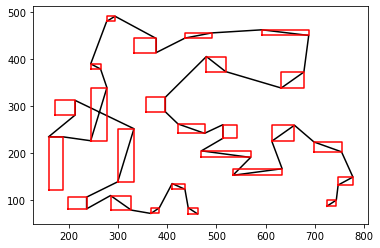

epoch:9, batch:300/2500, reward:2886.8203125


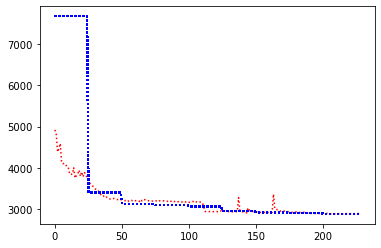

record the last path to gazebo for showing up


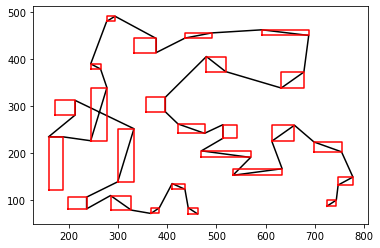

epoch:9, batch:400/2500, reward:2885.17919921875


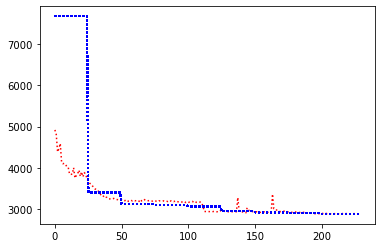

record the last path to gazebo for showing up


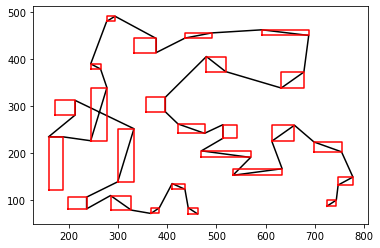

epoch:9, batch:500/2500, reward:2897.90625


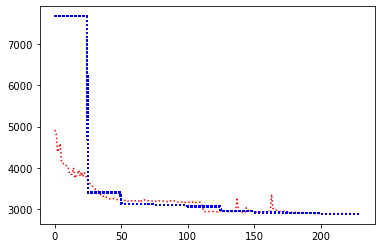

record the last path to gazebo for showing up


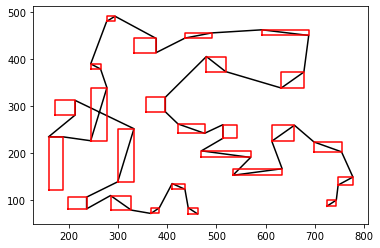

epoch:9, batch:600/2500, reward:2897.08349609375


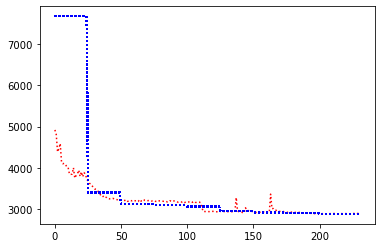

record the last path to gazebo for showing up


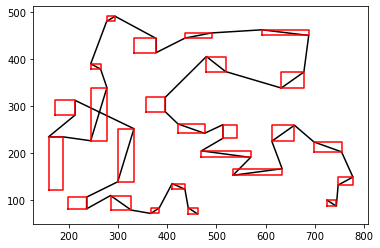

epoch:9, batch:700/2500, reward:3076.777099609375


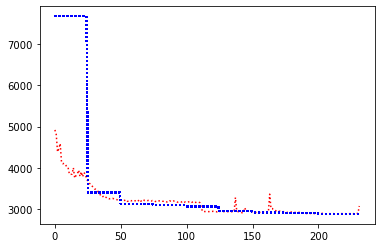

record the last path to gazebo for showing up


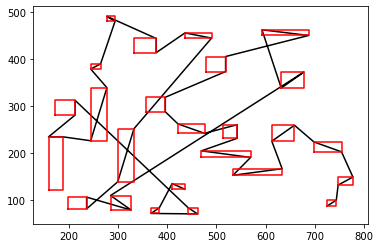

epoch:9, batch:800/2500, reward:2911.802978515625


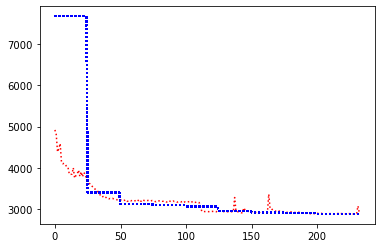

record the last path to gazebo for showing up


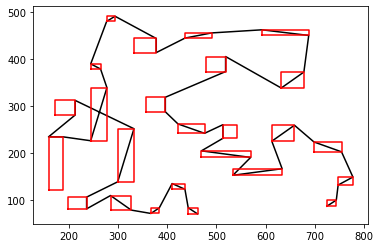

epoch:9, batch:900/2500, reward:2906.35888671875


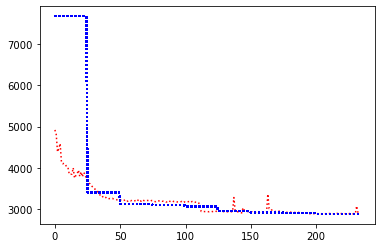

record the last path to gazebo for showing up


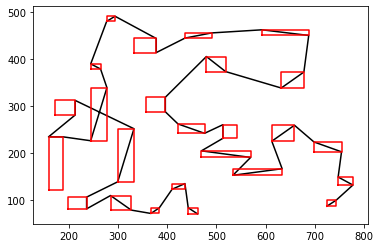

epoch:9, batch:1000/2500, reward:2908.0625


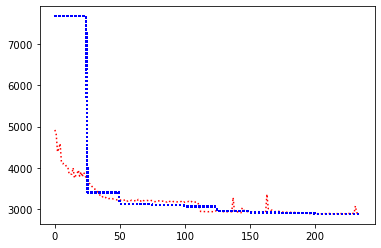

record the last path to gazebo for showing up


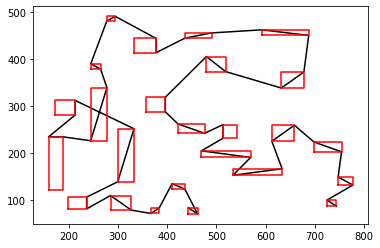

epoch:9, batch:1100/2500, reward:2908.0888671875


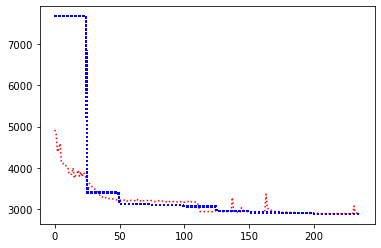

record the last path to gazebo for showing up


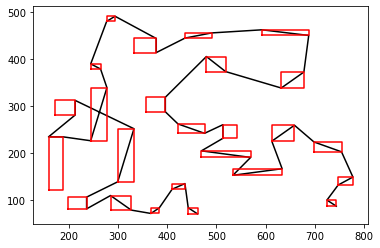

epoch:9, batch:1200/2500, reward:2902.60205078125


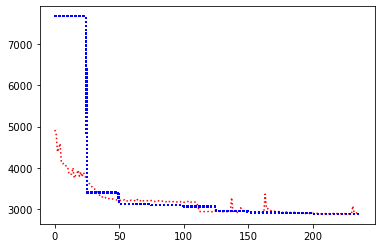

record the last path to gazebo for showing up


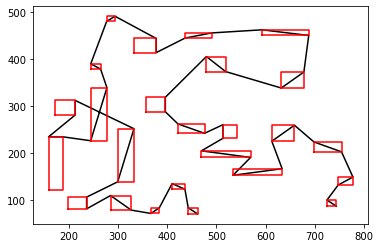

epoch:9, batch:1300/2500, reward:2904.42236328125


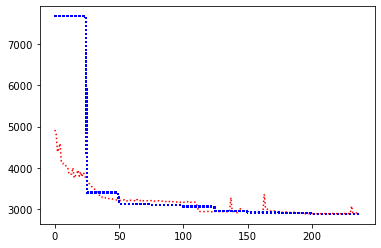

record the last path to gazebo for showing up


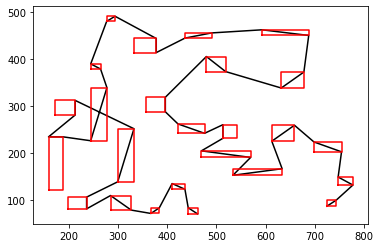

epoch:9, batch:1400/2500, reward:2901.24462890625


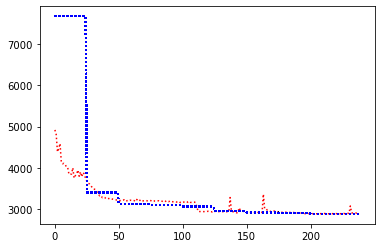

record the last path to gazebo for showing up


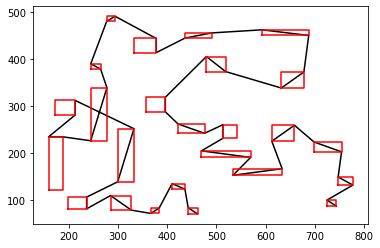

epoch:9, batch:1500/2500, reward:2905.5546875


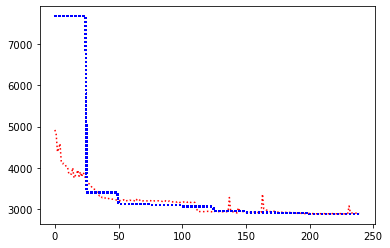

record the last path to gazebo for showing up


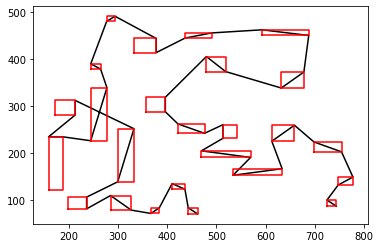

epoch:9, batch:1600/2500, reward:2904.1181640625


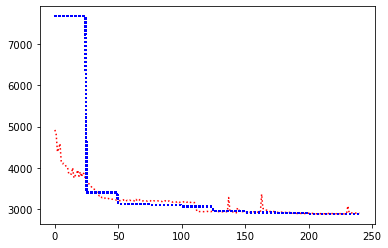

record the last path to gazebo for showing up


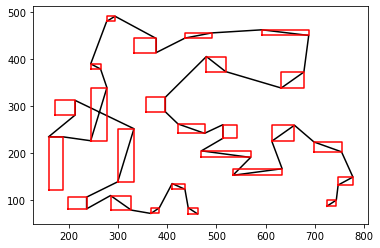

epoch:9, batch:1700/2500, reward:2896.018310546875


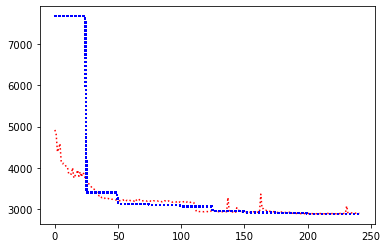

record the last path to gazebo for showing up


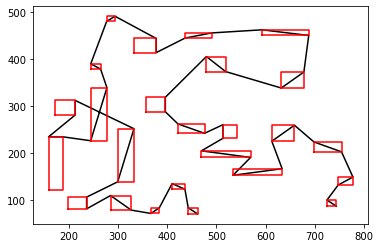

epoch:9, batch:1800/2500, reward:2901.156494140625


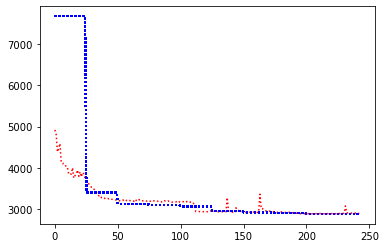

record the last path to gazebo for showing up


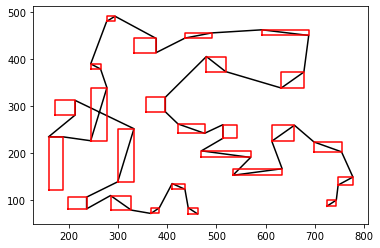

epoch:9, batch:1900/2500, reward:2900.880126953125


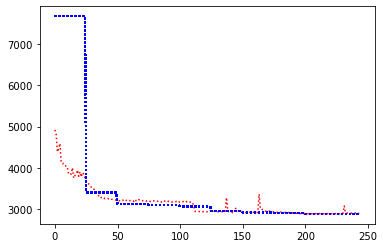

record the last path to gazebo for showing up


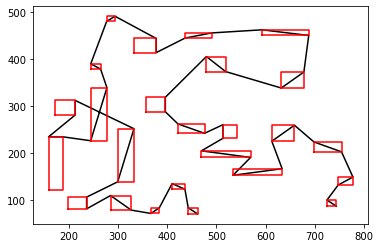

epoch:9, batch:2000/2500, reward:2901.01025390625


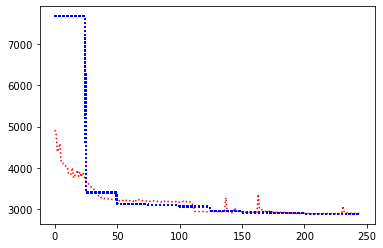

record the last path to gazebo for showing up


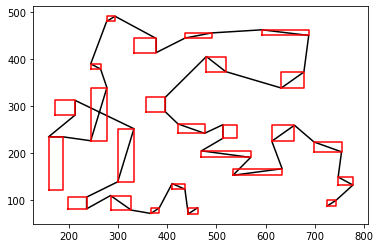

epoch:9, batch:2100/2500, reward:2900.504638671875


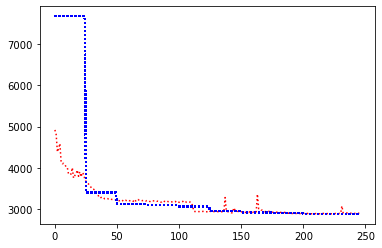

record the last path to gazebo for showing up


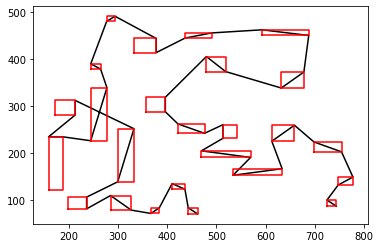

epoch:9, batch:2200/2500, reward:2899.517578125


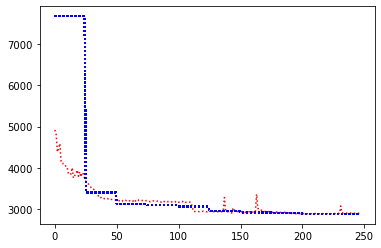

record the last path to gazebo for showing up


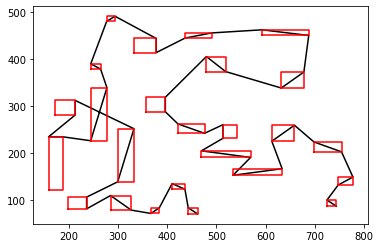

epoch:9, batch:2300/2500, reward:3125.19775390625


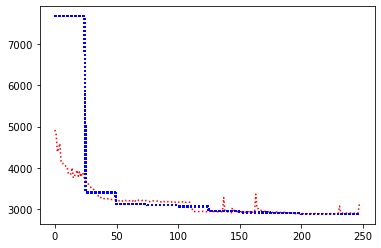

record the last path to gazebo for showing up


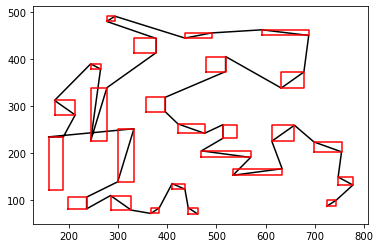

epoch:9, batch:2400/2500, reward:2919.23974609375


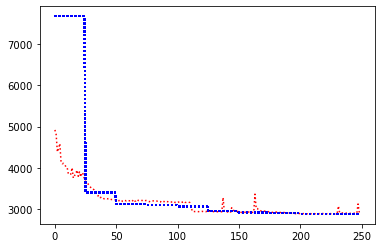

record the last path to gazebo for showing up


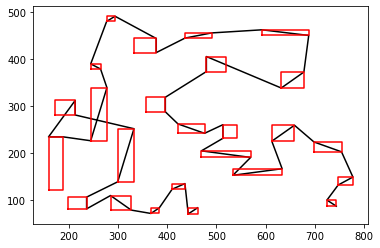

epoch:9, batch:2500/2500, reward:2918.720703125


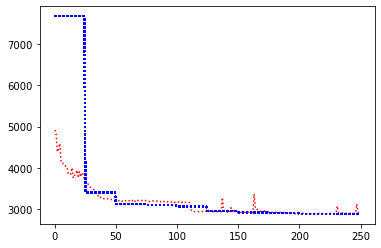

record the last path to gazebo for showing up


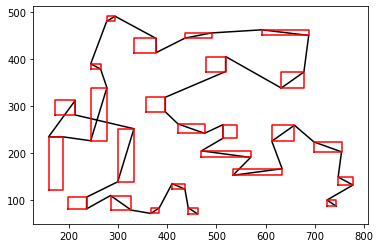

Avg Actor 2915.072021484375 --- Avg Critic 2884.38037109375
Epoch: 9, epoch time: 53.575min, tot time: 0.371day, L_actor: 2915.072, L_critic: 2884.380, update: False
Save Checkpoints
epoch:10, batch:100/2500, reward:2914.5078125


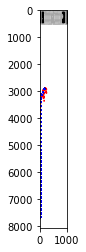

record the last path to gazebo for showing up


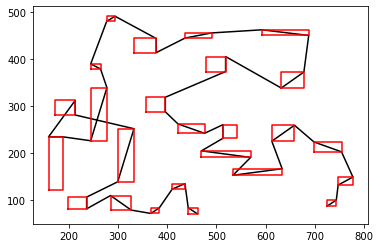

epoch:10, batch:200/2500, reward:2920.2421875


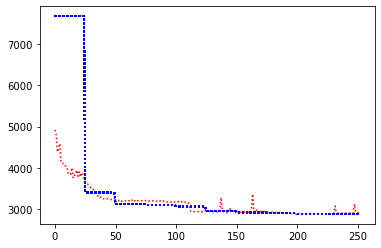

record the last path to gazebo for showing up


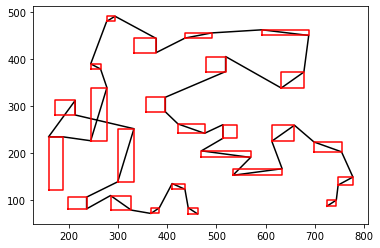

epoch:10, batch:300/2500, reward:2912.531005859375


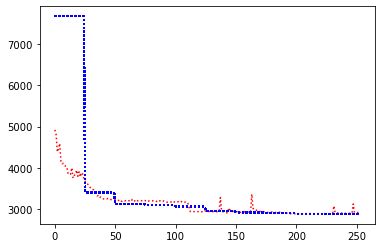

record the last path to gazebo for showing up


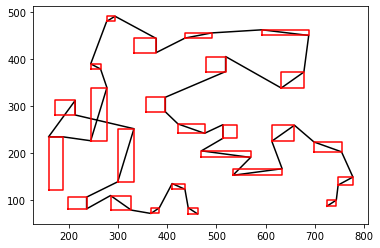

epoch:10, batch:400/2500, reward:2910.015625


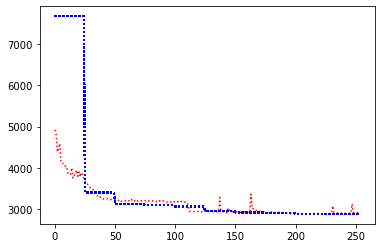

record the last path to gazebo for showing up


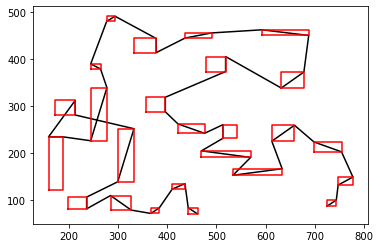

epoch:10, batch:500/2500, reward:2908.994384765625


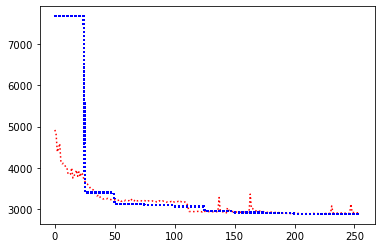

record the last path to gazebo for showing up


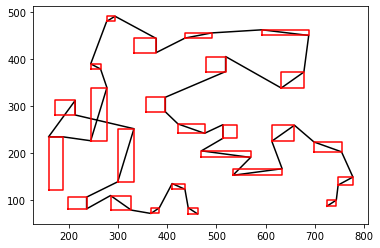

epoch:10, batch:600/2500, reward:2906.13818359375


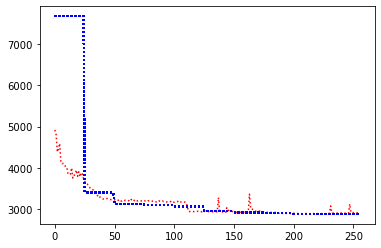

record the last path to gazebo for showing up


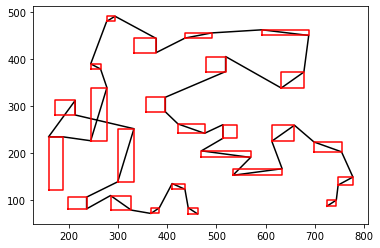

epoch:10, batch:700/2500, reward:2908.490234375


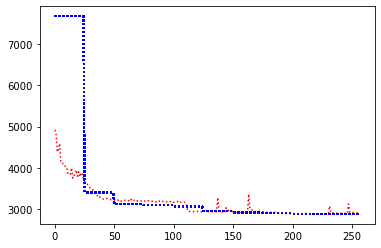

record the last path to gazebo for showing up


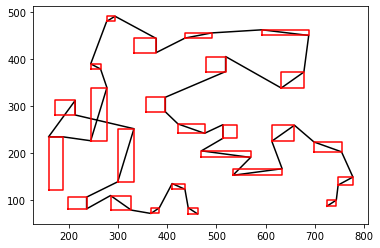

epoch:10, batch:800/2500, reward:2908.900390625


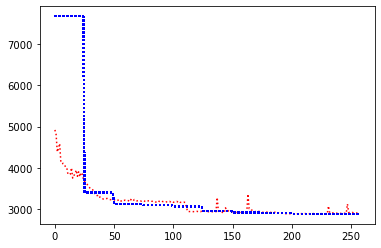

record the last path to gazebo for showing up


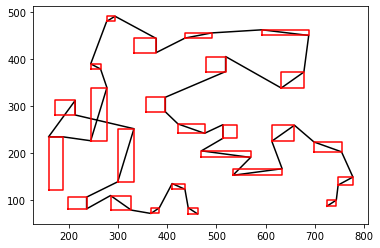

epoch:10, batch:900/2500, reward:2907.32421875


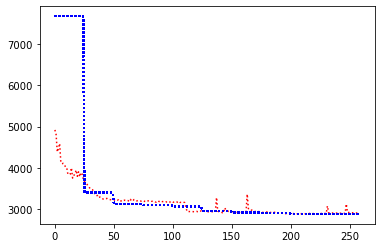

record the last path to gazebo for showing up


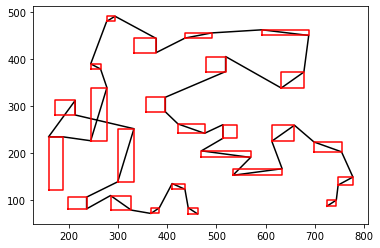

epoch:10, batch:1000/2500, reward:2913.782470703125


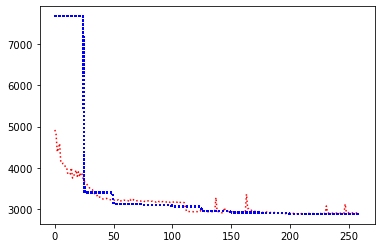

record the last path to gazebo for showing up


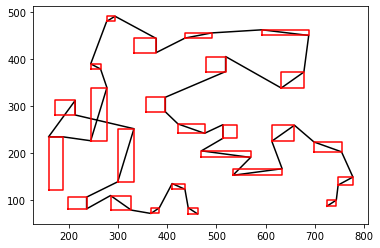

epoch:10, batch:1100/2500, reward:2907.638671875


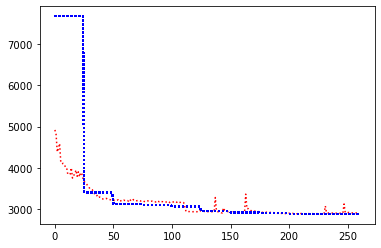

record the last path to gazebo for showing up


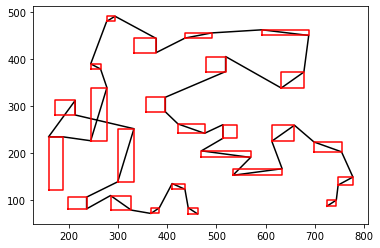

epoch:10, batch:1200/2500, reward:2926.12060546875


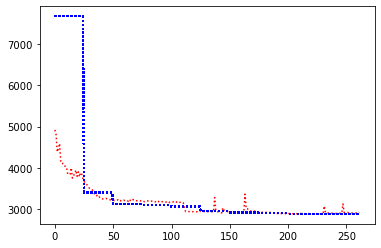

record the last path to gazebo for showing up


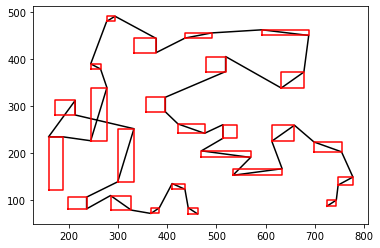

epoch:10, batch:1300/2500, reward:2925.172119140625


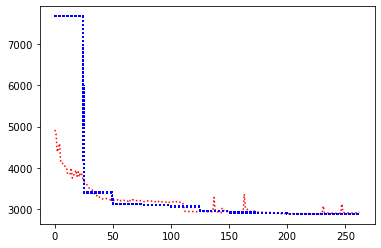

record the last path to gazebo for showing up


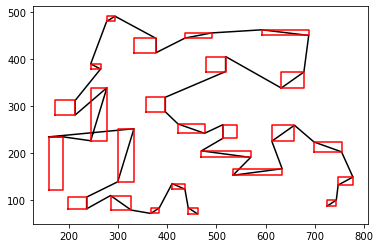

epoch:10, batch:1400/2500, reward:2903.052734375


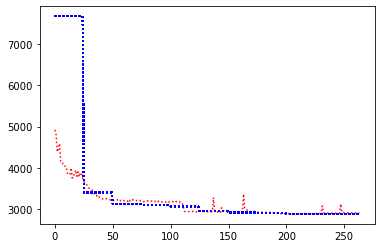

record the last path to gazebo for showing up


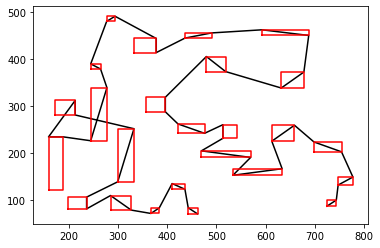

epoch:10, batch:1500/2500, reward:2904.81689453125


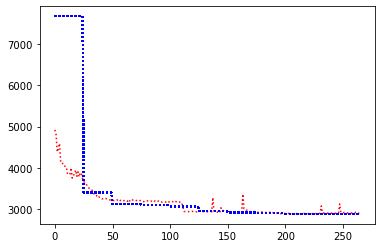

record the last path to gazebo for showing up


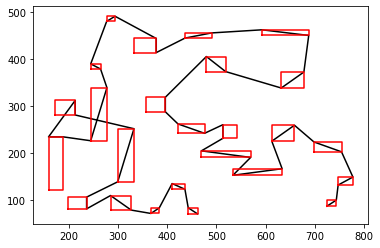

epoch:10, batch:1600/2500, reward:2902.0810546875


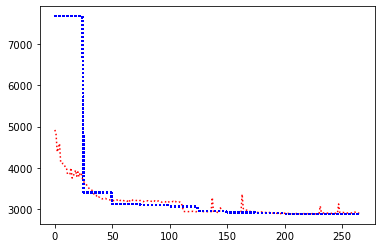

record the last path to gazebo for showing up


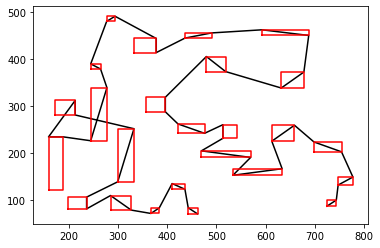

epoch:10, batch:1700/2500, reward:2904.93798828125


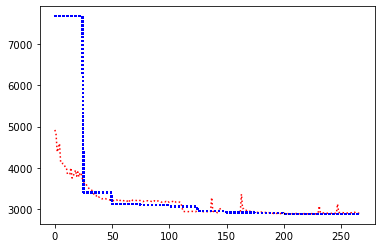

record the last path to gazebo for showing up


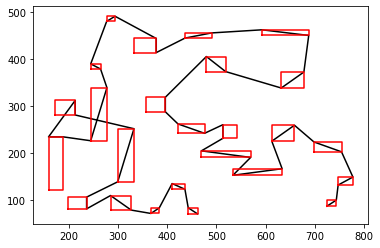

epoch:10, batch:1800/2500, reward:2909.13525390625


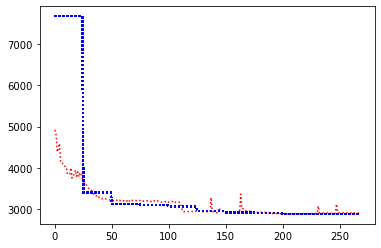

record the last path to gazebo for showing up


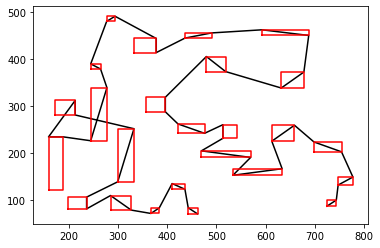

epoch:10, batch:1900/2500, reward:2906.125732421875


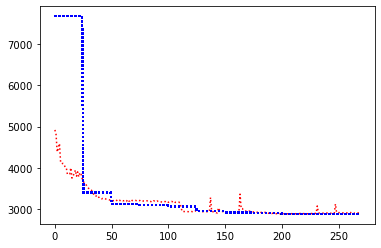

record the last path to gazebo for showing up


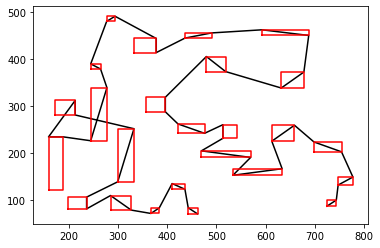

epoch:10, batch:2000/2500, reward:2903.0888671875


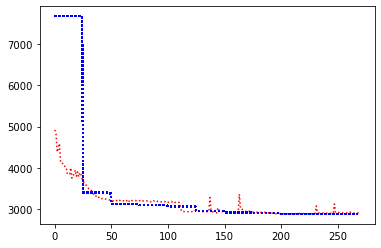

record the last path to gazebo for showing up


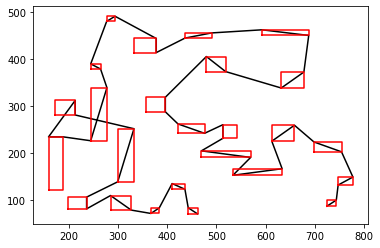

epoch:10, batch:2100/2500, reward:2901.79052734375


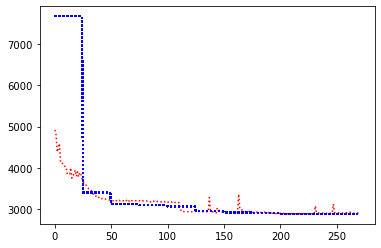

record the last path to gazebo for showing up


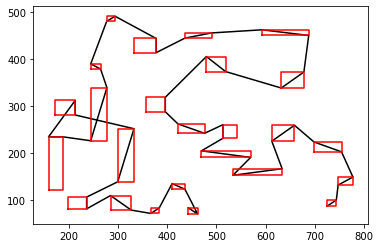

epoch:10, batch:2200/2500, reward:2905.9150390625


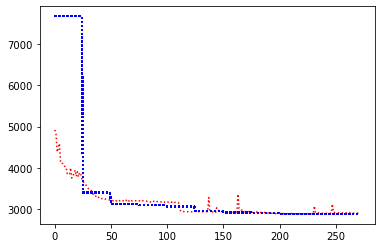

record the last path to gazebo for showing up


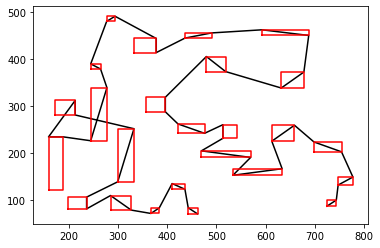

epoch:10, batch:2300/2500, reward:2906.503173828125


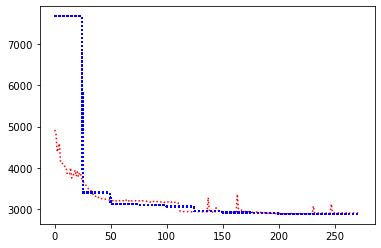

record the last path to gazebo for showing up


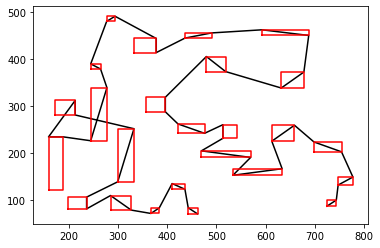

epoch:10, batch:2400/2500, reward:2908.25244140625


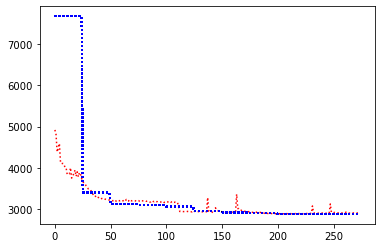

record the last path to gazebo for showing up


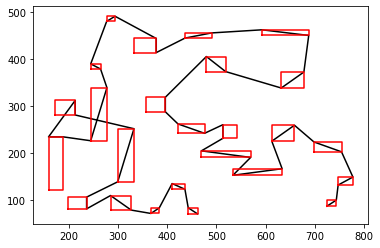

epoch:10, batch:2500/2500, reward:2911.872802734375


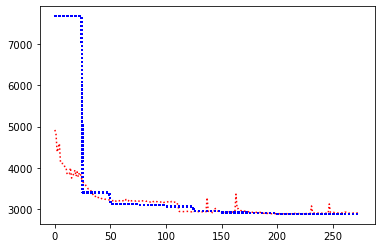

record the last path to gazebo for showing up


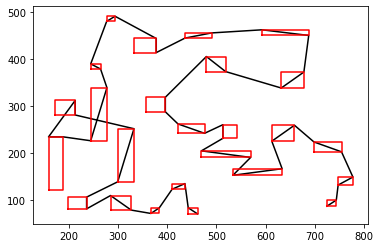

Avg Actor 2898.219970703125 --- Avg Critic 2884.38037109375
Epoch: 10, epoch time: 53.596min, tot time: 0.409day, L_actor: 2898.220, L_critic: 2884.380, update: False
Save Checkpoints
epoch:11, batch:100/2500, reward:2902.4951171875


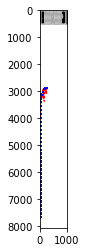

record the last path to gazebo for showing up


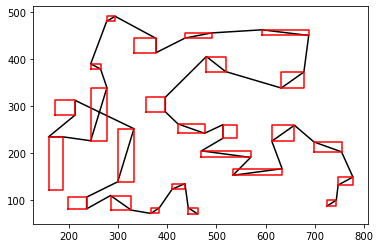

epoch:11, batch:200/2500, reward:2892.7548828125


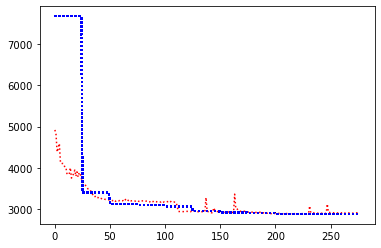

record the last path to gazebo for showing up


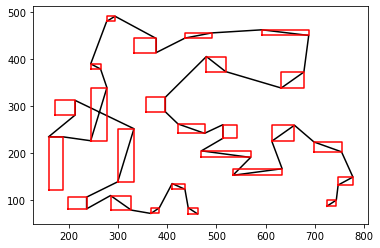

epoch:11, batch:300/2500, reward:2896.32958984375


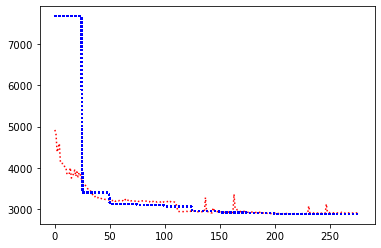

record the last path to gazebo for showing up


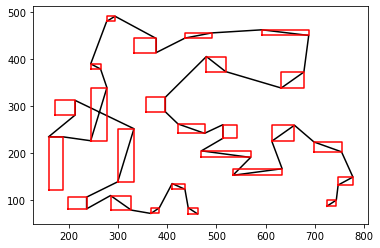

epoch:11, batch:400/2500, reward:2891.91845703125


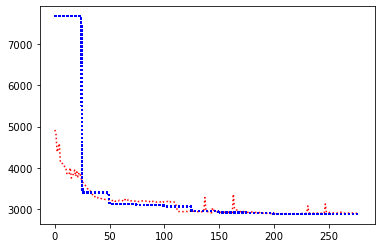

record the last path to gazebo for showing up


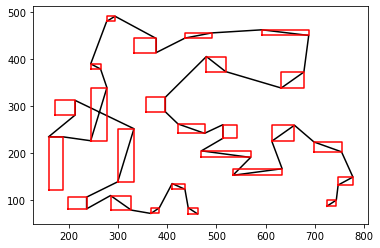

epoch:11, batch:500/2500, reward:2889.8369140625


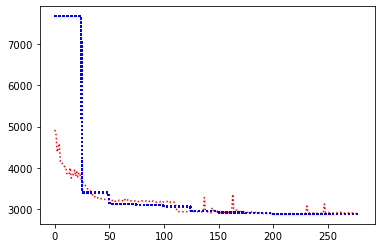

record the last path to gazebo for showing up


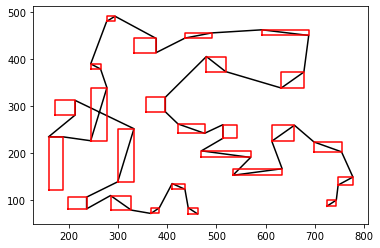

epoch:11, batch:600/2500, reward:2887.23583984375


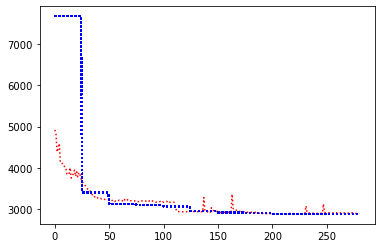

record the last path to gazebo for showing up


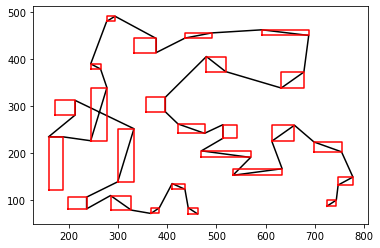

epoch:11, batch:700/2500, reward:2894.23486328125


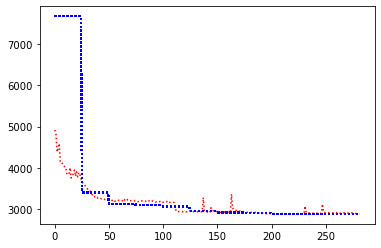

record the last path to gazebo for showing up


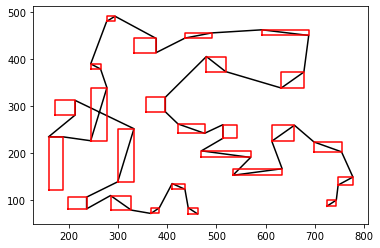

epoch:11, batch:800/2500, reward:2890.8857421875


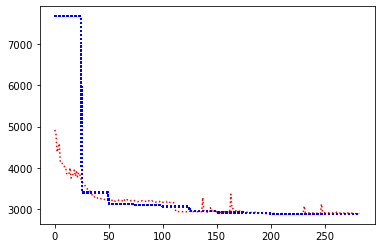

record the last path to gazebo for showing up


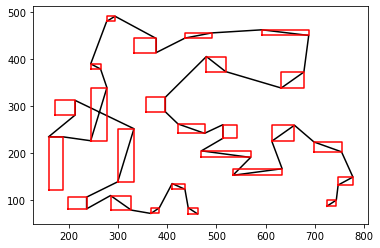

epoch:11, batch:900/2500, reward:2895.2041015625


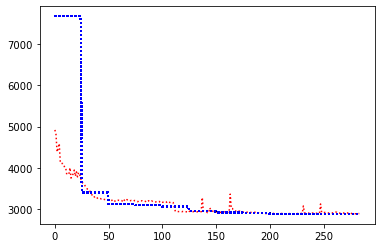

record the last path to gazebo for showing up


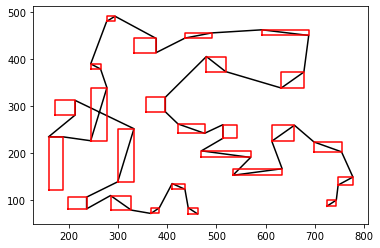

epoch:11, batch:1000/2500, reward:2892.431640625


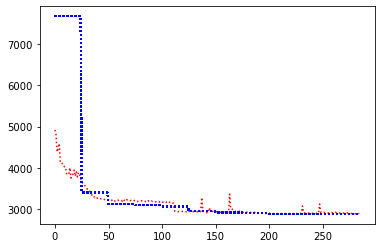

record the last path to gazebo for showing up


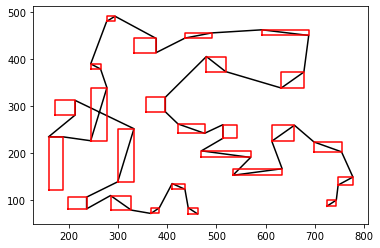

epoch:11, batch:1100/2500, reward:2888.25341796875


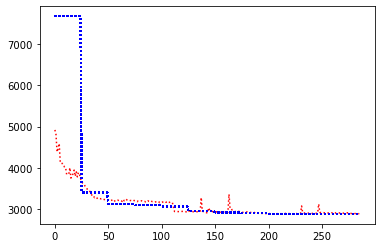

record the last path to gazebo for showing up


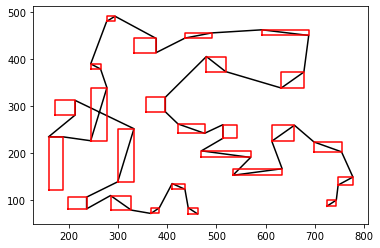

epoch:11, batch:1200/2500, reward:2894.43701171875


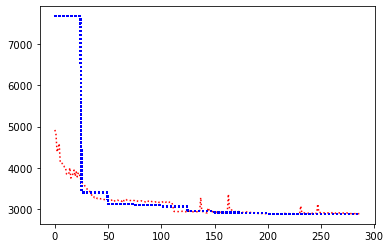

record the last path to gazebo for showing up


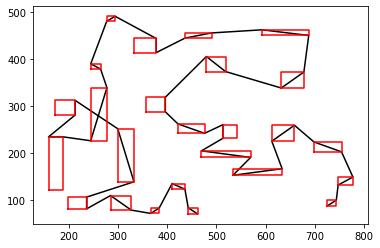

epoch:11, batch:1300/2500, reward:2888.3701171875


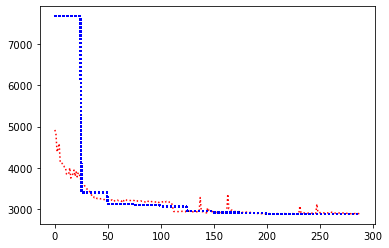

record the last path to gazebo for showing up


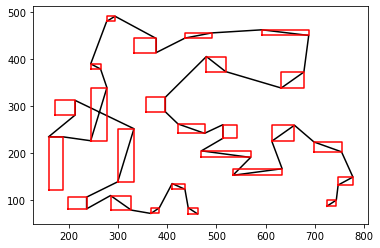

epoch:11, batch:1400/2500, reward:2885.946533203125


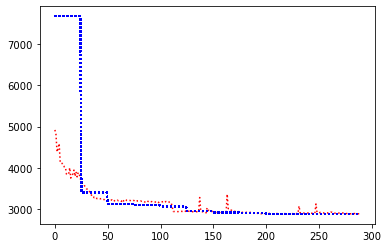

record the last path to gazebo for showing up


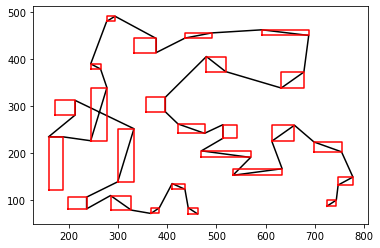

epoch:11, batch:1500/2500, reward:2893.9375


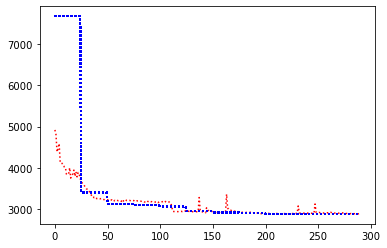

record the last path to gazebo for showing up


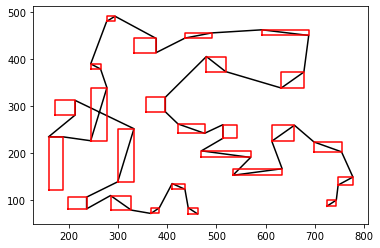

epoch:11, batch:1600/2500, reward:2890.228759765625


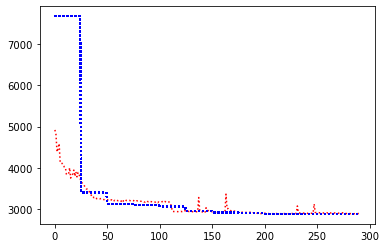

record the last path to gazebo for showing up


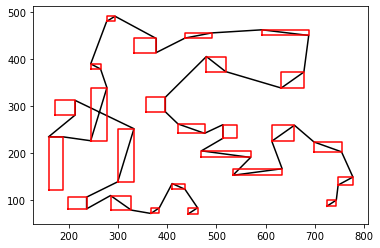

epoch:11, batch:1700/2500, reward:2899.3876953125


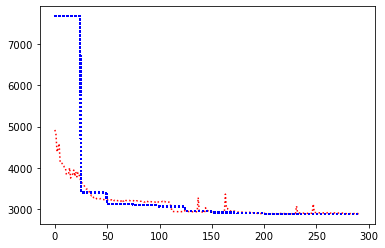

record the last path to gazebo for showing up


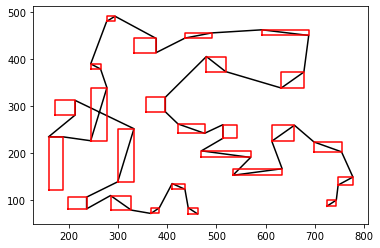

epoch:11, batch:1800/2500, reward:2887.063232421875


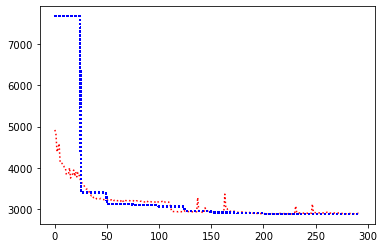

record the last path to gazebo for showing up


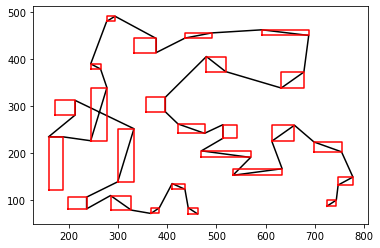

epoch:11, batch:1900/2500, reward:2889.399658203125


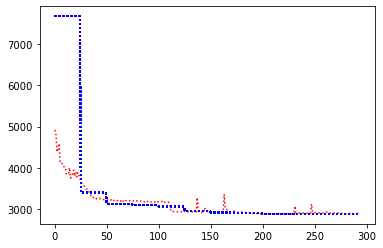

record the last path to gazebo for showing up


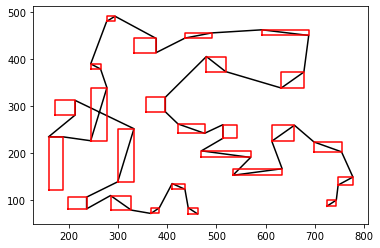

epoch:11, batch:2000/2500, reward:2885.234375


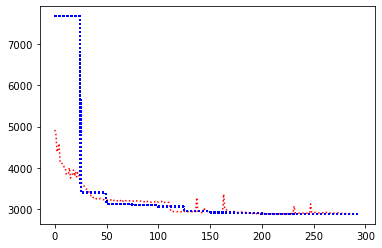

record the last path to gazebo for showing up


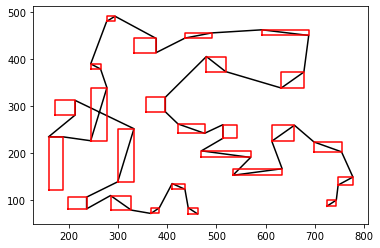

epoch:11, batch:2100/2500, reward:2922.96875


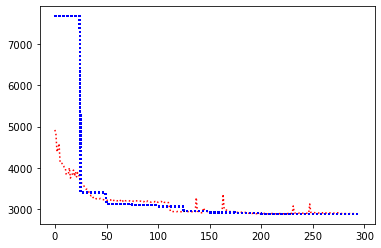

record the last path to gazebo for showing up


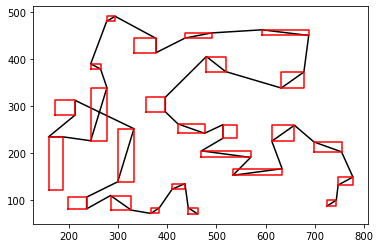

epoch:11, batch:2200/2500, reward:2891.360107421875


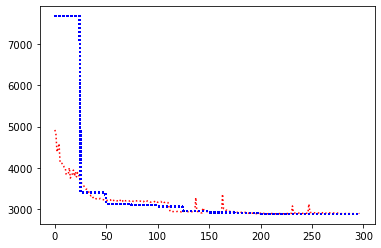

record the last path to gazebo for showing up


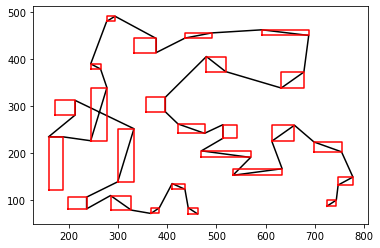

epoch:11, batch:2300/2500, reward:2900.6689453125


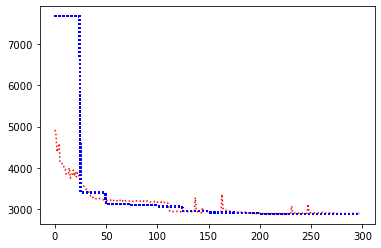

record the last path to gazebo for showing up


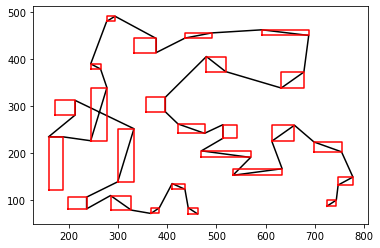

epoch:11, batch:2400/2500, reward:2944.620849609375


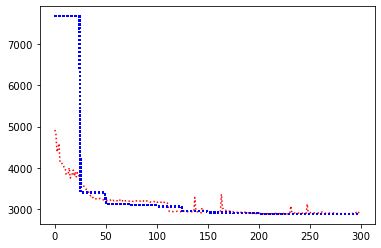

record the last path to gazebo for showing up


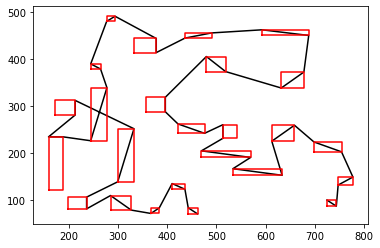

epoch:11, batch:2500/2500, reward:3052.505126953125


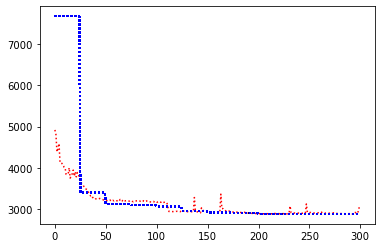

record the last path to gazebo for showing up


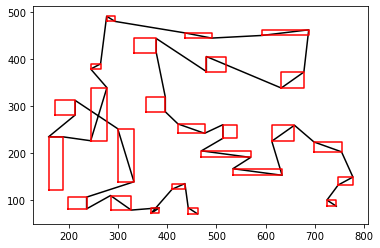

Avg Actor 2973.29833984375 --- Avg Critic 2884.38037109375
Epoch: 11, epoch time: 54.003min, tot time: 0.447day, L_actor: 2973.298, L_critic: 2884.380, update: False
Save Checkpoints
epoch:12, batch:100/2500, reward:3005.7265625


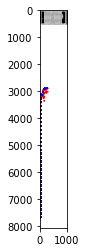

record the last path to gazebo for showing up


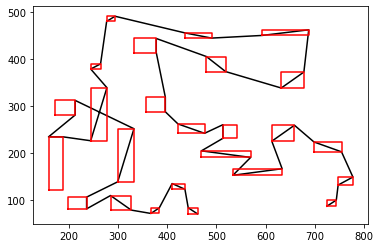

epoch:12, batch:200/2500, reward:2991.1826171875


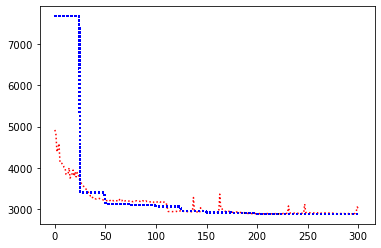

record the last path to gazebo for showing up


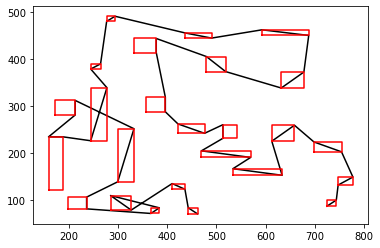

epoch:12, batch:300/2500, reward:2982.977294921875


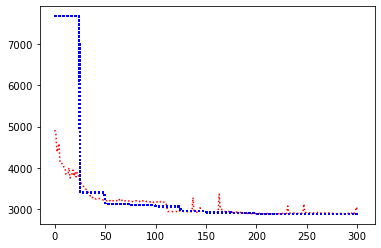

record the last path to gazebo for showing up


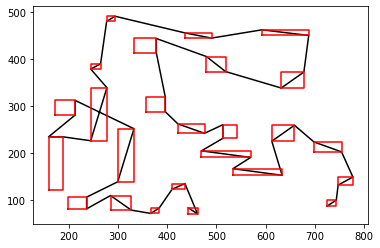

epoch:12, batch:400/2500, reward:2979.13037109375


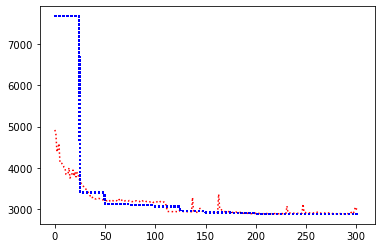

record the last path to gazebo for showing up


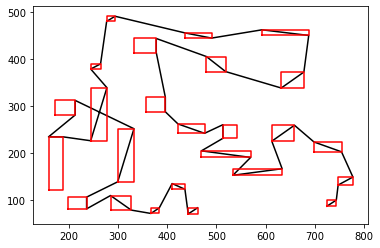

epoch:12, batch:500/2500, reward:2967.08984375


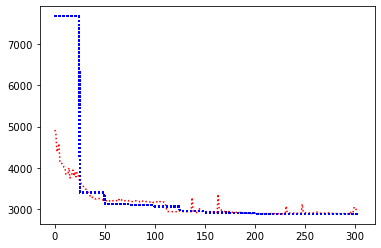

record the last path to gazebo for showing up


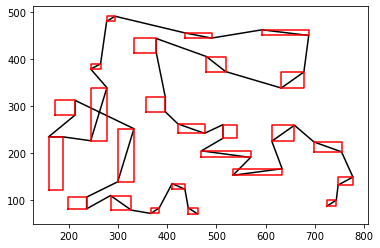

epoch:12, batch:600/2500, reward:2967.458251953125


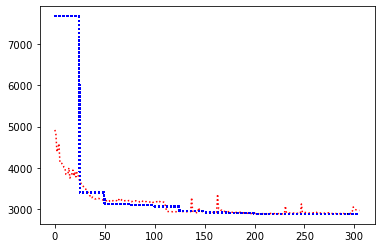

record the last path to gazebo for showing up


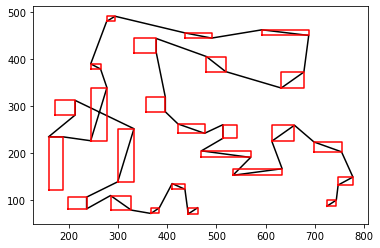

epoch:12, batch:700/2500, reward:2965.292236328125


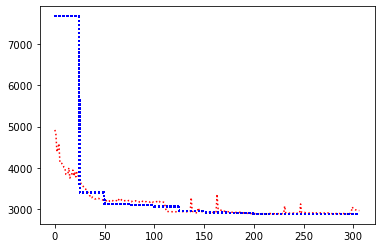

record the last path to gazebo for showing up


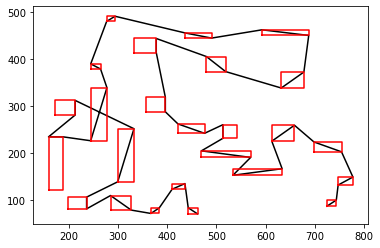

epoch:12, batch:800/2500, reward:3004.79541015625


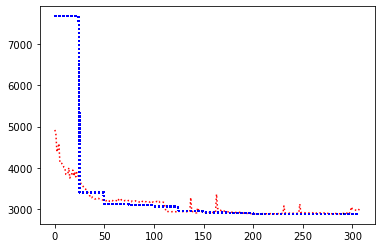

record the last path to gazebo for showing up


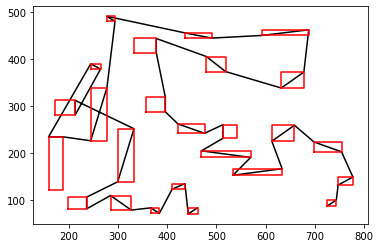

epoch:12, batch:900/2500, reward:2970.7373046875


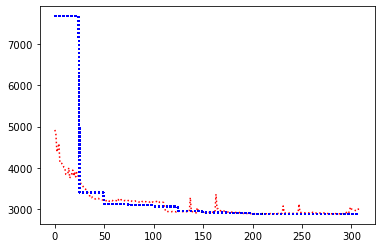

record the last path to gazebo for showing up


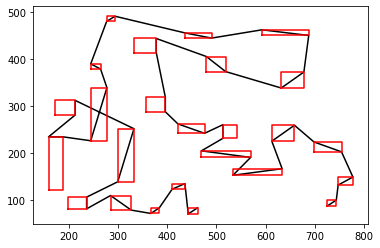

epoch:12, batch:1000/2500, reward:2972.59521484375


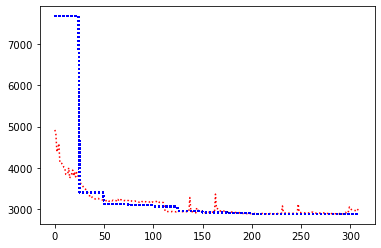

record the last path to gazebo for showing up


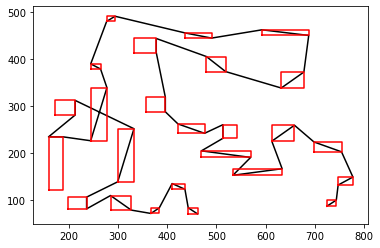

epoch:12, batch:1100/2500, reward:2972.09423828125


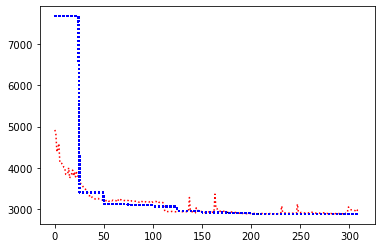

record the last path to gazebo for showing up


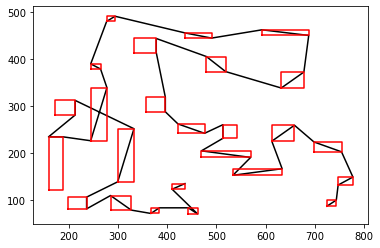

epoch:12, batch:1200/2500, reward:2962.73388671875


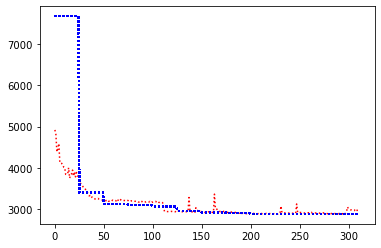

record the last path to gazebo for showing up


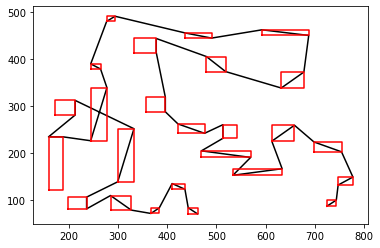

epoch:12, batch:1300/2500, reward:2961.38330078125


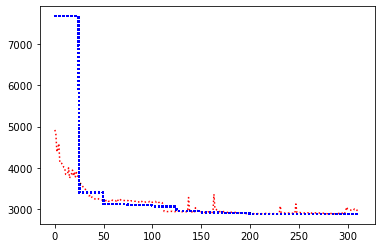

record the last path to gazebo for showing up


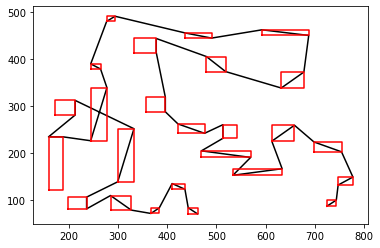

epoch:12, batch:1400/2500, reward:2960.388671875


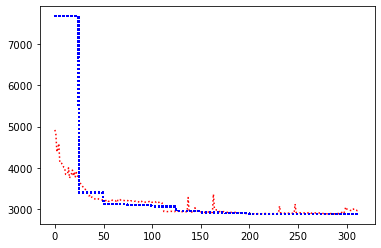

record the last path to gazebo for showing up


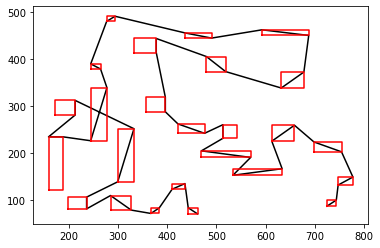

epoch:12, batch:1500/2500, reward:2959.39013671875


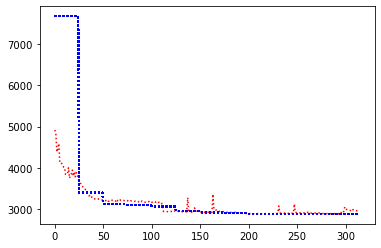

record the last path to gazebo for showing up


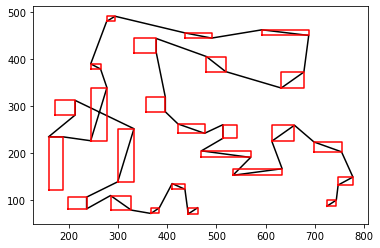

epoch:12, batch:1600/2500, reward:2969.0087890625


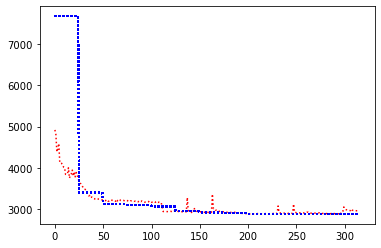

record the last path to gazebo for showing up


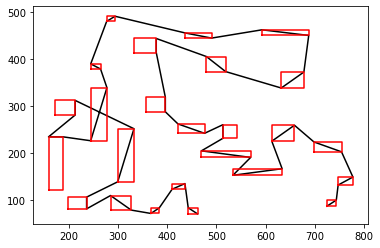

epoch:12, batch:1700/2500, reward:2971.71533203125


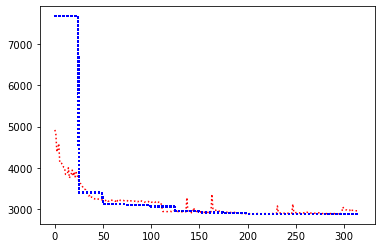

record the last path to gazebo for showing up


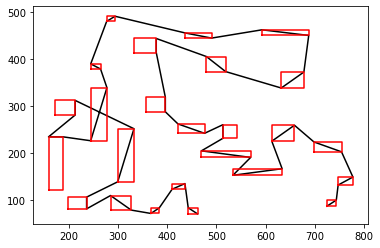

epoch:12, batch:1800/2500, reward:2965.47265625


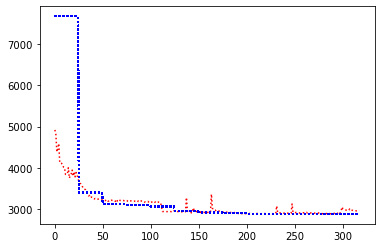

record the last path to gazebo for showing up


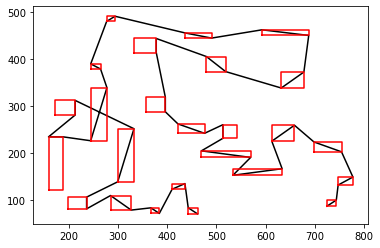

epoch:12, batch:1900/2500, reward:3035.89697265625


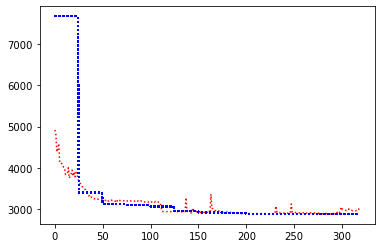

record the last path to gazebo for showing up


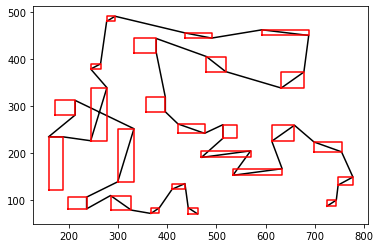

epoch:12, batch:2000/2500, reward:2987.27587890625


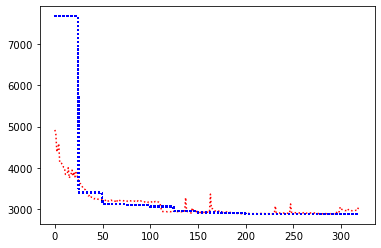

record the last path to gazebo for showing up


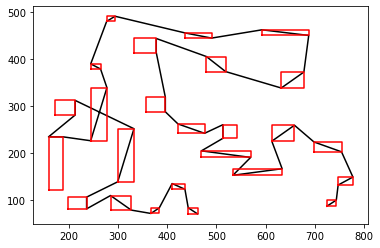

epoch:12, batch:2100/2500, reward:2997.52685546875


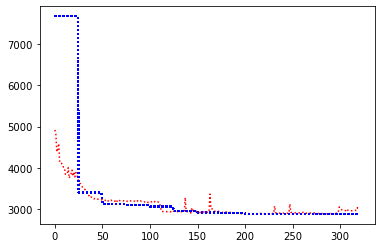

record the last path to gazebo for showing up


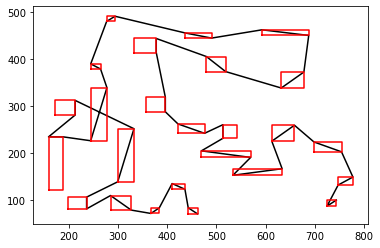

epoch:12, batch:2200/2500, reward:2993.46240234375


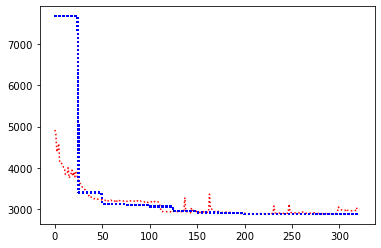

record the last path to gazebo for showing up


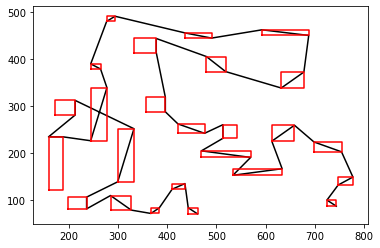

epoch:12, batch:2300/2500, reward:2972.48681640625


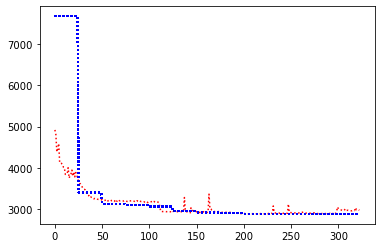

record the last path to gazebo for showing up


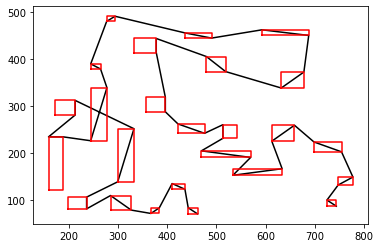

epoch:12, batch:2400/2500, reward:2981.52099609375


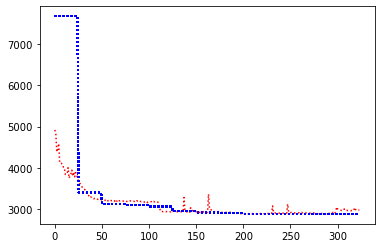

record the last path to gazebo for showing up


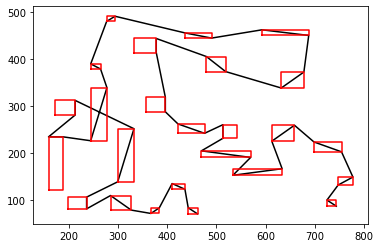

epoch:12, batch:2500/2500, reward:2979.172607421875


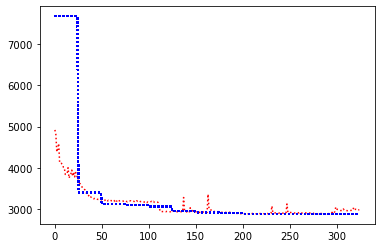

record the last path to gazebo for showing up


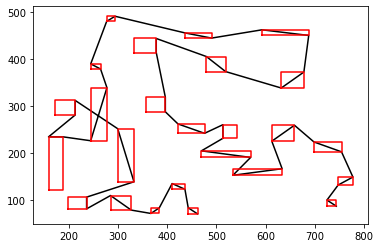

Avg Actor 2955.369140625 --- Avg Critic 2884.38037109375
Epoch: 12, epoch time: 53.964min, tot time: 0.484day, L_actor: 2955.369, L_critic: 2884.380, update: False
Save Checkpoints
epoch:13, batch:100/2500, reward:2969.81103515625


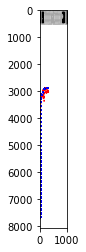

record the last path to gazebo for showing up


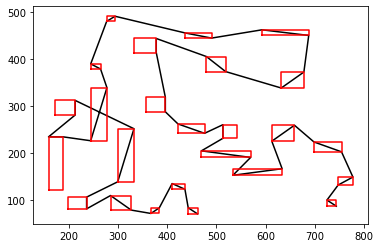

epoch:13, batch:200/2500, reward:2959.827880859375


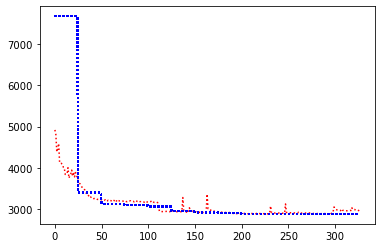

record the last path to gazebo for showing up


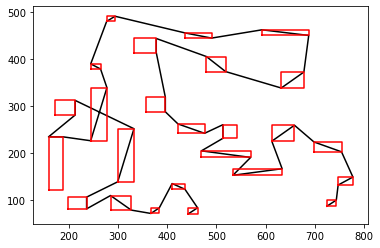

epoch:13, batch:300/2500, reward:2963.8359375


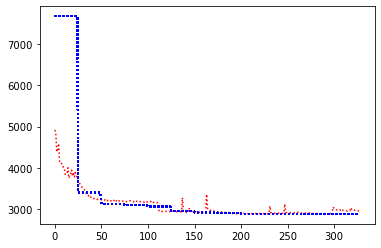

record the last path to gazebo for showing up


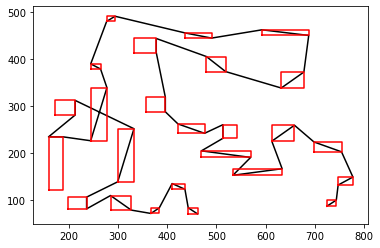

epoch:13, batch:400/2500, reward:2962.678466796875


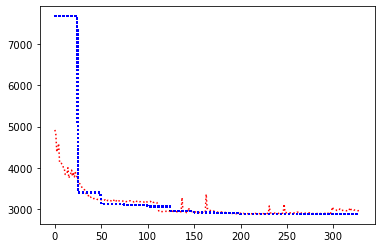

record the last path to gazebo for showing up


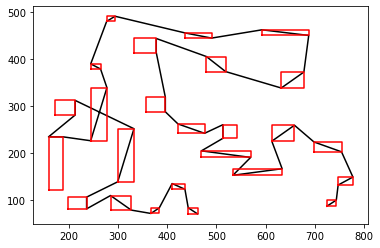

epoch:13, batch:500/2500, reward:2970.46533203125


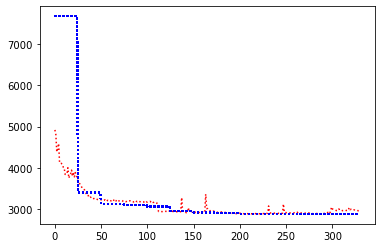

record the last path to gazebo for showing up


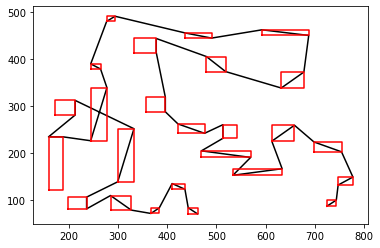

epoch:13, batch:600/2500, reward:2961.700927734375


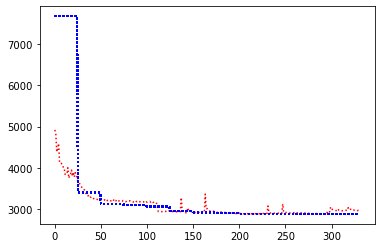

record the last path to gazebo for showing up


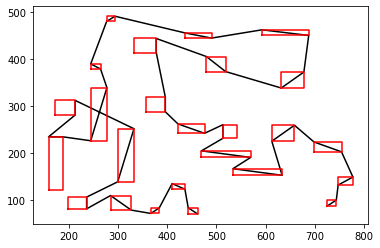

epoch:13, batch:700/2500, reward:2956.992431640625


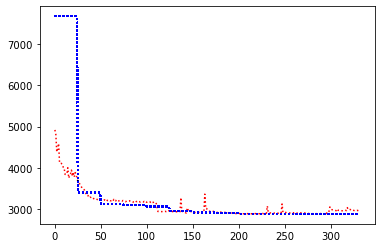

record the last path to gazebo for showing up


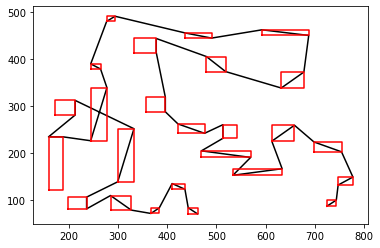

epoch:13, batch:800/2500, reward:2961.7861328125


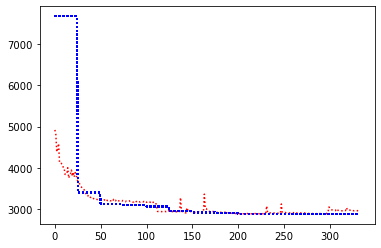

record the last path to gazebo for showing up


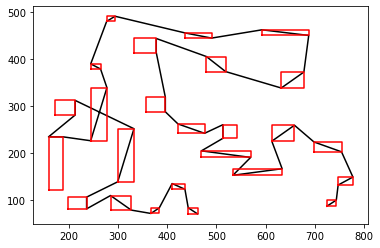

epoch:13, batch:900/2500, reward:2964.37939453125


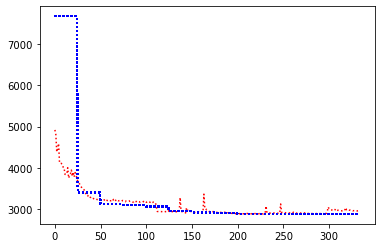

record the last path to gazebo for showing up


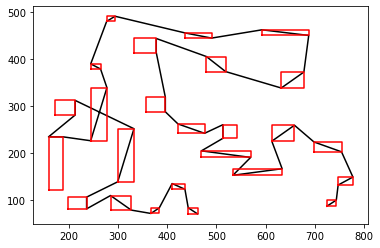

epoch:13, batch:1000/2500, reward:2957.55078125


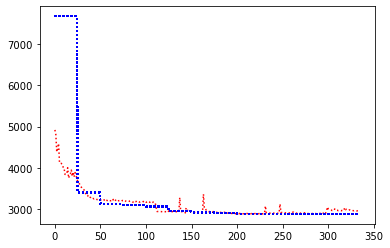

record the last path to gazebo for showing up


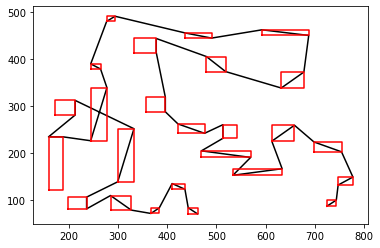

epoch:13, batch:1100/2500, reward:2956.767578125


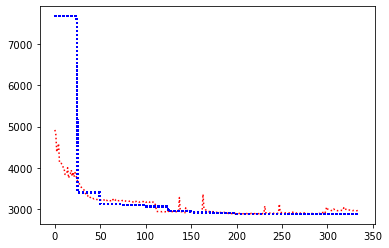

record the last path to gazebo for showing up


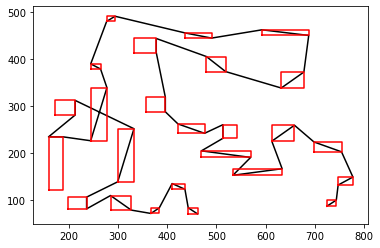

epoch:13, batch:1200/2500, reward:2959.814453125


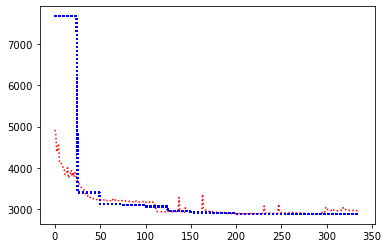

record the last path to gazebo for showing up


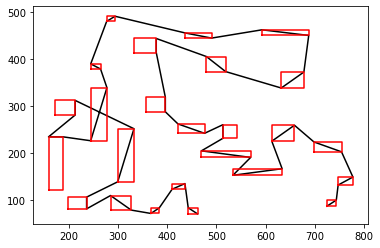

epoch:13, batch:1300/2500, reward:2968.886962890625


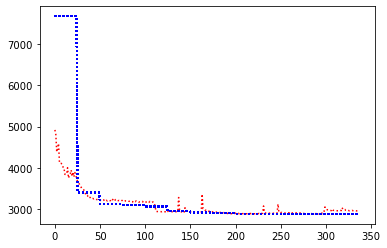

record the last path to gazebo for showing up


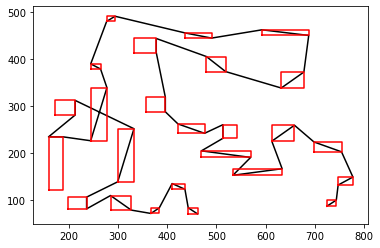

epoch:13, batch:1400/2500, reward:2956.892578125


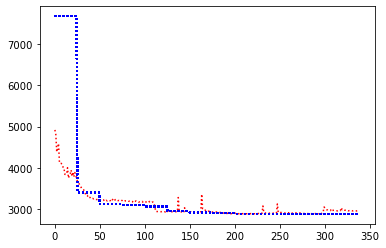

record the last path to gazebo for showing up


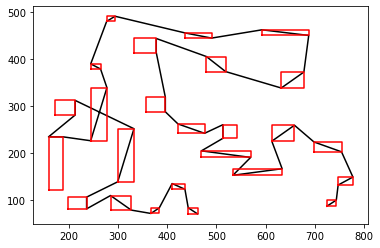

epoch:13, batch:1500/2500, reward:2958.640625


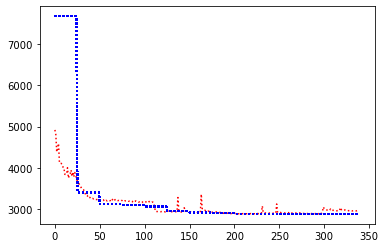

record the last path to gazebo for showing up


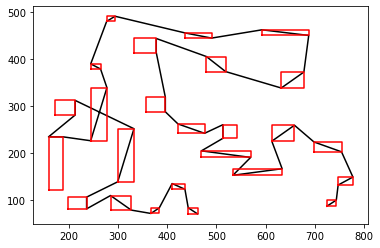

epoch:13, batch:1600/2500, reward:2960.883056640625


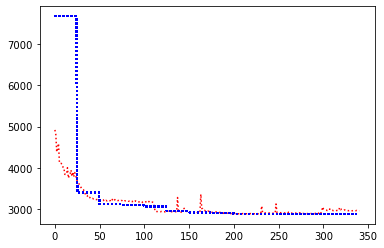

record the last path to gazebo for showing up


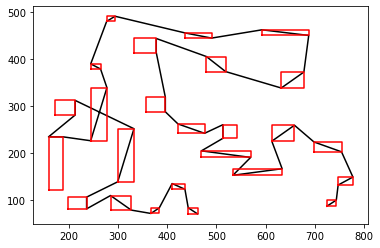

epoch:13, batch:1700/2500, reward:5537.09765625


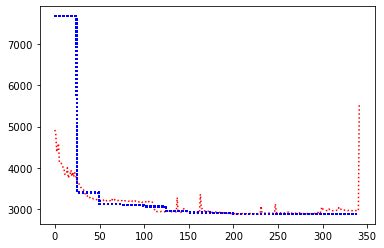

record the last path to gazebo for showing up


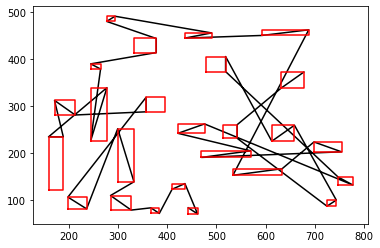

epoch:13, batch:1800/2500, reward:4891.1376953125


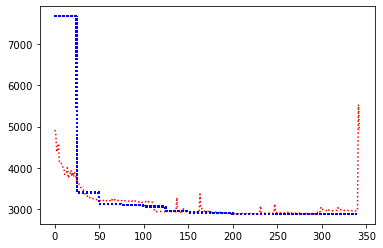

record the last path to gazebo for showing up


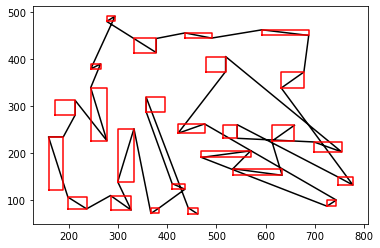

epoch:13, batch:1900/2500, reward:4770.220703125


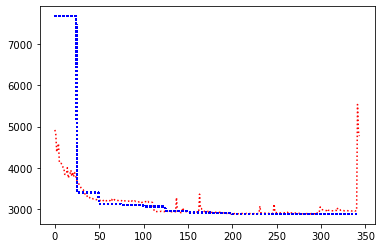

record the last path to gazebo for showing up


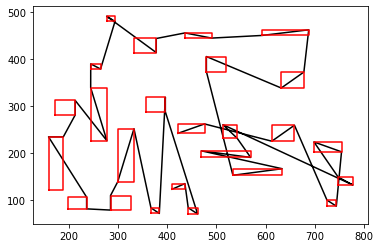

epoch:13, batch:2000/2500, reward:4470.353515625


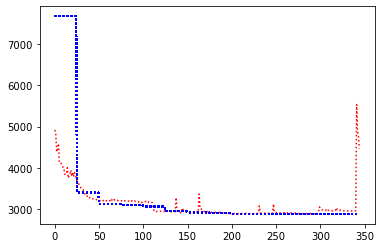

record the last path to gazebo for showing up


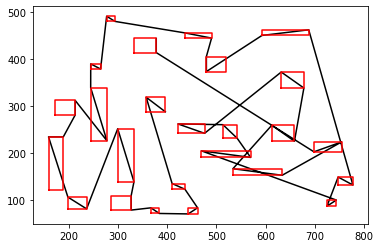

epoch:13, batch:2100/2500, reward:4501.828125


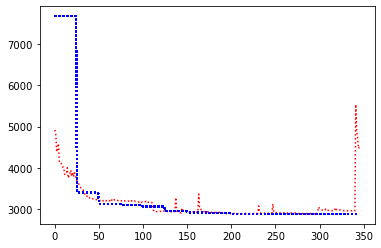

record the last path to gazebo for showing up


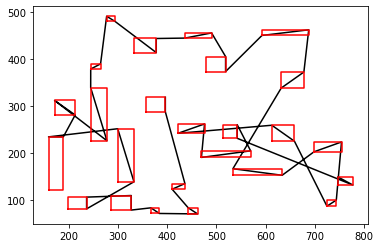

epoch:13, batch:2200/2500, reward:4105.416015625


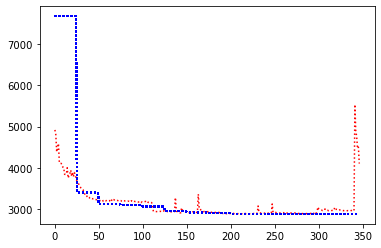

record the last path to gazebo for showing up


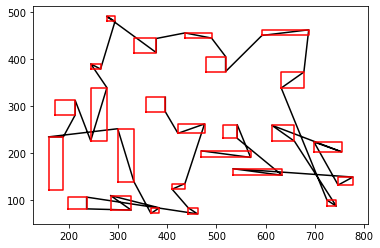

epoch:13, batch:2300/2500, reward:4036.021728515625


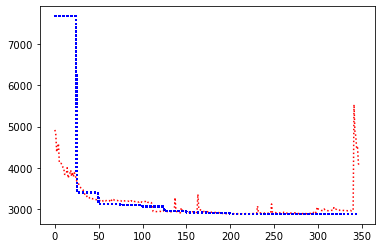

record the last path to gazebo for showing up


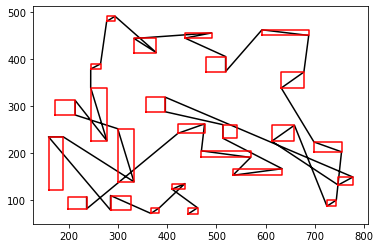

epoch:13, batch:2400/2500, reward:3860.869140625


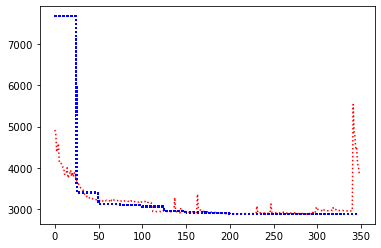

record the last path to gazebo for showing up


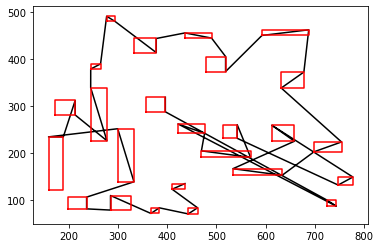

epoch:13, batch:2500/2500, reward:3816.51123046875


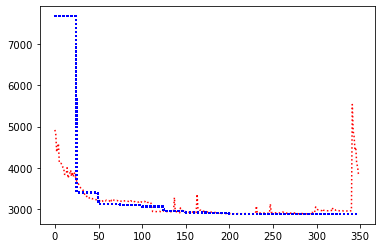

record the last path to gazebo for showing up


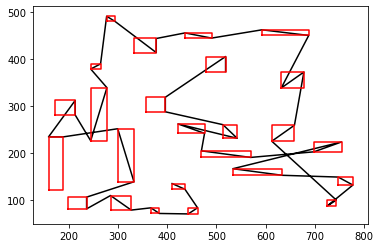

Avg Actor 3214.530517578125 --- Avg Critic 2884.38037109375
Epoch: 13, epoch time: 53.810min, tot time: 0.522day, L_actor: 3214.531, L_critic: 2884.380, update: False
Save Checkpoints
epoch:14, batch:100/2500, reward:3757.046142578125


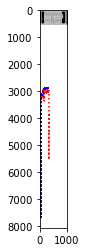

record the last path to gazebo for showing up


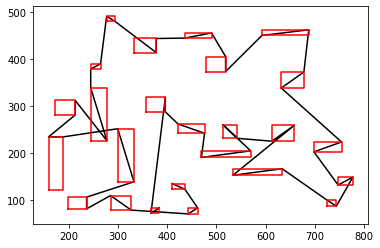

epoch:14, batch:200/2500, reward:3860.24267578125


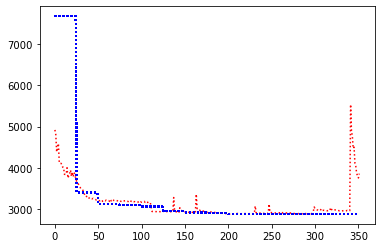

record the last path to gazebo for showing up


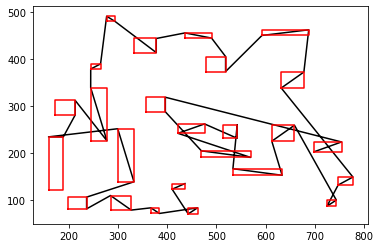

epoch:14, batch:300/2500, reward:3697.65478515625


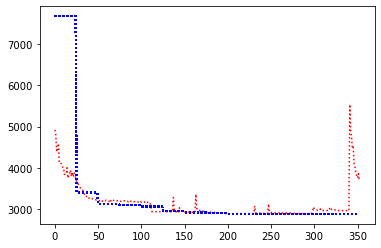

record the last path to gazebo for showing up


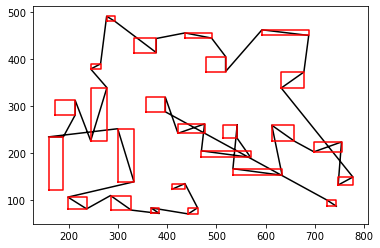

epoch:14, batch:400/2500, reward:3680.81787109375


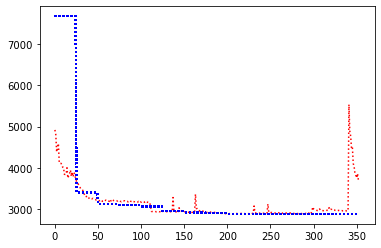

record the last path to gazebo for showing up


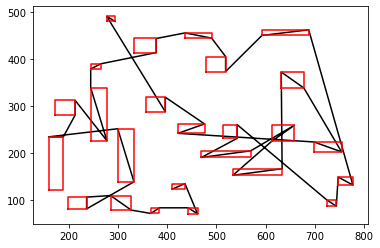

epoch:14, batch:500/2500, reward:3709.719482421875


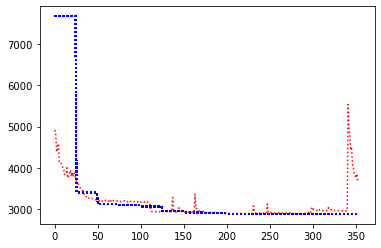

record the last path to gazebo for showing up


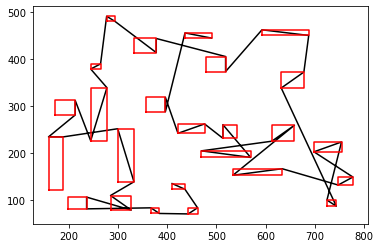

epoch:14, batch:600/2500, reward:3625.516845703125


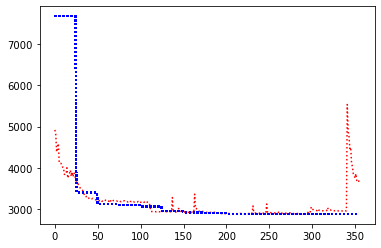

record the last path to gazebo for showing up


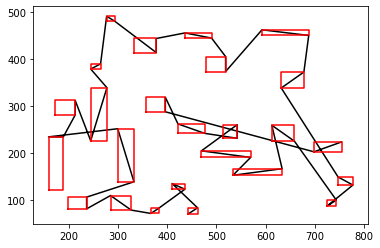

epoch:14, batch:700/2500, reward:3629.896728515625


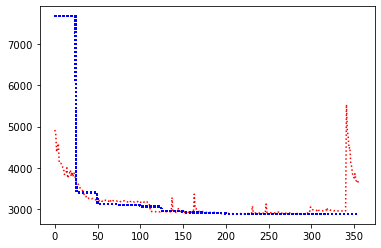

record the last path to gazebo for showing up


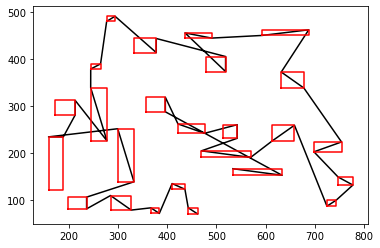

epoch:14, batch:800/2500, reward:3628.4765625


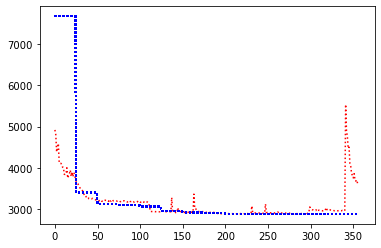

record the last path to gazebo for showing up


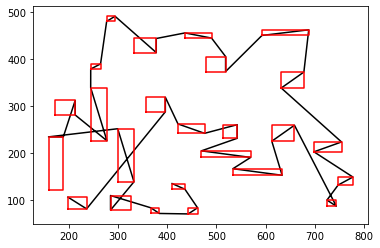

epoch:14, batch:900/2500, reward:3588.22607421875


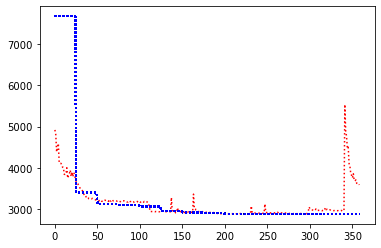

record the last path to gazebo for showing up


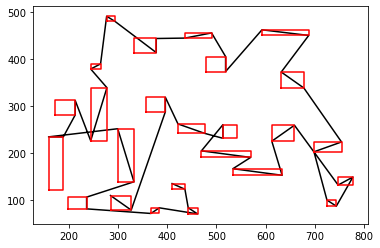

epoch:14, batch:1000/2500, reward:3637.2236328125


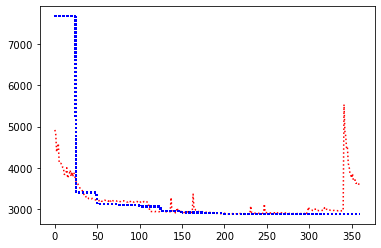

record the last path to gazebo for showing up


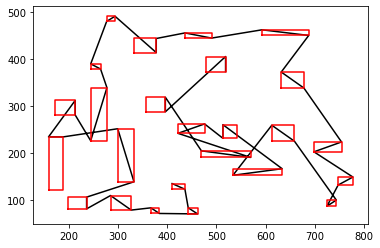

epoch:14, batch:1100/2500, reward:3547.0615234375


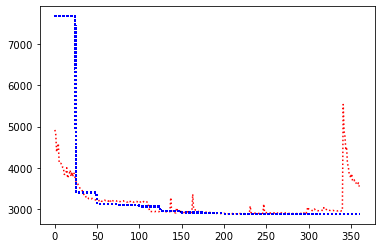

record the last path to gazebo for showing up


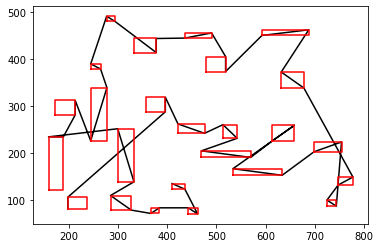

epoch:14, batch:1200/2500, reward:3582.45849609375


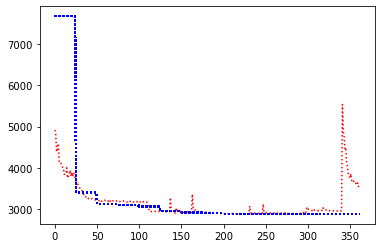

record the last path to gazebo for showing up


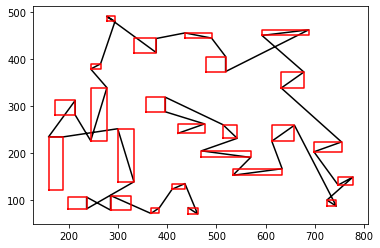

epoch:14, batch:1300/2500, reward:3551.72021484375


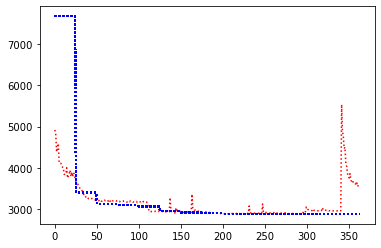

record the last path to gazebo for showing up


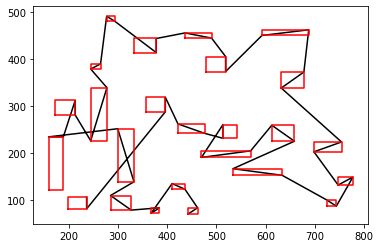

epoch:14, batch:1400/2500, reward:3557.1181640625


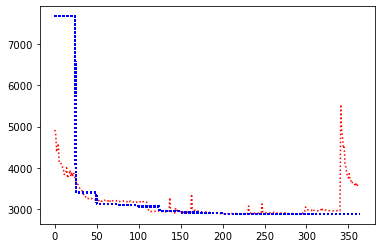

record the last path to gazebo for showing up


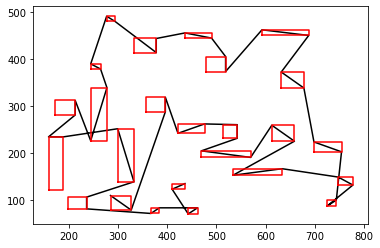

epoch:14, batch:1500/2500, reward:3556.8408203125


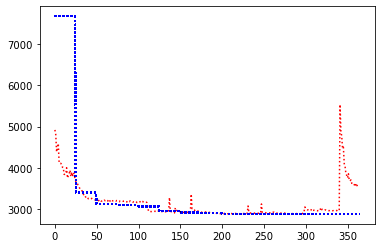

record the last path to gazebo for showing up


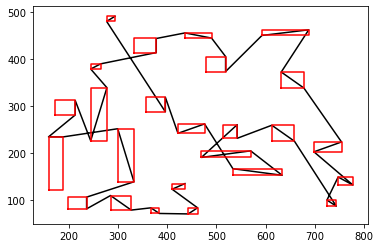

epoch:14, batch:1600/2500, reward:3545.2509765625


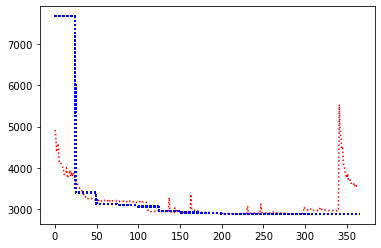

record the last path to gazebo for showing up


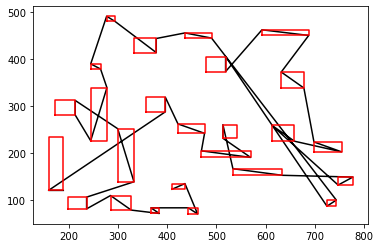

epoch:14, batch:1700/2500, reward:3474.60498046875


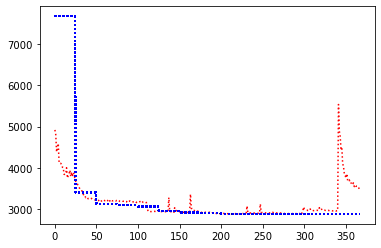

record the last path to gazebo for showing up


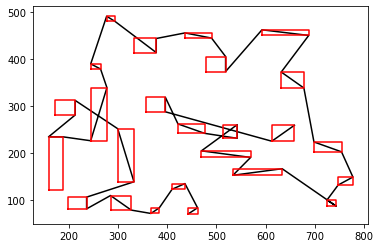

epoch:14, batch:1800/2500, reward:3527.14892578125


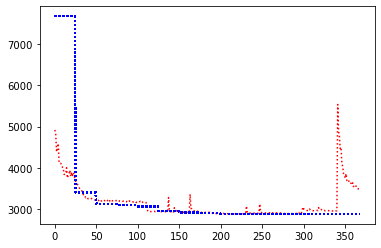

record the last path to gazebo for showing up


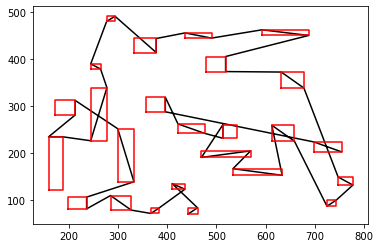

epoch:14, batch:1900/2500, reward:3447.547607421875


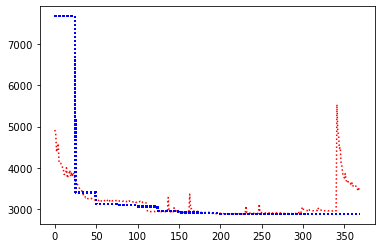

record the last path to gazebo for showing up


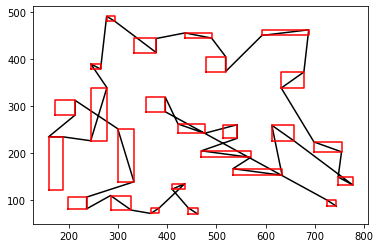

epoch:14, batch:2000/2500, reward:3456.658935546875


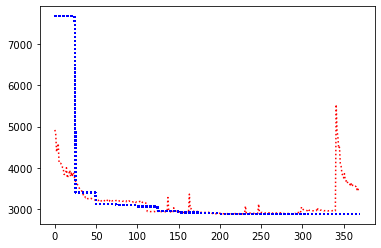

record the last path to gazebo for showing up


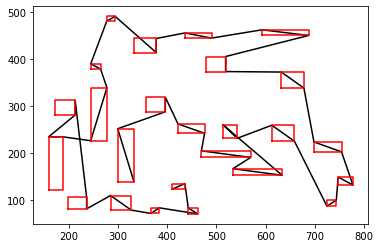

epoch:14, batch:2100/2500, reward:3496.083984375


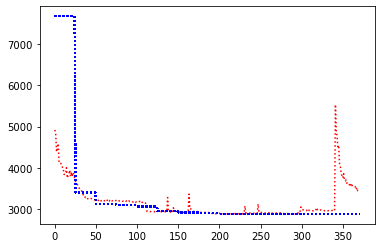

record the last path to gazebo for showing up


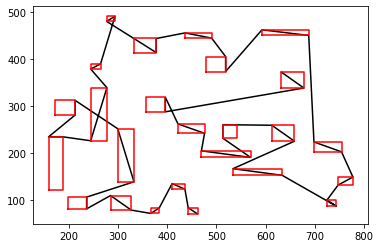

epoch:14, batch:2200/2500, reward:3203.2724609375


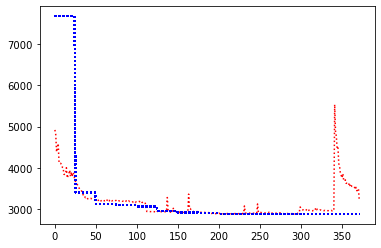

record the last path to gazebo for showing up


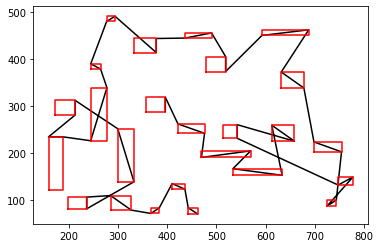

epoch:14, batch:2300/2500, reward:3178.263671875


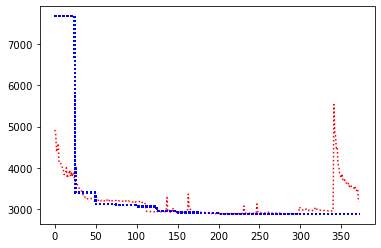

record the last path to gazebo for showing up


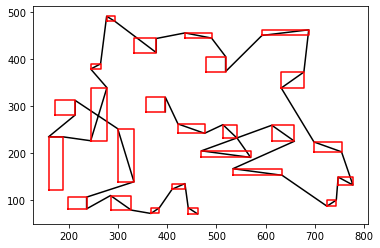

epoch:14, batch:2400/2500, reward:3187.70361328125


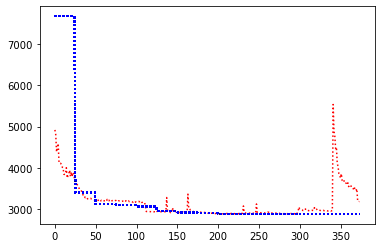

record the last path to gazebo for showing up


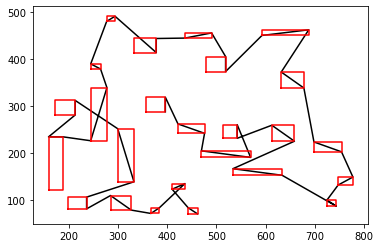

epoch:14, batch:2500/2500, reward:3179.5791015625


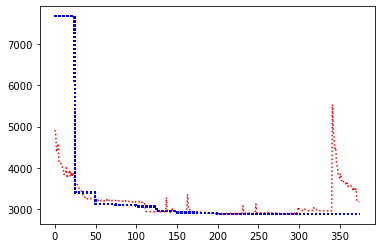

record the last path to gazebo for showing up


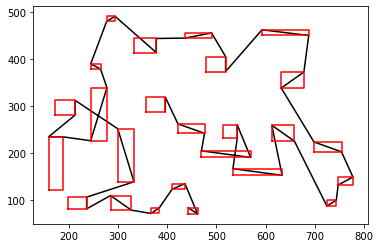

Avg Actor 3088.931640625 --- Avg Critic 2884.38037109375
Epoch: 14, epoch time: 54.063min, tot time: 0.560day, L_actor: 3088.932, L_critic: 2884.380, update: False
Save Checkpoints
epoch:15, batch:100/2500, reward:3169.536376953125


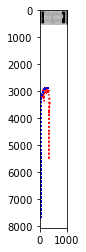

record the last path to gazebo for showing up


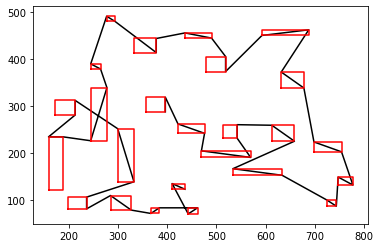

epoch:15, batch:200/2500, reward:3163.822021484375


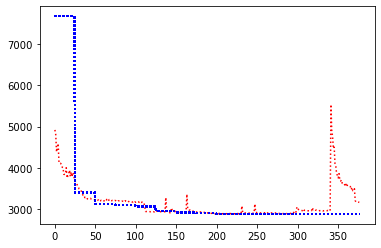

record the last path to gazebo for showing up


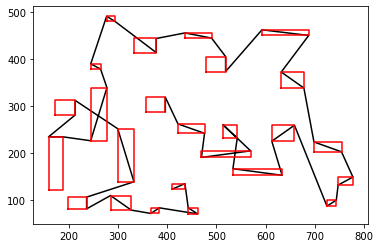

epoch:15, batch:300/2500, reward:3165.553955078125


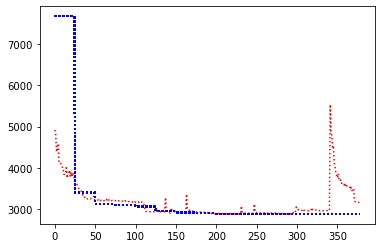

record the last path to gazebo for showing up


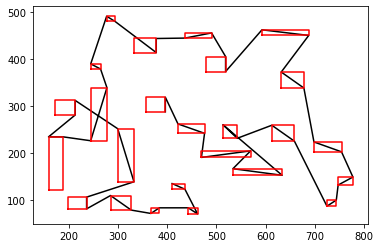

epoch:15, batch:400/2500, reward:3168.53173828125


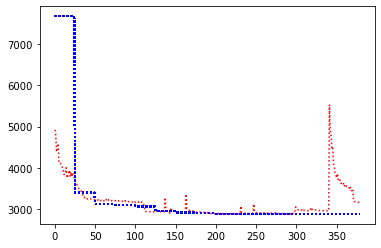

record the last path to gazebo for showing up


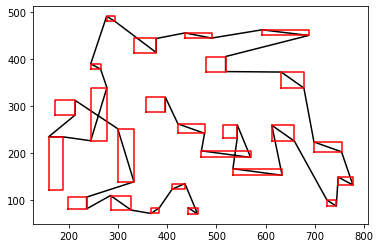

epoch:15, batch:500/2500, reward:3153.2275390625


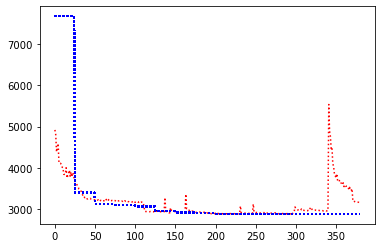

record the last path to gazebo for showing up


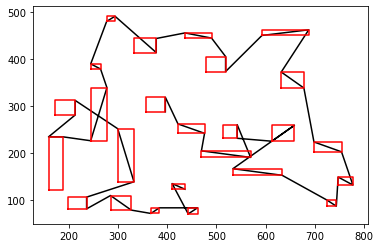

epoch:15, batch:600/2500, reward:3169.87109375


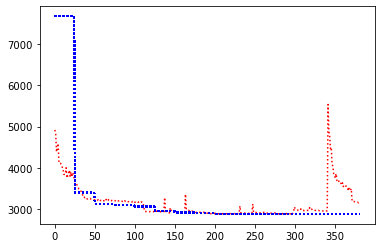

record the last path to gazebo for showing up


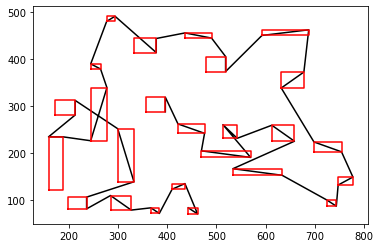

epoch:15, batch:700/2500, reward:3142.142822265625


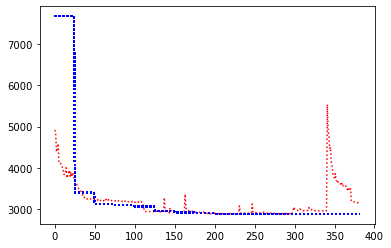

record the last path to gazebo for showing up


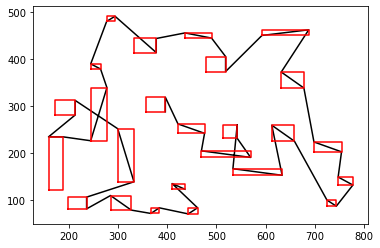

epoch:15, batch:800/2500, reward:3155.166015625


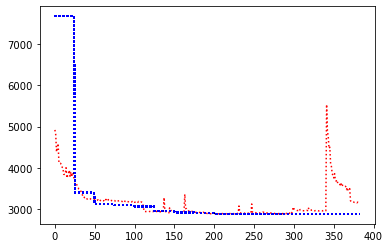

record the last path to gazebo for showing up


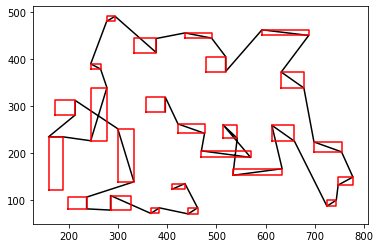

epoch:15, batch:900/2500, reward:3141.17724609375


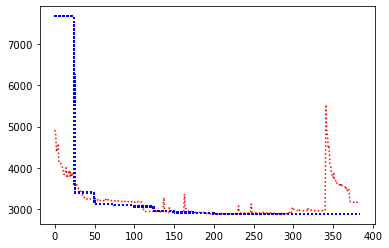

record the last path to gazebo for showing up


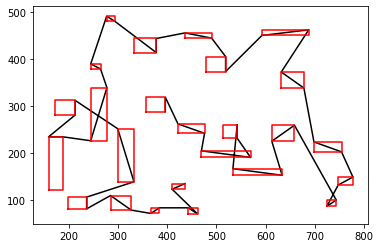

epoch:15, batch:1000/2500, reward:3161.392822265625


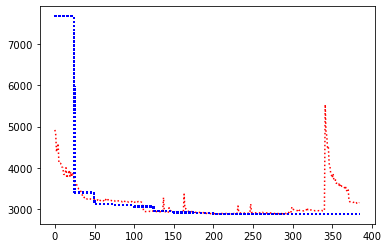

record the last path to gazebo for showing up


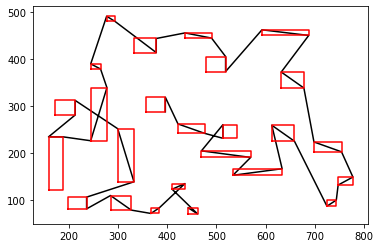

epoch:15, batch:1100/2500, reward:3108.7548828125


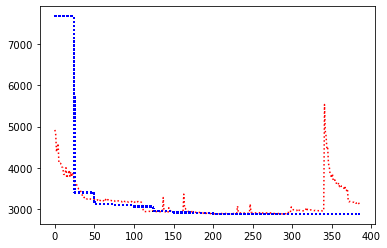

record the last path to gazebo for showing up


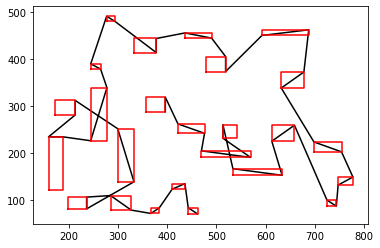

epoch:15, batch:1200/2500, reward:3132.7216796875


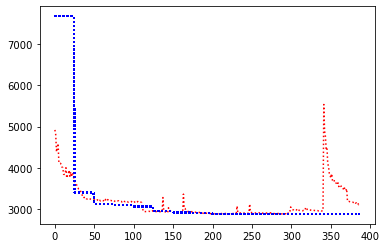

record the last path to gazebo for showing up


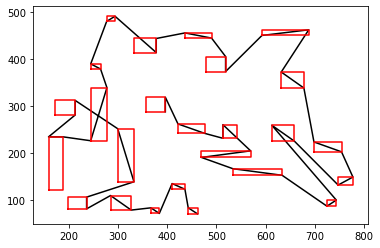

epoch:15, batch:1300/2500, reward:3145.650390625


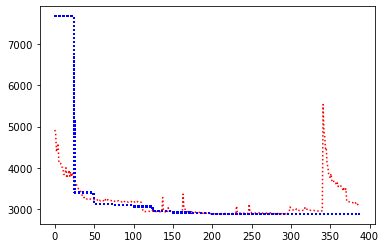

record the last path to gazebo for showing up


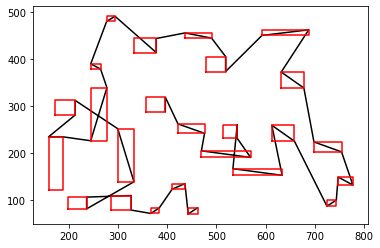

epoch:15, batch:1400/2500, reward:3125.810546875


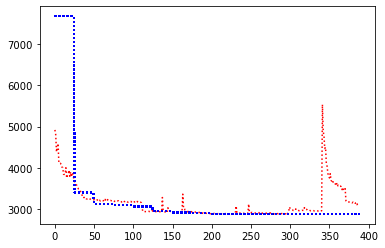

record the last path to gazebo for showing up


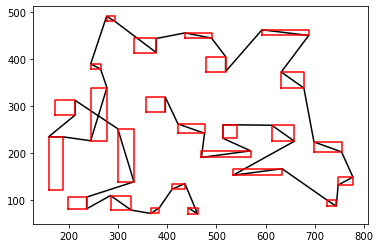

epoch:15, batch:1500/2500, reward:3151.66748046875


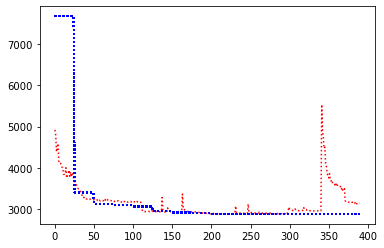

record the last path to gazebo for showing up


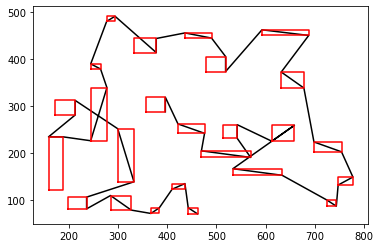

epoch:15, batch:1600/2500, reward:3122.81591796875


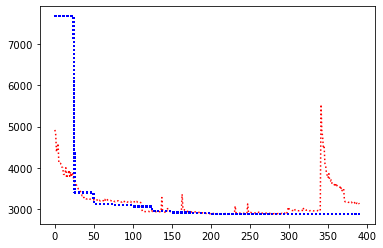

record the last path to gazebo for showing up


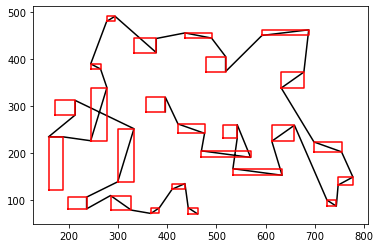

epoch:15, batch:1700/2500, reward:3131.8779296875


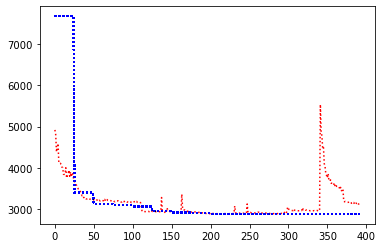

record the last path to gazebo for showing up


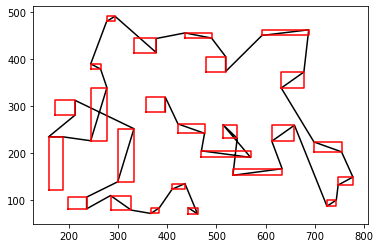

epoch:15, batch:1800/2500, reward:3138.28369140625


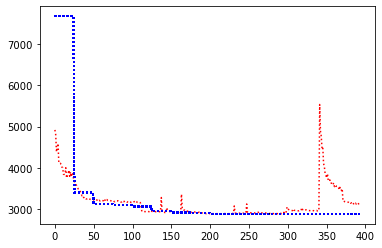

record the last path to gazebo for showing up


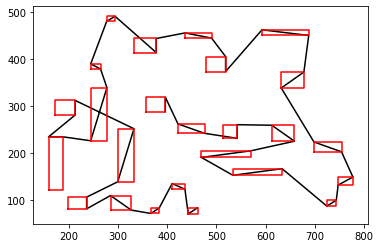

epoch:15, batch:1900/2500, reward:3129.58544921875


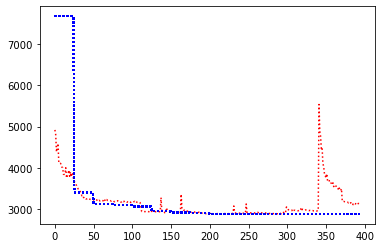

record the last path to gazebo for showing up


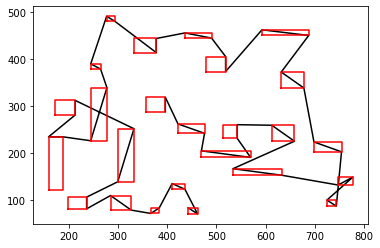

epoch:15, batch:2000/2500, reward:3102.624755859375


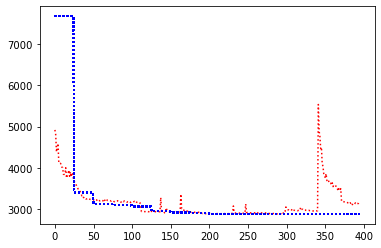

record the last path to gazebo for showing up


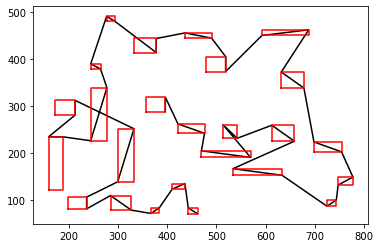

epoch:15, batch:2100/2500, reward:3135.343994140625


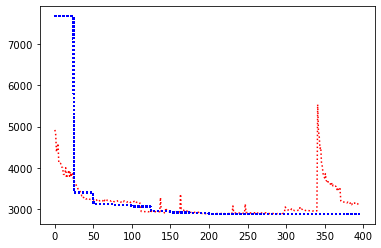

record the last path to gazebo for showing up


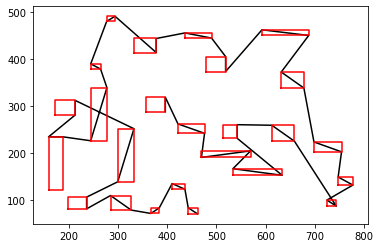

epoch:15, batch:2200/2500, reward:3124.989501953125


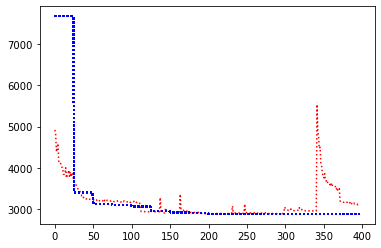

record the last path to gazebo for showing up


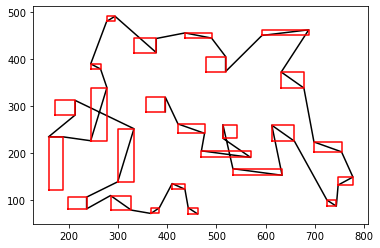

epoch:15, batch:2300/2500, reward:3150.58251953125


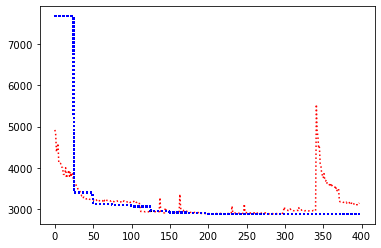

record the last path to gazebo for showing up


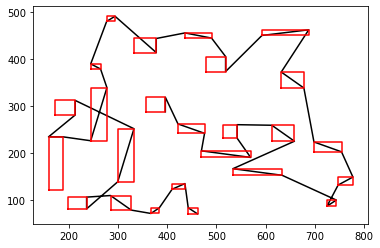

epoch:15, batch:2400/2500, reward:3111.1611328125


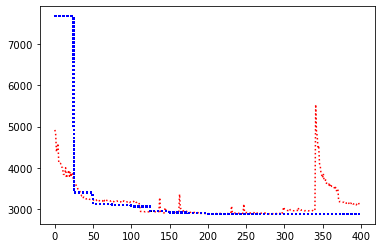

record the last path to gazebo for showing up


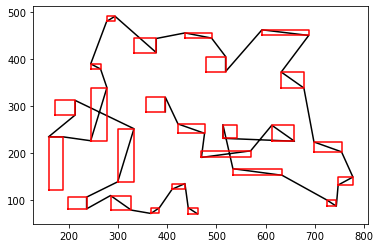

epoch:15, batch:2500/2500, reward:3111.697021484375


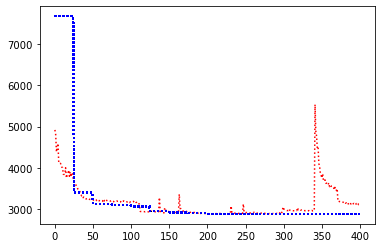

record the last path to gazebo for showing up


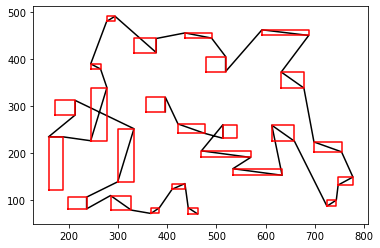

Avg Actor 3064.2080078125 --- Avg Critic 2884.38037109375
Epoch: 15, epoch time: 54.000min, tot time: 0.598day, L_actor: 3064.208, L_critic: 2884.380, update: False
Save Checkpoints
epoch:16, batch:100/2500, reward:3088.04541015625


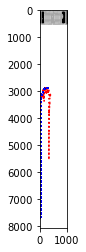

record the last path to gazebo for showing up


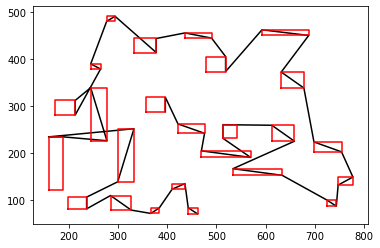

epoch:16, batch:200/2500, reward:3095.759765625


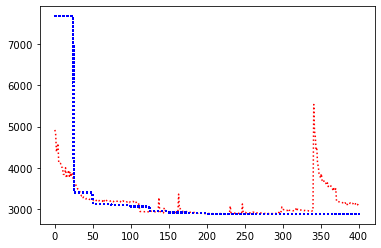

record the last path to gazebo for showing up


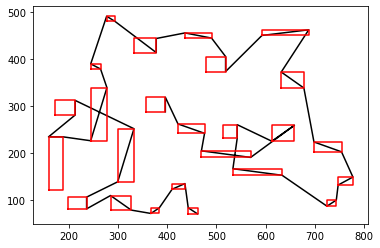

epoch:16, batch:300/2500, reward:3082.6513671875


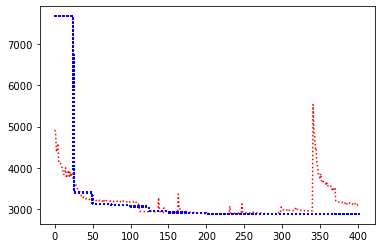

record the last path to gazebo for showing up


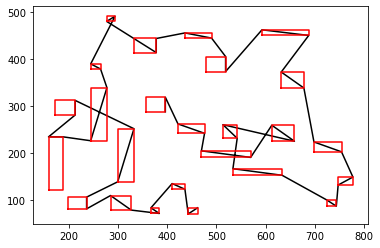

epoch:16, batch:400/2500, reward:3072.6005859375


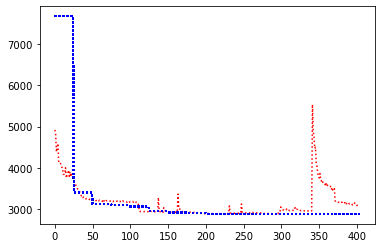

record the last path to gazebo for showing up


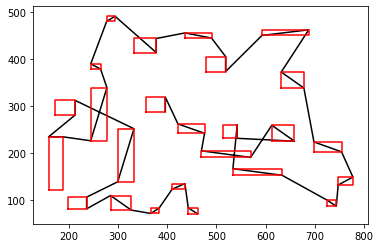

epoch:16, batch:500/2500, reward:3092.66455078125


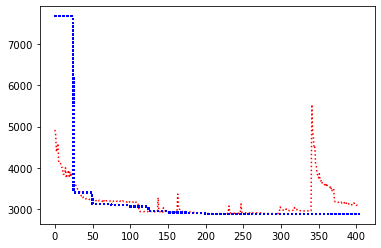

record the last path to gazebo for showing up


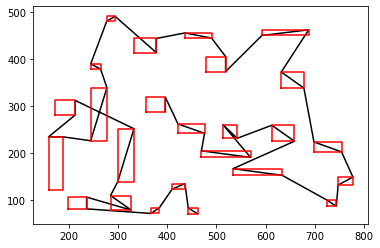

epoch:16, batch:600/2500, reward:3081.917236328125


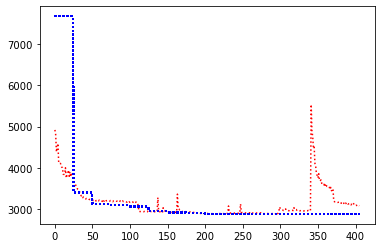

record the last path to gazebo for showing up


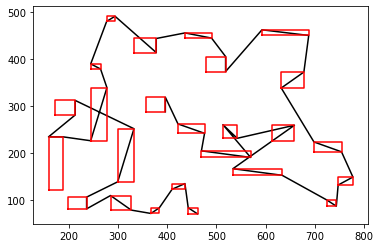

epoch:16, batch:700/2500, reward:3081.017822265625


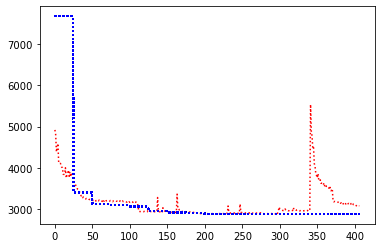

record the last path to gazebo for showing up


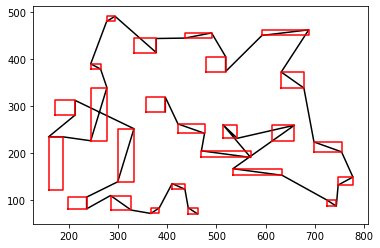

epoch:16, batch:800/2500, reward:3087.061767578125


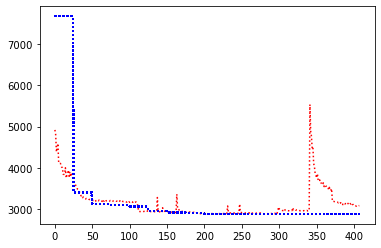

record the last path to gazebo for showing up


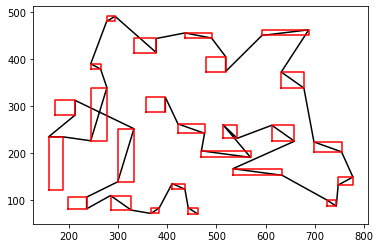

epoch:16, batch:900/2500, reward:3088.59814453125


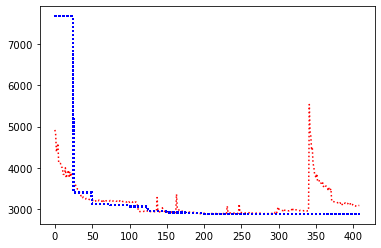

record the last path to gazebo for showing up


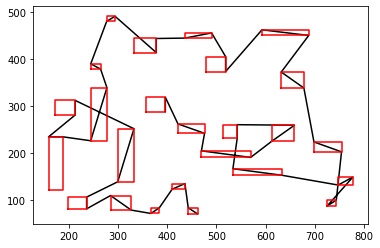

epoch:16, batch:1000/2500, reward:3088.45458984375


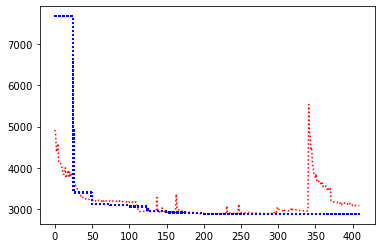

record the last path to gazebo for showing up


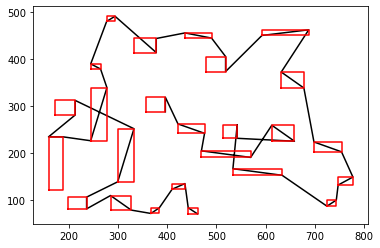

epoch:16, batch:1100/2500, reward:3081.5869140625


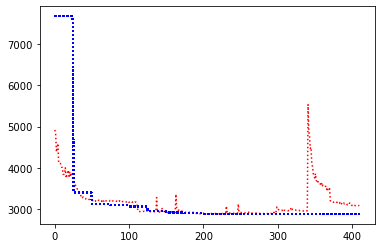

record the last path to gazebo for showing up


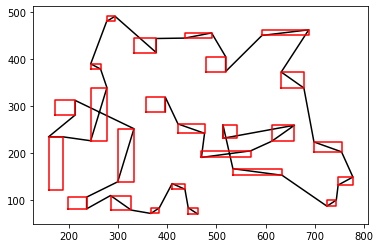

epoch:16, batch:1200/2500, reward:3072.850830078125


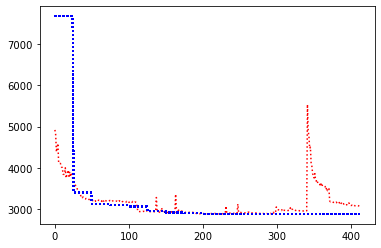

record the last path to gazebo for showing up


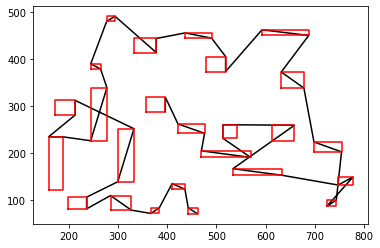

epoch:16, batch:1300/2500, reward:3078.216552734375


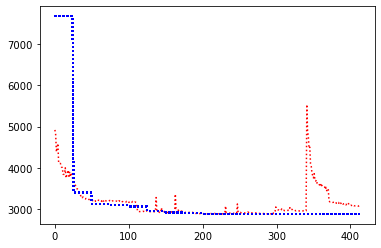

record the last path to gazebo for showing up


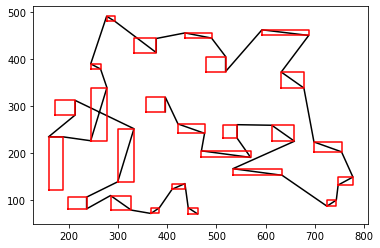

epoch:16, batch:1400/2500, reward:3086.814453125


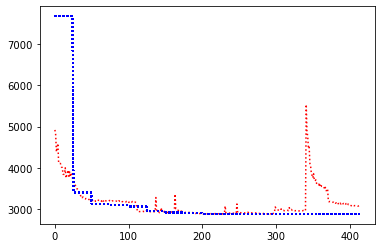

record the last path to gazebo for showing up


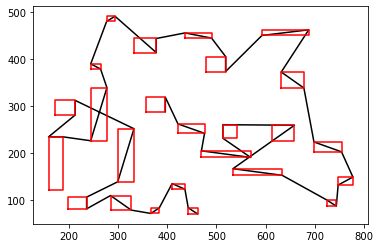

epoch:16, batch:1500/2500, reward:3063.3232421875


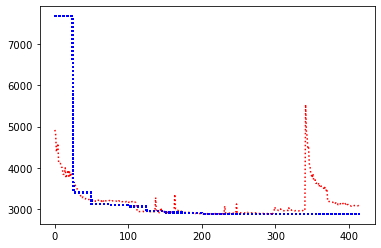

record the last path to gazebo for showing up


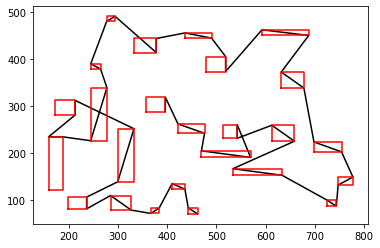

epoch:16, batch:1600/2500, reward:3071.826416015625


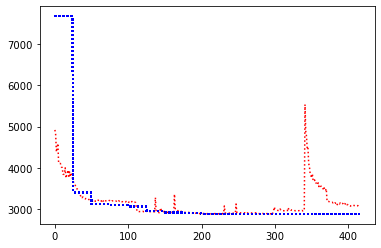

record the last path to gazebo for showing up


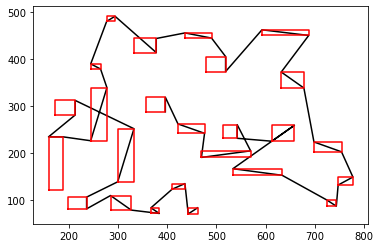

epoch:16, batch:1700/2500, reward:3073.72412109375


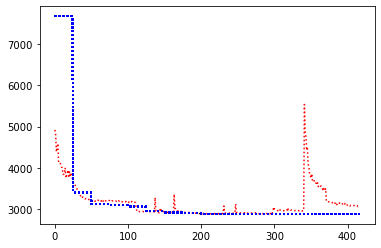

record the last path to gazebo for showing up


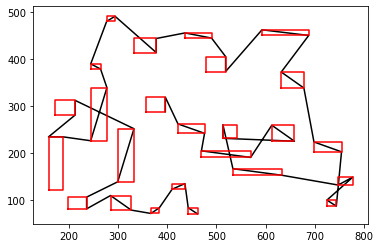

epoch:16, batch:1800/2500, reward:3075.689697265625


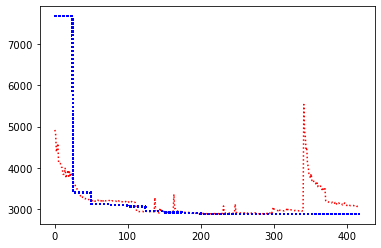

record the last path to gazebo for showing up


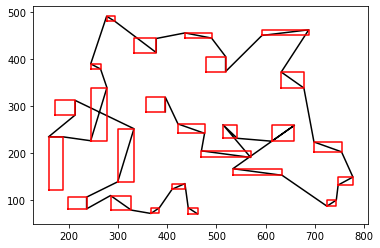

epoch:16, batch:1900/2500, reward:3084.041015625


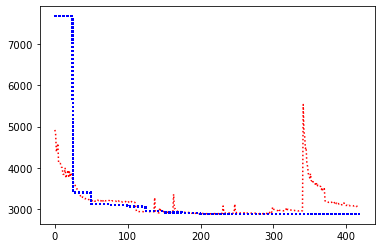

record the last path to gazebo for showing up


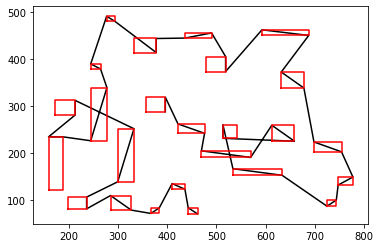

epoch:16, batch:2000/2500, reward:3099.892822265625


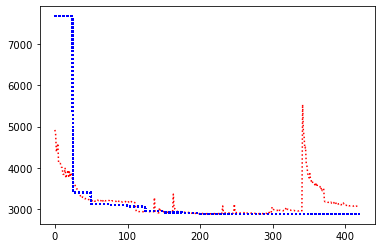

record the last path to gazebo for showing up


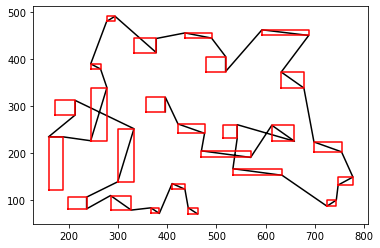

epoch:16, batch:2100/2500, reward:3063.248291015625


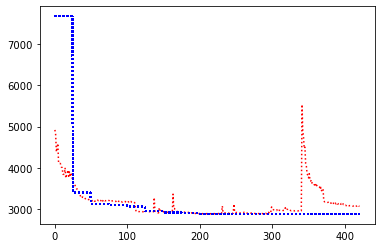

record the last path to gazebo for showing up


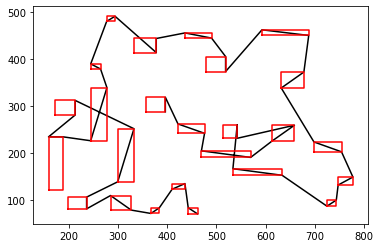

epoch:16, batch:2200/2500, reward:3107.428466796875


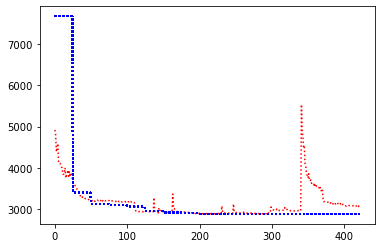

record the last path to gazebo for showing up


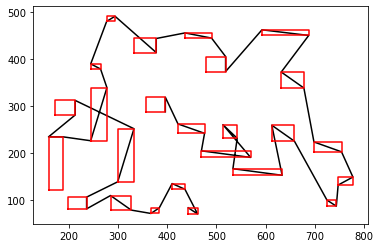

epoch:16, batch:2300/2500, reward:3071.3076171875


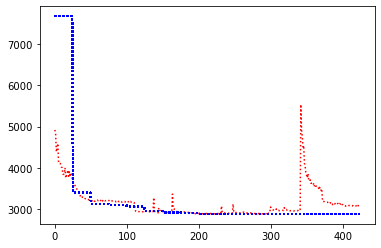

record the last path to gazebo for showing up


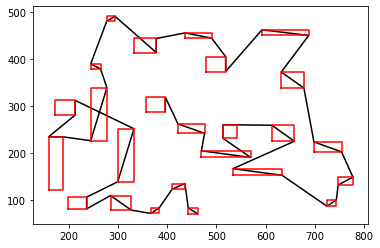

epoch:16, batch:2400/2500, reward:3089.299072265625


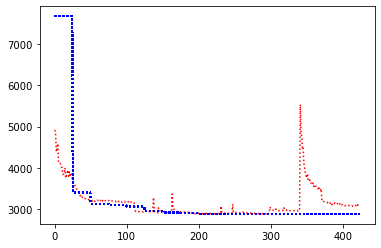

record the last path to gazebo for showing up


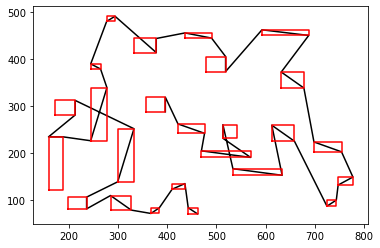

epoch:16, batch:2500/2500, reward:3088.240234375


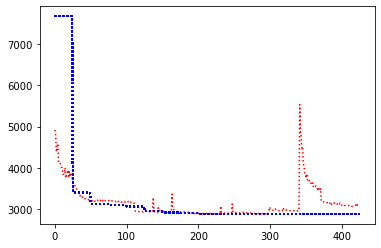

record the last path to gazebo for showing up


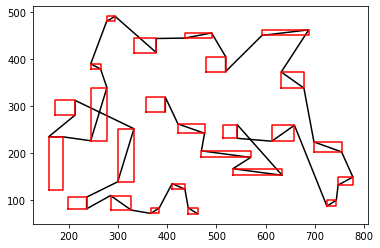

Avg Actor 3038.220458984375 --- Avg Critic 2884.38037109375
Epoch: 16, epoch time: 54.179min, tot time: 0.636day, L_actor: 3038.220, L_critic: 2884.380, update: False
Save Checkpoints
epoch:17, batch:100/2500, reward:3078.6171875


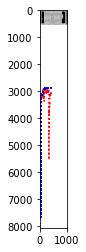

record the last path to gazebo for showing up


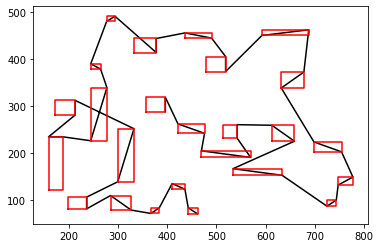

epoch:17, batch:200/2500, reward:3230.04638671875


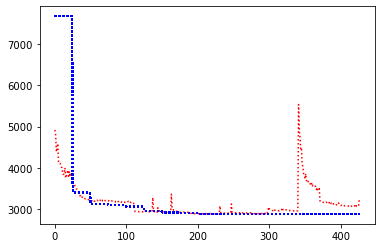

record the last path to gazebo for showing up


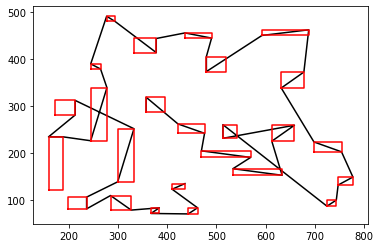

epoch:17, batch:300/2500, reward:3130.89208984375


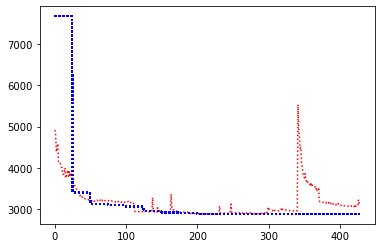

record the last path to gazebo for showing up


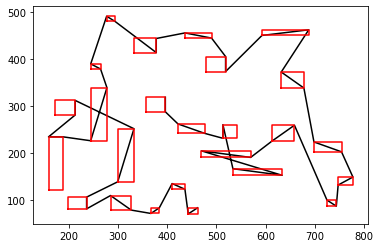

epoch:17, batch:400/2500, reward:3135.32275390625


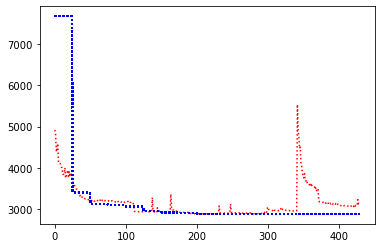

record the last path to gazebo for showing up


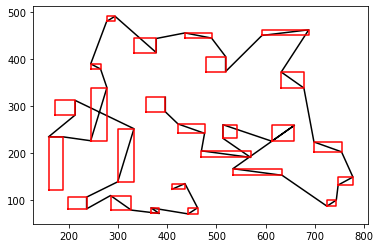

epoch:17, batch:500/2500, reward:3103.80712890625


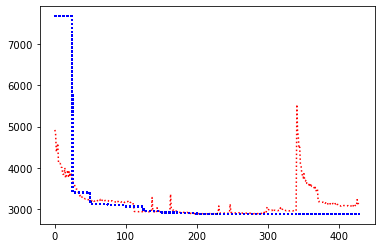

record the last path to gazebo for showing up


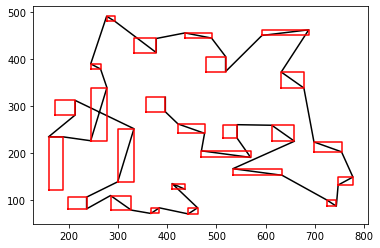

epoch:17, batch:600/2500, reward:3081.68505859375


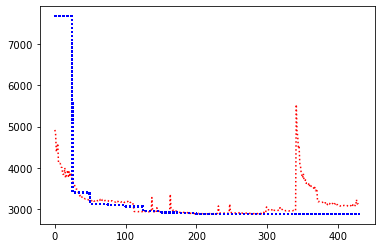

record the last path to gazebo for showing up


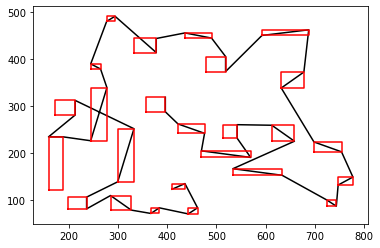

epoch:17, batch:700/2500, reward:3086.8349609375


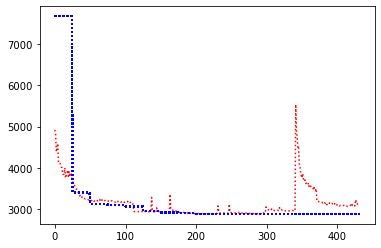

record the last path to gazebo for showing up


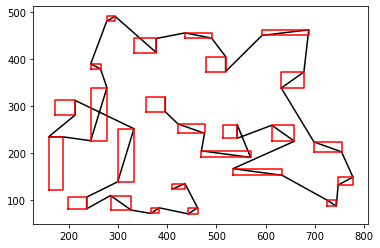

epoch:17, batch:800/2500, reward:3086.39697265625


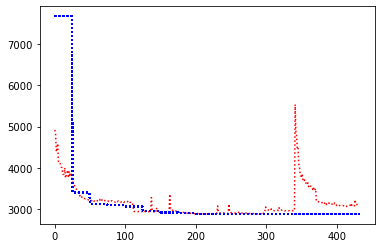

record the last path to gazebo for showing up


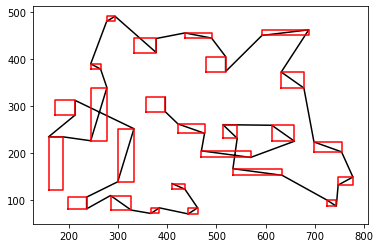

epoch:17, batch:900/2500, reward:3046.03125


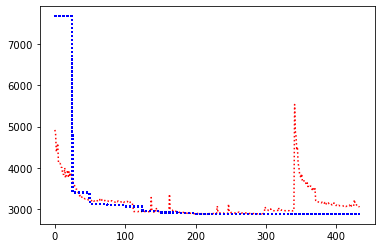

record the last path to gazebo for showing up


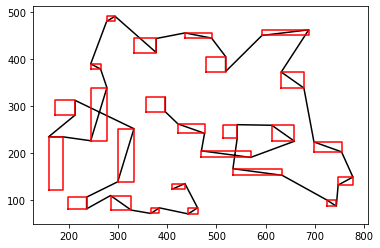

epoch:17, batch:1000/2500, reward:3060.33203125


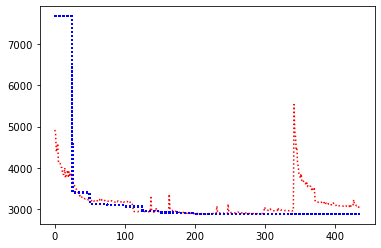

record the last path to gazebo for showing up


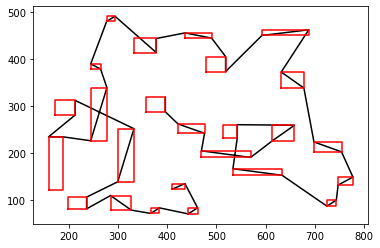

epoch:17, batch:1100/2500, reward:3048.6337890625


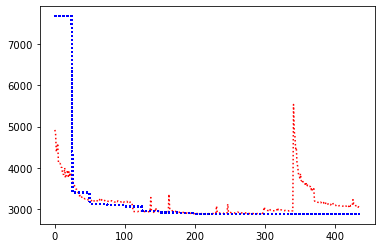

record the last path to gazebo for showing up


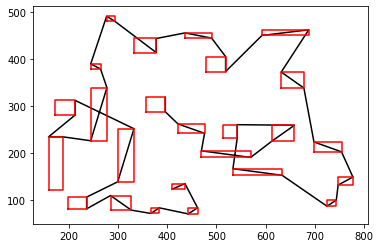

epoch:17, batch:1200/2500, reward:3036.4453125


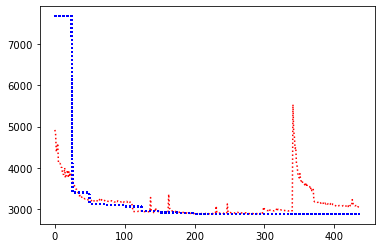

record the last path to gazebo for showing up


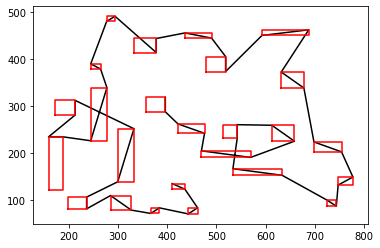

epoch:17, batch:1300/2500, reward:3079.3671875


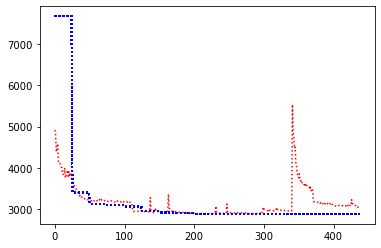

record the last path to gazebo for showing up


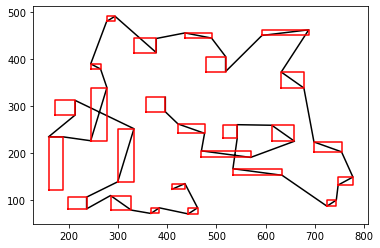

epoch:17, batch:1400/2500, reward:3033.468017578125


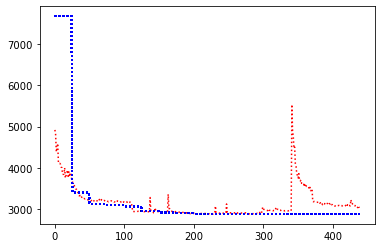

record the last path to gazebo for showing up


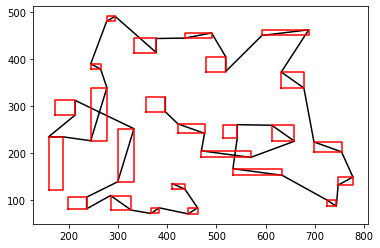

epoch:17, batch:1500/2500, reward:3049.97021484375


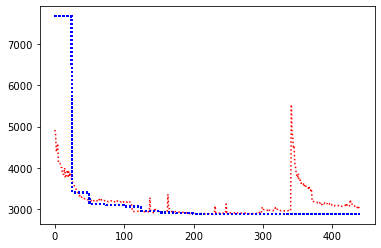

record the last path to gazebo for showing up


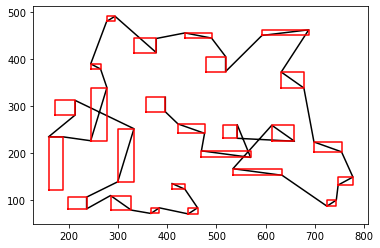

epoch:17, batch:1600/2500, reward:3028.27294921875


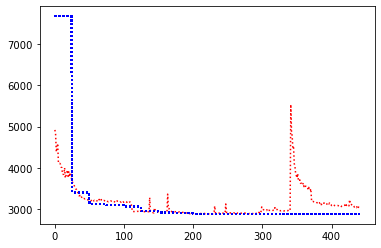

record the last path to gazebo for showing up


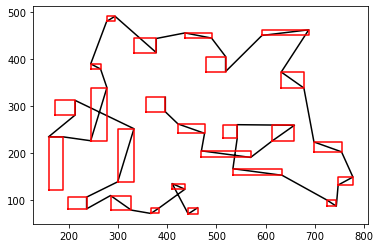

epoch:17, batch:1700/2500, reward:3035.275390625


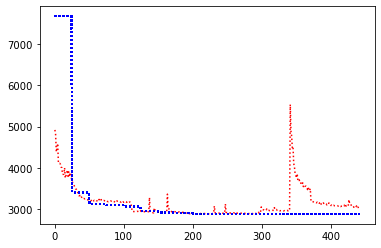

record the last path to gazebo for showing up


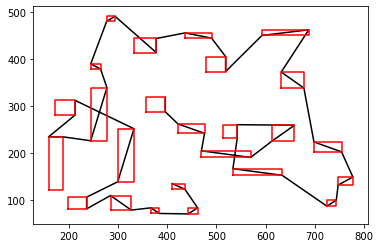

epoch:17, batch:1800/2500, reward:3039.0068359375


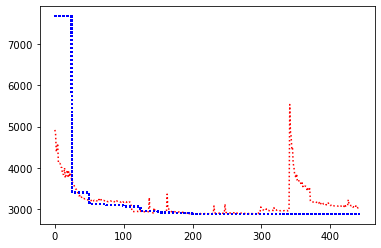

record the last path to gazebo for showing up


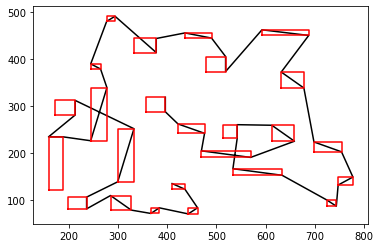

epoch:17, batch:1900/2500, reward:3036.033447265625


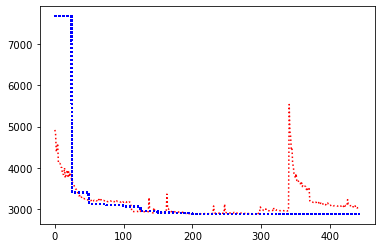

record the last path to gazebo for showing up


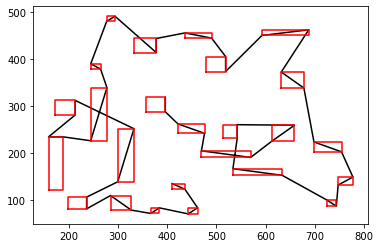

epoch:17, batch:2000/2500, reward:3043.76220703125


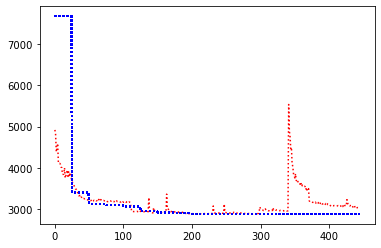

record the last path to gazebo for showing up


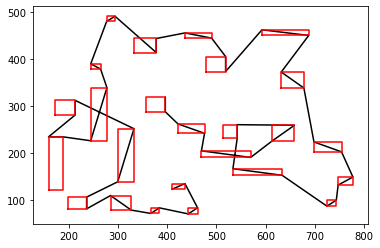

epoch:17, batch:2100/2500, reward:3031.32373046875


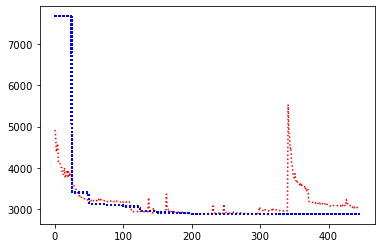

record the last path to gazebo for showing up


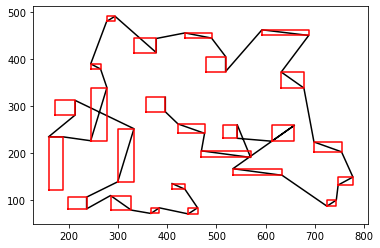

epoch:17, batch:2200/2500, reward:3031.736083984375


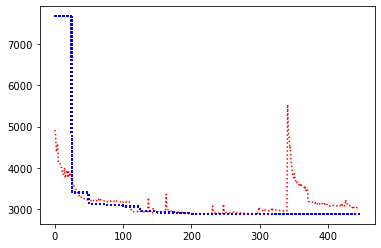

record the last path to gazebo for showing up


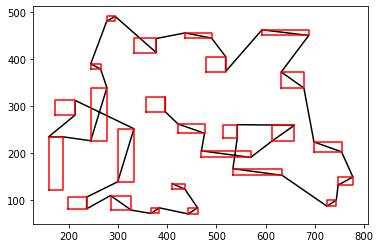

epoch:17, batch:2300/2500, reward:3048.69384765625


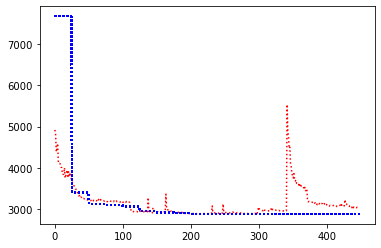

record the last path to gazebo for showing up


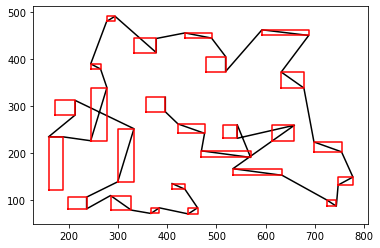

epoch:17, batch:2400/2500, reward:3028.4853515625


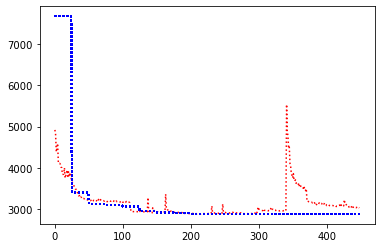

record the last path to gazebo for showing up


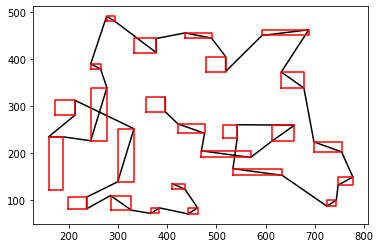

epoch:17, batch:2500/2500, reward:3021.236328125


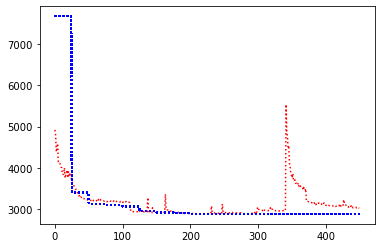

record the last path to gazebo for showing up


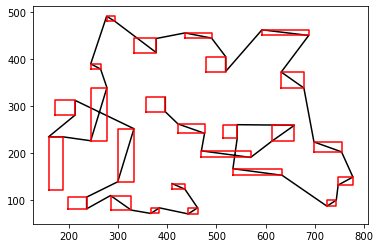

Avg Actor 2961.869384765625 --- Avg Critic 2884.38037109375
Epoch: 17, epoch time: 54.817min, tot time: 0.674day, L_actor: 2961.869, L_critic: 2884.380, update: False
Save Checkpoints
epoch:18, batch:100/2500, reward:3042.1640625


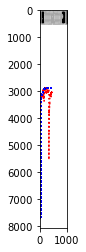

record the last path to gazebo for showing up


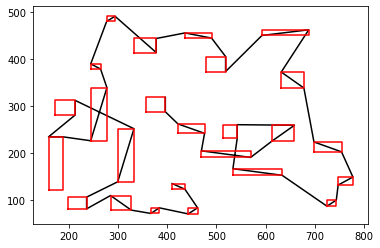

epoch:18, batch:200/2500, reward:3012.1640625


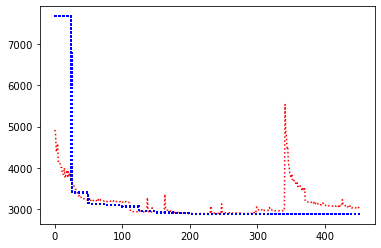

record the last path to gazebo for showing up


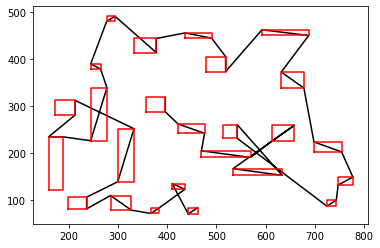

epoch:18, batch:300/2500, reward:3036.10595703125


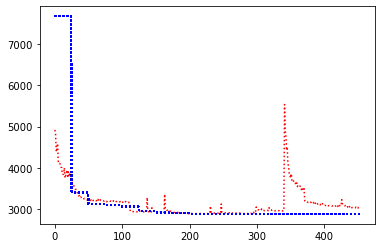

record the last path to gazebo for showing up


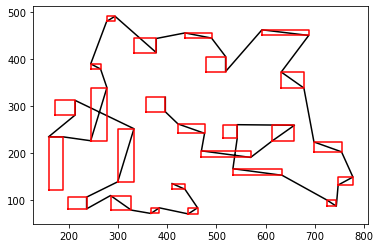

epoch:18, batch:400/2500, reward:3031.42236328125


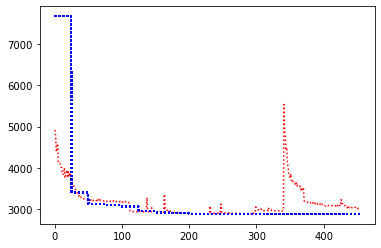

record the last path to gazebo for showing up


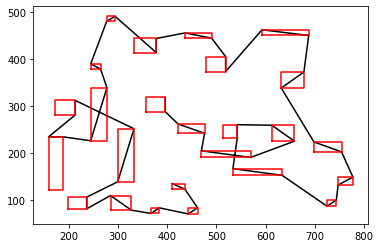

epoch:18, batch:500/2500, reward:3013.2255859375


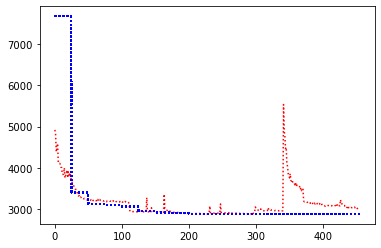

record the last path to gazebo for showing up


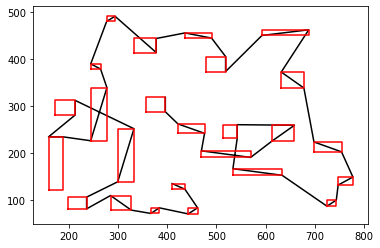

epoch:18, batch:600/2500, reward:3109.83935546875


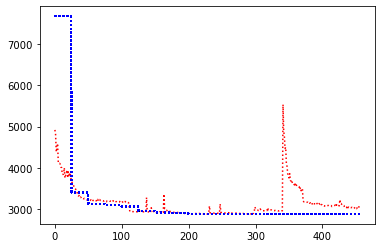

record the last path to gazebo for showing up


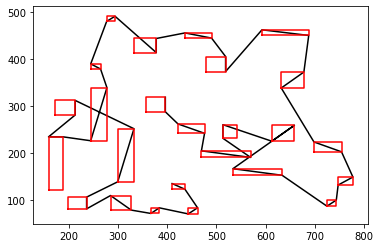

epoch:18, batch:700/2500, reward:3608.779541015625


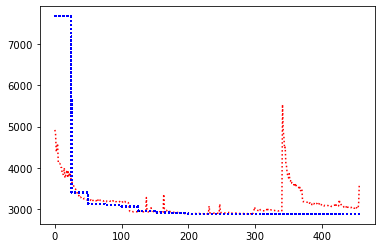

record the last path to gazebo for showing up


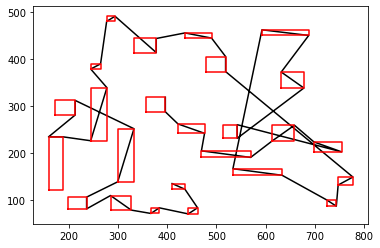

epoch:18, batch:800/2500, reward:3101.19677734375


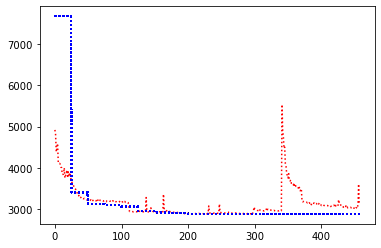

record the last path to gazebo for showing up


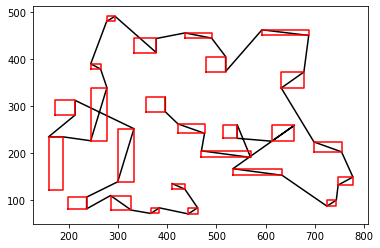

epoch:18, batch:900/2500, reward:3013.06787109375


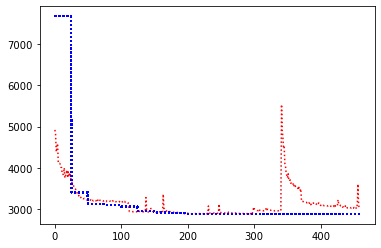

record the last path to gazebo for showing up


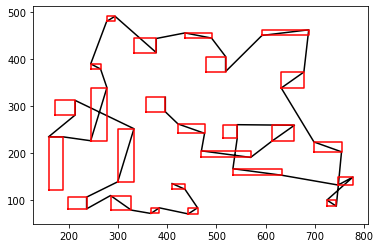

epoch:18, batch:1000/2500, reward:3018.904296875


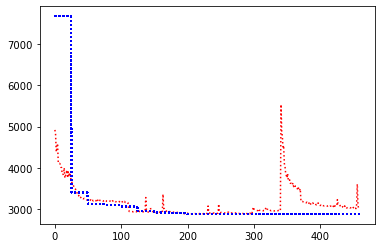

record the last path to gazebo for showing up


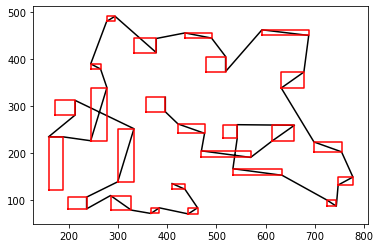

epoch:18, batch:1100/2500, reward:3024.564697265625


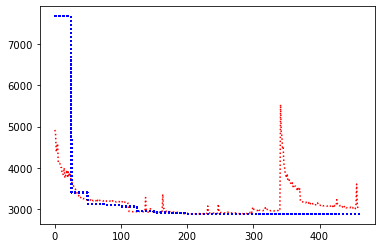

record the last path to gazebo for showing up


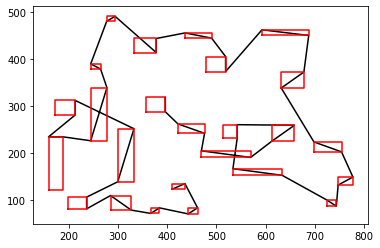

epoch:18, batch:1200/2500, reward:3019.455810546875


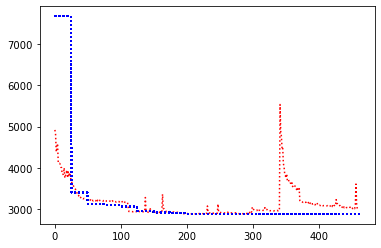

record the last path to gazebo for showing up


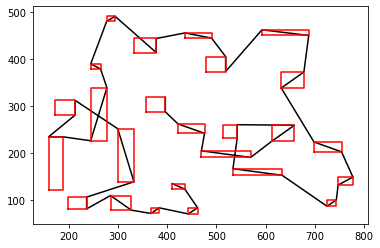

epoch:18, batch:1300/2500, reward:3003.353515625


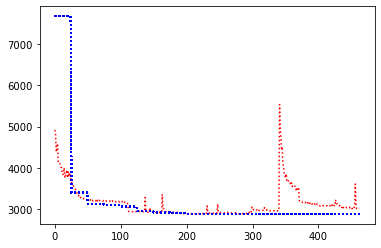

record the last path to gazebo for showing up


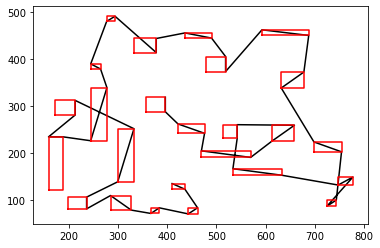

epoch:18, batch:1400/2500, reward:3039.6767578125


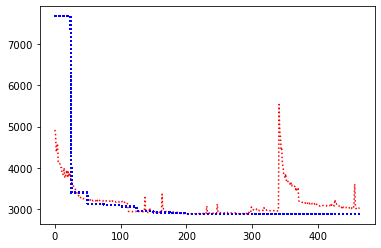

record the last path to gazebo for showing up


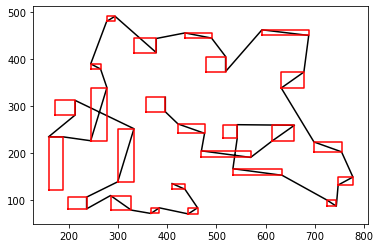

epoch:18, batch:1500/2500, reward:3001.451904296875


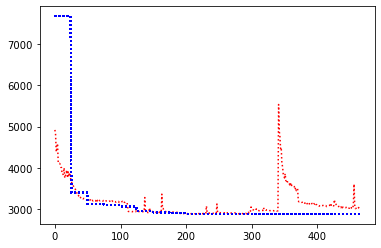

record the last path to gazebo for showing up


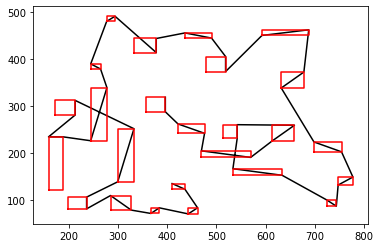

epoch:18, batch:1600/2500, reward:2999.8916015625


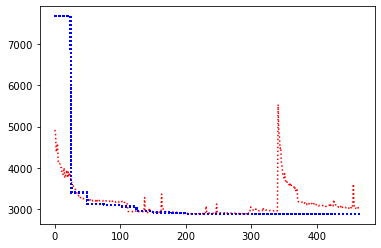

record the last path to gazebo for showing up


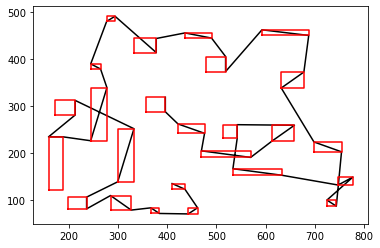

epoch:18, batch:1700/2500, reward:2984.9208984375


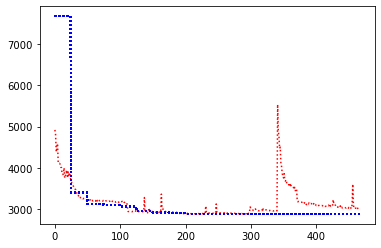

record the last path to gazebo for showing up


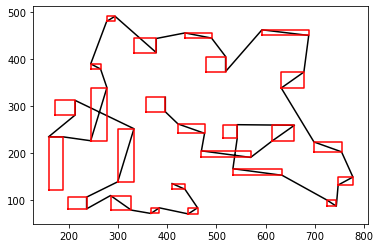

epoch:18, batch:1800/2500, reward:2990.129638671875


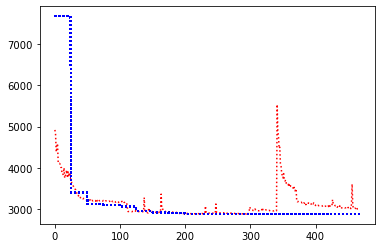

record the last path to gazebo for showing up


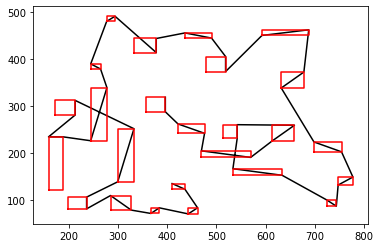

epoch:18, batch:1900/2500, reward:3011.146240234375


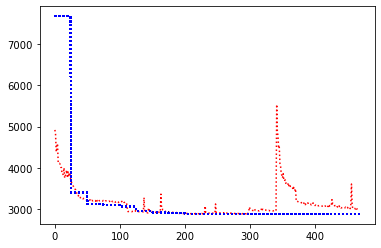

record the last path to gazebo for showing up


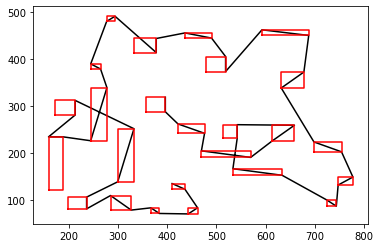

epoch:18, batch:2000/2500, reward:3004.06591796875


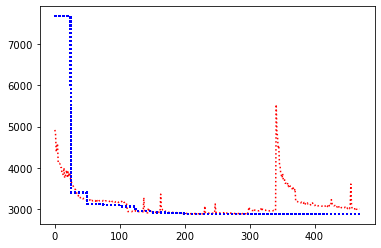

record the last path to gazebo for showing up


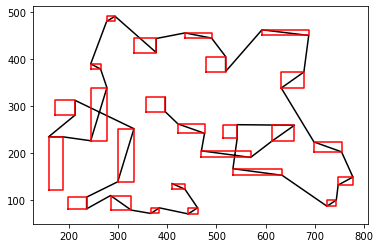

epoch:18, batch:2100/2500, reward:3011.283203125


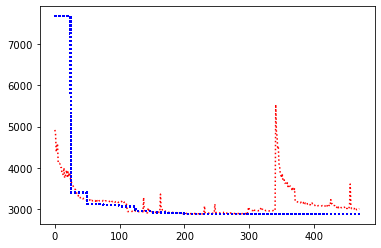

record the last path to gazebo for showing up


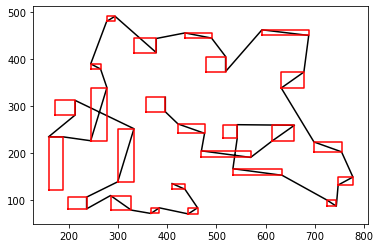

epoch:18, batch:2200/2500, reward:3003.789794921875


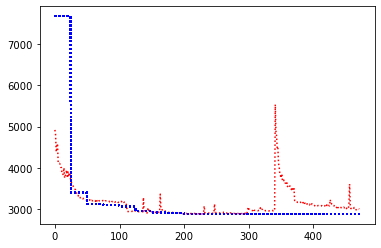

record the last path to gazebo for showing up


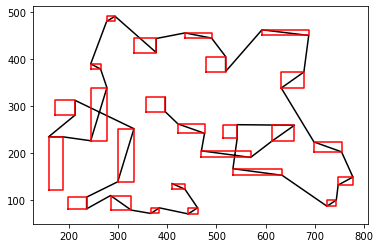

epoch:18, batch:2300/2500, reward:2995.45166015625


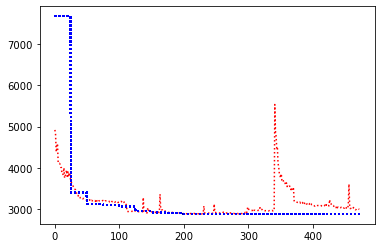

record the last path to gazebo for showing up


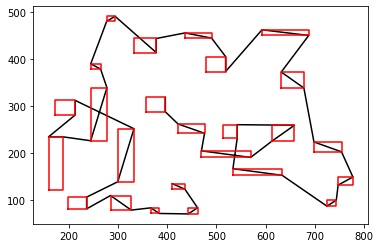

epoch:18, batch:2400/2500, reward:3002.47900390625


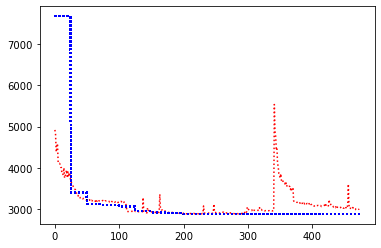

record the last path to gazebo for showing up


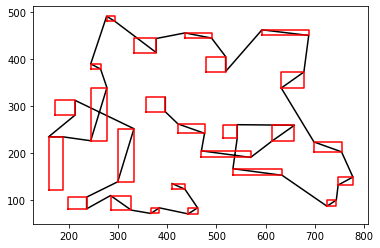

epoch:18, batch:2500/2500, reward:2990.970703125


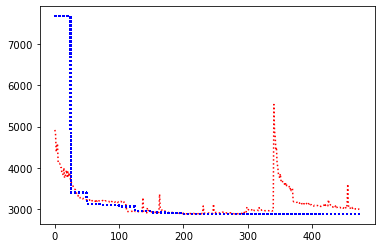

record the last path to gazebo for showing up


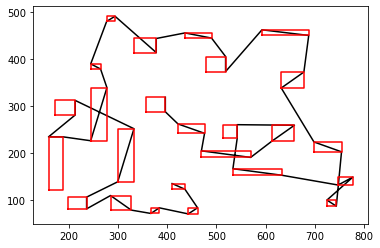

Avg Actor 2960.58349609375 --- Avg Critic 2884.38037109375
Epoch: 18, epoch time: 53.882min, tot time: 0.712day, L_actor: 2960.583, L_critic: 2884.380, update: False
Save Checkpoints
epoch:19, batch:100/2500, reward:2997.369140625


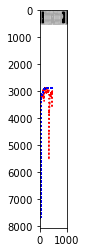

record the last path to gazebo for showing up


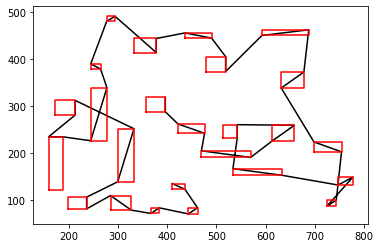

epoch:19, batch:200/2500, reward:3004.42919921875


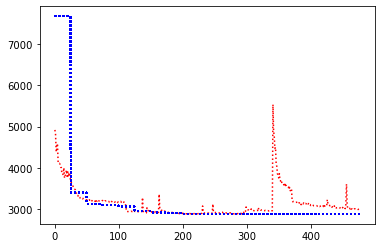

record the last path to gazebo for showing up


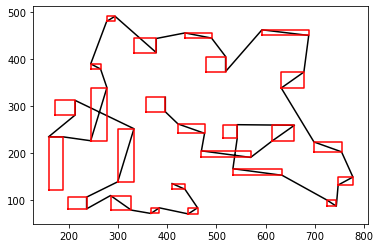

epoch:19, batch:300/2500, reward:2989.00732421875


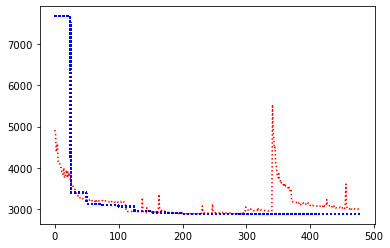

record the last path to gazebo for showing up


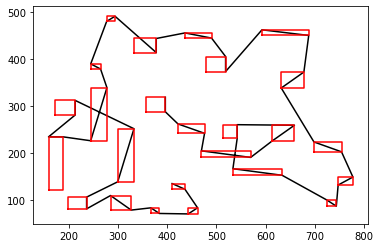

epoch:19, batch:400/2500, reward:3007.536376953125


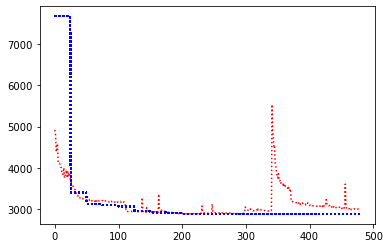

record the last path to gazebo for showing up


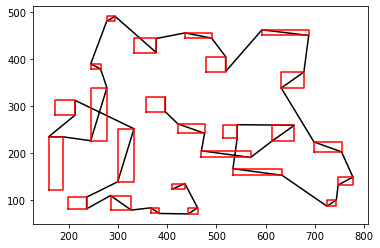

epoch:19, batch:500/2500, reward:3002.373291015625


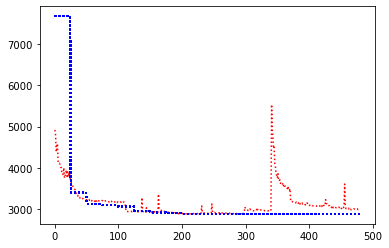

record the last path to gazebo for showing up


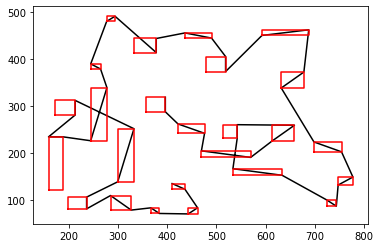

epoch:19, batch:600/2500, reward:2991.96728515625


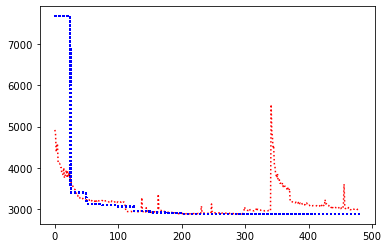

record the last path to gazebo for showing up


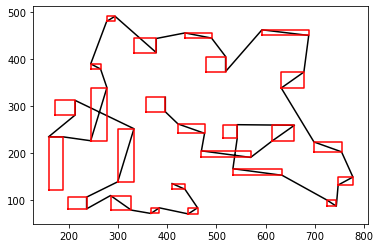

epoch:19, batch:700/2500, reward:3014.23193359375


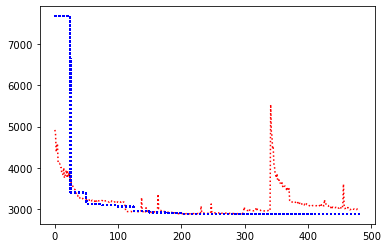

record the last path to gazebo for showing up


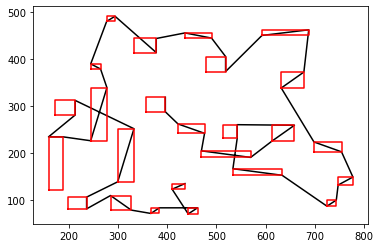

epoch:19, batch:800/2500, reward:2994.196044921875


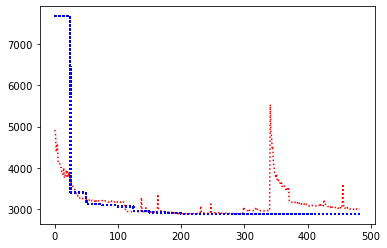

record the last path to gazebo for showing up


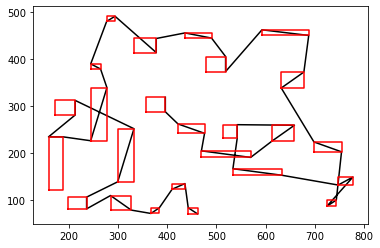

epoch:19, batch:900/2500, reward:2983.89501953125


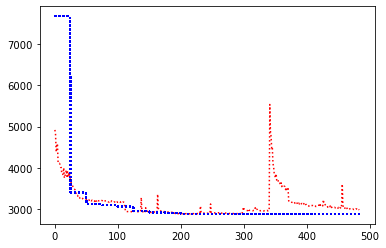

record the last path to gazebo for showing up


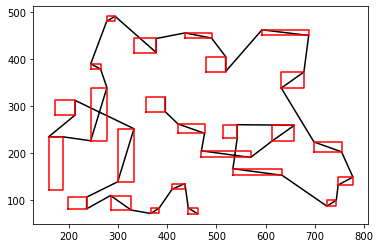

epoch:19, batch:1000/2500, reward:2984.2255859375


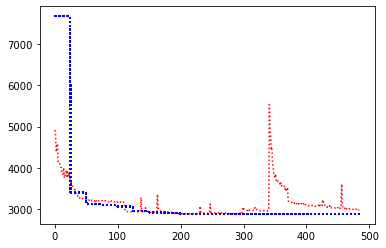

record the last path to gazebo for showing up


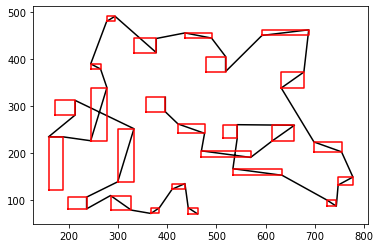

epoch:19, batch:1100/2500, reward:2997.677734375


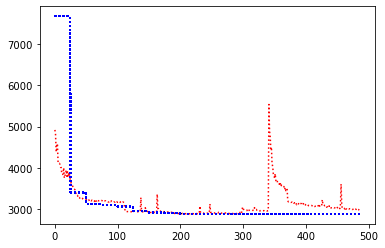

record the last path to gazebo for showing up


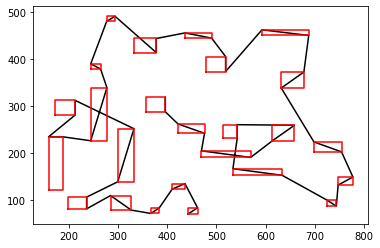

epoch:19, batch:1200/2500, reward:2976.460205078125


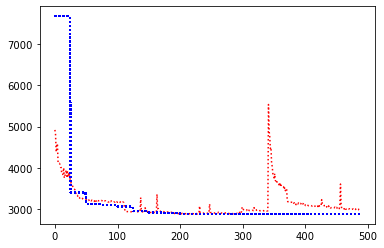

record the last path to gazebo for showing up


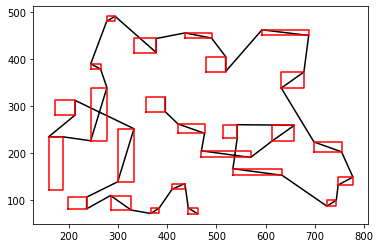

epoch:19, batch:1300/2500, reward:2974.24072265625


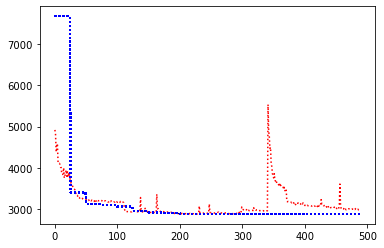

record the last path to gazebo for showing up


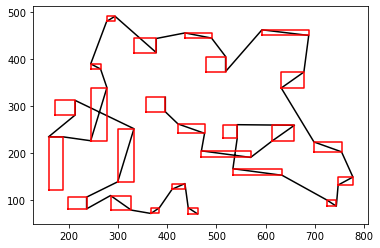

epoch:19, batch:1400/2500, reward:2993.01171875


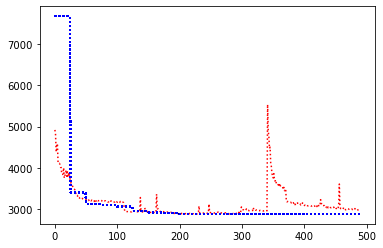

record the last path to gazebo for showing up


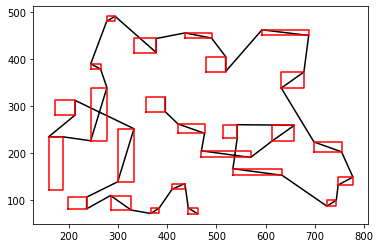

epoch:19, batch:1500/2500, reward:2999.070068359375


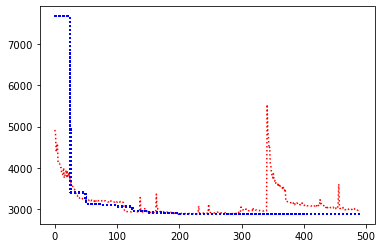

record the last path to gazebo for showing up


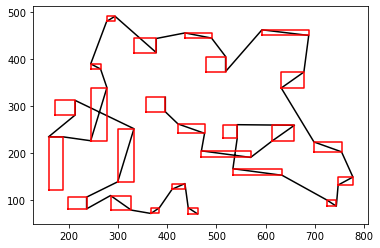

epoch:19, batch:1600/2500, reward:2993.27783203125


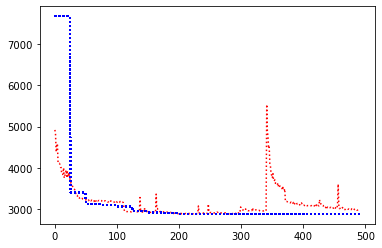

record the last path to gazebo for showing up


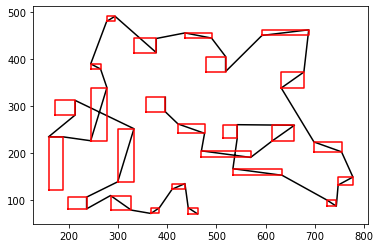

epoch:19, batch:1700/2500, reward:2993.19775390625


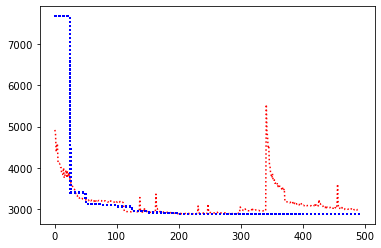

record the last path to gazebo for showing up


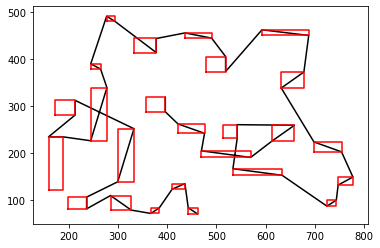

epoch:19, batch:1800/2500, reward:2995.23681640625


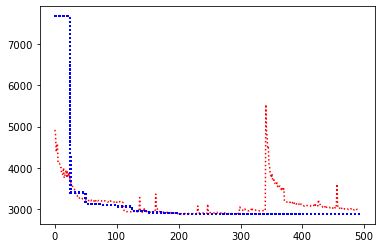

record the last path to gazebo for showing up


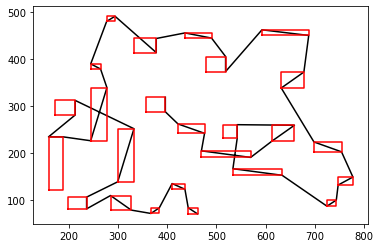

epoch:19, batch:1900/2500, reward:2995.203857421875


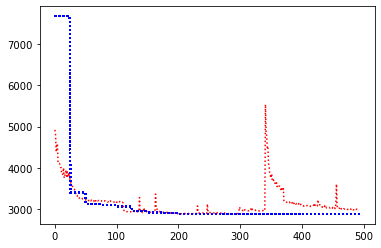

record the last path to gazebo for showing up


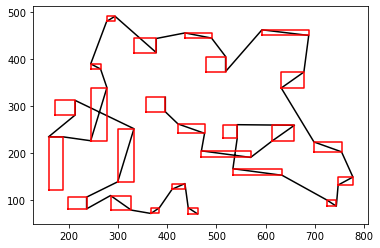

epoch:19, batch:2000/2500, reward:3006.986572265625


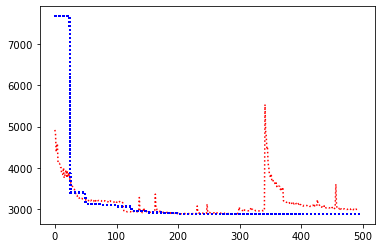

record the last path to gazebo for showing up


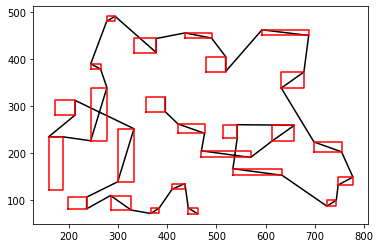

In [ ]:
import yaml
from torch.distributions.categorical import Categorical
# visualization
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
from tqdm import tqdm_notebook
####### my own import file ##########
from listofpathpoint import input_handler
import cnc_input
#from hybrid_models import HPN
####### my own import file ##########
'''
so, the models we have are TransEncoderNet,
                            Attention
                            LSTM
                            HPN
each one have initial parameters and the forward part, 
once we have the forward part, the back propagation will 
finished automatically by pytorch  
'''
size = 100
TOL = 1e-3
TINY = 1e-15
learning_rate = 1e-4   #learning rate
B = 256             #batch size
B_valLoop = 20
steps = 2500
n_epoch = 100       # epochs
size_rec = int(size/4)
record_actor = []
record_critic = []

print('======================')
print('prepare to train')
print('======================')
print('Hyper parameters:')
print('learning rate', learning_rate)
print('batch size', B)
print('steps', steps)
print('epoch', n_epoch)
print('======================')

'''
instantiate a training network and a baseline network
'''
temp = input_handler('10&15data/25_chips/25_1.json')

try:
    del Actor  # remove existing model
    del Critic # remove existing model
except:
    pass
Actor = HPN(n_feature = 2, n_hidden = 128)
Critic = HPN(n_feature = 2, n_hidden = 128)
optimizer = optim.Adam(Actor.parameters(), lr=learning_rate)

# Putting Critic model on the eval mode
Actor = Actor.to(device)
Critic = Critic.to(device)
Critic.eval()

epoch_ckpt = 0
tot_time_ckpt = 0

val_mean = []
val_std = []

plot_performance_train = []
plot_performance_baseline = []
# recording the result of the resent epoch makes it available for future
#*********************# Uncomment these lines to load the previous check point
"""
checkpoint_file = "checkpoint/transpointer_mother_board.pkl"
checkpoint = torch.load(checkpoint_file, map_location=device)
epoch_ckpt = checkpoint['epoch'] + 1
tot_time_ckpt = checkpoint['tot_time']
plot_performance_train = checkpoint['plot_performance_train']
plot_performance_baseline = checkpoint['plot_performance_baseline']
Critic.load_state_dict(checkpoint['model_baseline'])
Actor.load_state_dict(checkpoint['model_train'])
optimizer.load_state_dict(checkpoint['optimizer'])

print('Re-start training with saved checkpoint file={:s}\n  Checkpoint at epoch= {:d} and time={:.3f}min\n'.format(checkpoint_file,epoch_ckpt-1,tot_time_ckpt/60))

"""
#***********************# Uncomment these lines to load the previous check point

# Main training loop
# The core training concept mainly upon Sampling from the actor
# then taking the greedy action from the critic


start_training_time = time.time()
time_stamp = datetime.datetime.now().strftime("%y-%m-%d--%H-%M-%S") # Load the time stamp

C = 0       # baseline => the object which the actor can compare
R = 0       # reward

zero_to_bsz = torch.arange(B, device = device) # a list contains 0 to (batch size -1)

for epoch in range(0, n_epoch):
    
    # re-start training with saved checkpoint
    epoch += epoch_ckpt # adding the number of the former epochs
    # Train the model for one epoch
    start = time.time() # record the starting time
    Actor.train() 
    X_temp = temp.every_point()
    X_temp = torch.FloatTensor(X_temp)
    f_temp = input_handler('10&15data/25_chips/25_1.json')
    X = X_temp.repeat(B,1,1)
    X = X.cuda()
    path_gazebo = []
    
    for i in range(1, steps+1): # 1 ~ 2500 steps
        mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose
        R = 0
        logprobs = 0
        reward = 0
        Y = X.view(B,size,2)
        x = torch.zeros(B,2)#Y[:,0,:] #set the first point to x
        h = None
        c = None
        context = None        #set Y_ini to the out corner
        Transcontext = None
        Y0 = None
        # Actor Sampling phase
        for k in range(size_rec):
            context, Transcontext, output, h, c, _ = Actor(context,Transcontext,x=x, X_all=X, h=h, c=c, mask=mask)
            sampler = torch.distributions.Categorical(output)
            idx = sampler.sample()
             #prepare for the back propagation of pytorch
            reward, Y0,x = rectangle_process_actor(f_temp, idx,Y,Y0,mask,k,B,i,path_gazebo)
            R += reward
            logprobs += torch.log(output[zero_to_bsz, idx.data] + TINY)
            ##mask[zero_to_bsz, idx.data] += -np.inf
# critic baseline phase, use the baseline to compute the actual reward of agent at that time
        mask = torch.zeros(B,size).cuda() # use mask to make some points impossible to choose
        C = 0
        baseline = 0
        Y = X.view(B,size,2)
        x = torch.zeros(B,2)#Y[:,0,:] #set the first point to x
        h = None
        c = None
        context = None
        Transcontext = None
        C0 = None
        # compute tours for baseline without grad "Cause we want to fix the weights for the critic"
        with torch.no_grad():
            for k in range(size_rec):      
                context, Transcontext, output, h, c, _ = Critic(context,Transcontext,x=x, X_all=X, h=h, c=c, mask=mask)
                idx = torch.argmax(output, dim=1) # ----> greedy baseline critic
                # prepare for the back propagation of pytorch
                baseline, C0,x = rectangle_process(f_temp,idx,Y,C0, mask,k,B)
                C += baseline
        ###################
        # Loss and backprop handling 
        ###################
        
        loss = torch.mean((R - C) * logprobs)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if i % 100 == 0:
            print("epoch:{}, batch:{}/{}, reward:{}".format(epoch, i, steps,R.mean().item()))
            record_actor.append(R.mean().tolist())
            record_critic.append(C.tolist())
            plt.plot(record_actor,'r:')
            plt.plot(record_critic,'b:')
            plt.show()
        if i % 100 == 0:
            print("record the last path to gazebo for showing up")
            #starting to show the path on simulated enviroment of cnc_machine 
            the_resent_path = temp.zig_zag_path(path_gazebo)
            data = {'path':the_resent_path}
            data_1 = {'corners':path_gazebo}
            pathpoints_dir = os.path.join("pathpoints")
            if not os.path.exists(pathpoints_dir):
                os.makedirs(pathpoints_dir)
            name = 'pathpoints/path_points '+str(i)+'.yaml'
            with open(name, 'w') as file:
                documents = yaml.dump(data,file)
                documents = yaml.dump(data_1,file)
            path_gazebo = []
    time_one_epoch = time.time() - start #recording the work time of one epoch
    time_tot = time.time() - start_training_time + tot_time_ckpt
    ###################
    # Evaluate train model and baseline 
    # in this phase we just solve random instances with the actor and the critic
    # compare this soluation if we get any improvment we'll transfer the actor's
    # weights into the critic
    ###################
    # putting the actor in the eval mode
    Actor.eval()
    
    mean_tour_length_actor = 0
    mean_tour_length_critic = 0

    for step in range(0,B_valLoop):
        
        # compute tour for model and baseline
        X_temp_val = temp.every_point()
        X_temp_val = torch.FloatTensor(X_temp_val)
        X_val = X_temp_val.repeat(B,1,1)
        X_val = X_val.cuda()
        mask = torch.zeros(B,size).cuda()
        R = 0
        reward = 0
        Y = X_val.view(B,size,2)
        x = torch.zeros(B,2)#Y[:,0,:] #set the first point to x
        Y0 = None
        h = None
        c = None
        context = None
        Transcontext = None

        with torch.no_grad():
            for k in range(size_rec):
                #same as the above part
                context, Transcontext, output, h, c, _ = Actor(context,Transcontext,x=x, X_all=X, h=h, c=c, mask=mask)
                idx = torch.argmax(output, dim=1)
                # prepare for the back propagation of pytorch
                reward, Y0,x = rectangle_process(f_temp, idx,Y,Y0, mask,k,B)
                R += reward
        # critic baseline
        mask = torch.zeros(B,size).cuda()
        C = 0
        baseline = 0
        
        Y = X_val.view(B,size,2)
        x = torch.zeros(B,2)#Y[:,0,:] #set the first point to x
        
        h = None
        c = None
        context = None
        Transcontext = None
        
        with torch.no_grad():
            for k in range(size_rec):
                #same as the above part
                context, Transcontext, output, h, c, _ = Critic(context,Transcontext,x=x, X_all=X, h=h, c=c, mask=mask)
                idx = torch.argmax(output, dim=1)  
                # prepare for the back propagation of pytorch
                baseline, Y0,x = rectangle_process(f_temp, idx,Y,Y0, mask,k,B)
                C += baseline

        mean_tour_length_actor  += R.mean().item()
        mean_tour_length_critic += C.mean().item()

    mean_tour_length_actor  =  mean_tour_length_actor  / B_valLoop
    mean_tour_length_critic =  mean_tour_length_critic / B_valLoop
    # evaluate train model and baseline and update if train model is better

    update_baseline = mean_tour_length_actor + TOL < mean_tour_length_critic

    print('Avg Actor {} --- Avg Critic {}'.format(mean_tour_length_actor,mean_tour_length_critic))

    if update_baseline:
        Critic.load_state_dict(Actor.state_dict())
        print('My actor is going on the right road Hallelujah :) Updated')
    ###################
    # Valdiation train model and baseline on 1k random TSP instances
    ###################
    # erased by daniel due to the 1K tsp is not the scale I want to train  

    # For checkpoint
    plot_performance_train.append([(epoch+1), mean_tour_length_actor])
    plot_performance_baseline.append([(epoch+1), mean_tour_length_critic])
    # compute the optimally gap ==> this is interesting because there is no LKH or other optimal algorithms 
    # for the problem like this rectangle characterized map
    mystring_min = 'Epoch: {:d}, epoch time: {:.3f}min, tot time: {:.3f}day, L_actor: {:.3f}, L_critic: {:.3f}, update: {}'.format(
        epoch, time_one_epoch/60, time_tot/86400, mean_tour_length_actor, mean_tour_length_critic, update_baseline)

    print(mystring_min)
    print('Save Checkpoints')

    # Saving checkpoint
    checkpoint_dir = os.path.join("checkpoint")

    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    
    torch.save({
        'epoch': epoch,
        'time': time_one_epoch,
        'tot_time': time_tot,
        'loss': loss.item(),
        'plot_performance_train': plot_performance_train,
        'plot_performance_baseline': plot_performance_baseline,
        'model_baseline': Critic.state_dict(),
        'model_train': Actor.state_dict(),
        'optimizer': optimizer.state_dict(),
        },'{}.pkl'.format(checkpoint_dir + "/checkpoint_" + time_stamp + "-n{}".format(size) + "-gpu{}".format(gpu_id)))


  




                
            
                
        
                        

In [ ]:
import torch
index = int(9.34)
table = [[1,2],[3,4]]
table_1 = [[3,44],[5,6]]
table = torch.as_tensor(table)
table_1 = torch.as_tensor(table_1)
result = torch.maximum(table_1[:,0],table_1[:,1])
print(result)

In [ ]:
import numpy as np
x = [[1,2],[3,4],[5,6],[7,8],[9,10],[11,12]]
x = np.array(x)
x = np.reshape(x,(2,3,2))
for i in x:
    print(i)
print(x)